In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap 
import cmasher as cmr
import math as m
plt.rc('font', family='serif')

## POSSUM Band 1

# Counts

In [2]:
MS_MS_3000_band1_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/band1/band1_condensed_simMS_model_num_7_sims.csv')
MS_RFG_3000_band1_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/band1/band1_condensed_simMS_model_num_10_sims.csv')

MS_band1_true = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/band1/mixedslab_unif_fg_number_7000_freq_800_1089_ran_SNR_band1.csv')

MS_band1_true.rename(columns={'Unnamed: 0':'src'}, inplace=True)


MS_MS_3000_band1_df['src'] = MS_MS_3000_band1_df['src'] - 1               
MS_RFG_3000_band1_df['src'] = MS_RFG_3000_band1_df['src'] - 1        

MS_MS_band1_merge = pd.merge(MS_MS_3000_band1_df, MS_band1_true, on='src', how='inner')
MS_RFG_band1_merge = pd.merge(MS_RFG_3000_band1_df, MS_band1_true, on='src', how='inner')



MS_MS_10000_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/band1/b1_MS_condensed_sim7_model_num_10000_sims.csv')
MS_10000_band1_true_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/band1/mixedslab_unif_fg_number_10000_freq_800_1089_SNR_band1.csv')
MS_10000_band1_true_df.rename(columns={'Unnamed: 0':'src'}, inplace=True )
MS_MS_10000_df['src'] = MS_MS_10000_df['src'] - 1

MS_MS_band1_merge_10000 = pd.merge(MS_MS_10000_df, MS_10000_band1_true_df, on='src', how='inner')
MS_MS_band1_merge_17000 = pd.concat([MS_MS_band1_merge_10000, MS_MS_band1_merge])

print(len(MS_MS_band1_merge_17000))
print(MS_RFG_band1_merge.keys())

MS_MS_10000_sigma_limit_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/band1/b1_MS_condensed_sim7_model_num_10000_sims_sigma_limit.csv')
MS_MS_10000_sigma_limit_df['src'] = MS_MS_10000_sigma_limit_df['src'] - 1
MS_MS_band1_merge_sigma_limit_10000 = pd.merge(MS_MS_10000_sigma_limit_df, MS_10000_band1_true_df, on='src', how='inner')

print((MS_RFG_band1_merge.sigmaRM_FG))

14439
Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'sigmaRM_radm2', 'fracPol_plus_err', 'psi0_deg_plus_err',
       'RM_radm2_plus_err', 'sigmaRM_radm2_plus_err', 'fracPol_minus_err',
       'psi0_deg_minus_err', 'RM_radm2_minus_err', 'sigmaRM_radm2_minus_err',
       'fracPol_bounds', 'psi0_deg_bounds', 'RM_radm2_bounds',
       'sigmaRM_radm2_bounds', 'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC',
       'ln(EVIDENCE) ', 'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y',
       'RM_screen_radm2', 'RM_src_radm2', 'sigma_RM_2', 'sigmaRM_FG', 'SNR',
       'model', 'frac_pol_seed', 'RM_screen_seed', 'RM_source_seed',
       'sigmaRM_seed', 'sigma_FG_seed', 'psi0_seed'],
      dtype='object')
0       0
1       0
2       0
3       0
4       0
       ..
6995    0
6996    0
6997    0
6998    0
6999    0
Name: sigmaRM_FG, Length: 7000, dtype: int64


<>:5: SyntaxWarning: invalid escape sequence '\s'
<>:6: SyntaxWarning: invalid escape sequence '\s'
<>:10: SyntaxWarning: invalid escape sequence '\s'
<>:12: SyntaxWarning: invalid escape sequence '\s'
<>:5: SyntaxWarning: invalid escape sequence '\s'
<>:6: SyntaxWarning: invalid escape sequence '\s'
<>:10: SyntaxWarning: invalid escape sequence '\s'
<>:12: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1442633537.py:5: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM, src}$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1442633537.py:6: SyntaxWarning: invalid escape sequence '\s'
  plt.colorbar(label='$\sigma_{RM,true}$ - $\sigma_{FG, m2}$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1442633537.py:10: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM, src, true}$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1442633537.py:12:

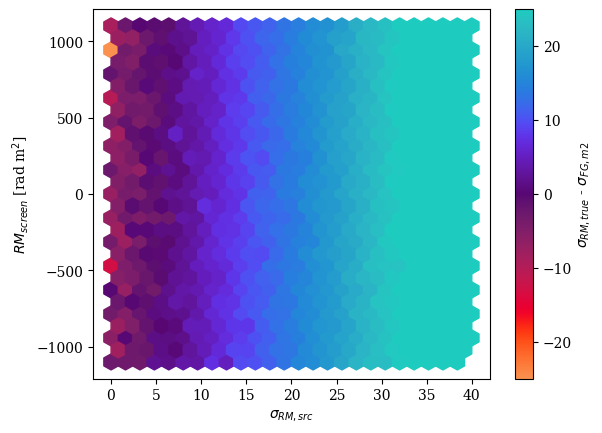

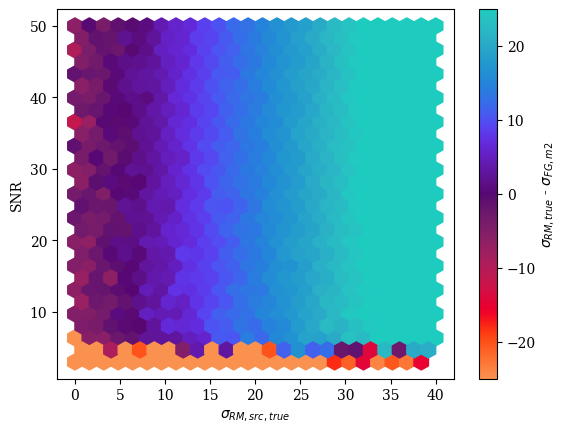

In [3]:

sigma_redisuals = MS_RFG_band1_merge.sigma_RM_2 - MS_RFG_band1_merge.sigmaRM_radm2

plt.hexbin(MS_RFG_band1_merge.sigma_RM_2, MS_RFG_band1_merge.RM_screen_radm2, sigma_redisuals, gridsize=25, cmap='cmr.guppy', reduce_C_function=np.median, vmin=-25, vmax=25)
plt.ylabel('$RM_{screen}$ [rad m$^2$]')
plt.xlabel('$\sigma_{RM, src}$')
plt.colorbar(label='$\sigma_{RM,true}$ - $\sigma_{FG, m2}$')
plt.show()

plt.hexbin(MS_RFG_band1_merge.sigma_RM_2, MS_RFG_band1_merge.SNR, sigma_redisuals, gridsize=25, cmap='cmr.guppy', reduce_C_function=np.median, vmin=-25, vmax=25)
plt.xlabel('$\sigma_{RM, src, true}$')
plt.ylabel('SNR')
plt.colorbar(label='$\sigma_{RM,true}$ - $\sigma_{FG, m2}$')
plt.show()

# CHeck to see if the error are the same Plus and minus

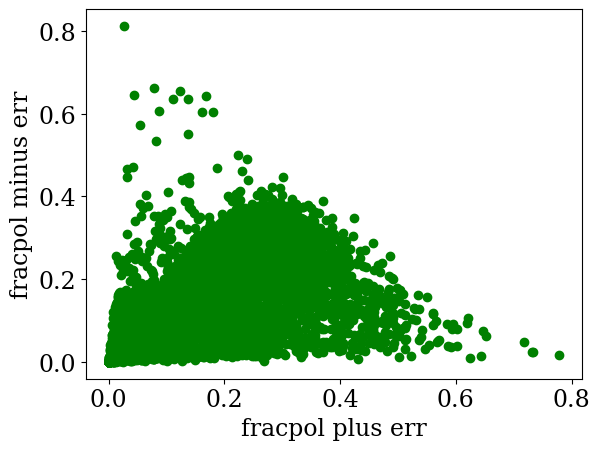

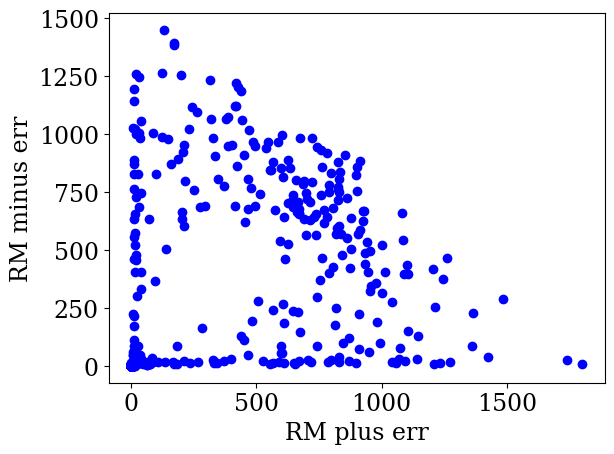

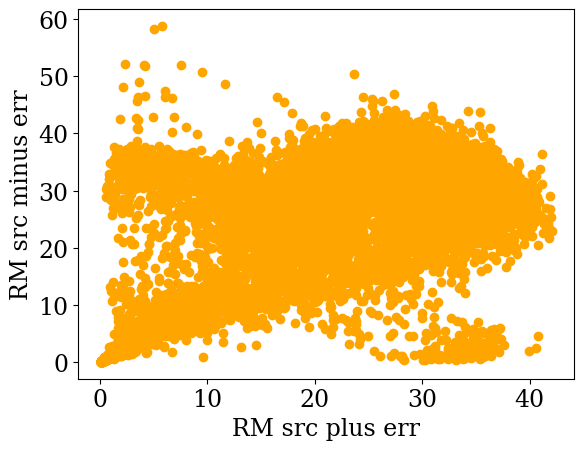

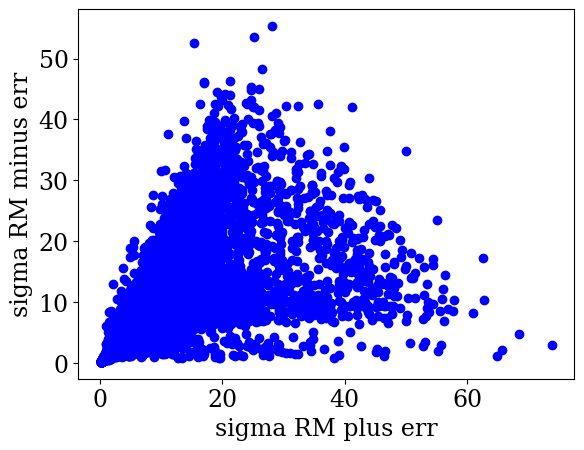

Text(0, 0.5, 'sigma RM minus err')

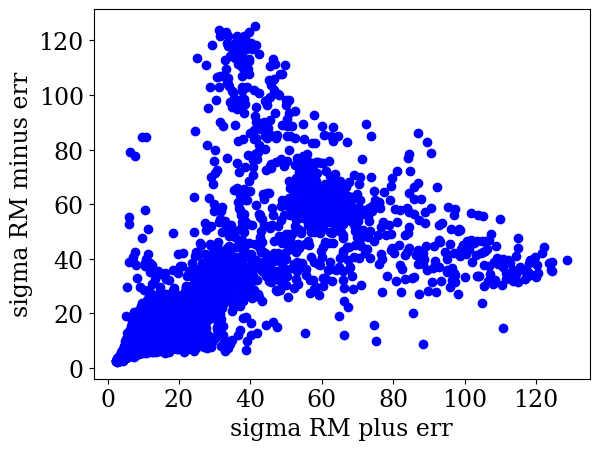

In [178]:
plt.scatter(MS_MS_band1_merge_17000.fracPol_plus_err, MS_MS_band1_merge_17000.fracPol_minus_err, color='green')
plt.xlabel('fracpol plus err')
plt.ylabel('fracpol minus err')
plt.show()
plt.scatter(MS_MS_band1_merge_17000.RM_radm2_plus_err, MS_MS_band1_merge_17000.RM_radm2_minus_err, color='blue')
plt.xlabel('RM plus err')
plt.ylabel('RM minus err')
plt.show()
plt.scatter(MS_MS_band1_merge_17000.deltaRM_radm2_plus_err, MS_MS_band1_merge_17000.deltaRM_radm2_minus_err, color='orange')
plt.xlabel('RM src plus err')
plt.ylabel('RM src minus err')
plt.show()
plt.scatter(MS_MS_band1_merge_17000.sigmaRM_radm2_plus_err, MS_MS_band1_merge_17000.sigmaRM_radm2_minus_err, color='blue')
plt.xlabel('sigma RM plus err')
plt.ylabel('sigma RM minus err')
plt.show()
plt.scatter(MS_MS_band1_merge_17000.psi0_deg_plus_err, MS_MS_band1_merge_17000.psi0_deg_minus_err, color='blue')
plt.xlabel('sigma RM plus err')
plt.ylabel('sigma RM minus err')


# Create a function to calculated the error scaled residuals 

In [179]:
print(MS_MS_band1_merge_17000.keys())
MS_MS_band1_merge_17000['p_err_residual'] = MS_MS_band1_merge_17000['frac_pol'] - MS_MS_band1_merge_17000['fracPol']
MS_MS_band1_merge_17000['psi_err_residual'] = MS_MS_band1_merge_17000['psi0_deg_y'] - MS_MS_band1_merge_17000['psi0_deg_x']
MS_MS_band1_merge_17000['RM_err_residual'] = MS_MS_band1_merge_17000['RM_screen_radm2'] - MS_MS_band1_merge_17000['RM_radm2']
MS_MS_band1_merge_17000['RM_src_err_residual'] = MS_MS_band1_merge_17000['RM_src_radm2'] - MS_MS_band1_merge_17000['deltaRM_radm2']
MS_MS_band1_merge_17000['sigma_RM_err_residual'] = MS_MS_band1_merge_17000['sigma_RM_2'] - MS_MS_band1_merge_17000['sigmaRM_radm2']


MS_MS_band1_merge_17000['p_err_residual_err'] = np.where(MS_MS_band1_merge_17000['p_err_residual'] > 0, MS_MS_band1_merge_17000['p_err_residual']/MS_MS_band1_merge_17000['fracPol_plus_err'], MS_MS_band1_merge_17000['p_err_residual']/MS_MS_band1_merge_17000['fracPol_minus_err'])
MS_MS_band1_merge_17000['psi_err_residual_err'] = np.where(MS_MS_band1_merge_17000['psi_err_residual'] > 0, MS_MS_band1_merge_17000['psi_err_residual']/MS_MS_band1_merge_17000['psi0_deg_plus_err'], MS_MS_band1_merge_17000['psi_err_residual']/MS_MS_band1_merge_17000['psi0_deg_minus_err'])
MS_MS_band1_merge_17000['RM_err_residual_err'] = np.where(MS_MS_band1_merge_17000['RM_err_residual'] > 0, MS_MS_band1_merge_17000['RM_err_residual']/MS_MS_band1_merge_17000['RM_radm2_plus_err'], MS_MS_band1_merge_17000['RM_err_residual']/MS_MS_band1_merge_17000['RM_radm2_minus_err'])
MS_MS_band1_merge_17000['RM_src_err_residual_err'] = np.where(MS_MS_band1_merge_17000['RM_src_err_residual'] > 0, MS_MS_band1_merge_17000['RM_src_err_residual']/MS_MS_band1_merge_17000['deltaRM_radm2_plus_err'], MS_MS_band1_merge_17000['RM_src_err_residual']/MS_MS_band1_merge_17000['deltaRM_radm2_minus_err'])
MS_MS_band1_merge_17000['sigma_RM_err_residual_err'] = np.where(MS_MS_band1_merge_17000['sigma_RM_err_residual'] > 0, MS_MS_band1_merge_17000['sigma_RM_err_residual']/MS_MS_band1_merge_17000['RM_radm2_plus_err'], MS_MS_band1_merge_17000['sigma_RM_err_residual']/MS_MS_band1_merge_17000['sigmaRM_radm2_minus_err'])







print(np.mean(MS_MS_band1_merge_17000['psi_err_residual_err']))
print(np.mean(MS_MS_band1_merge_17000['p_err_residual_err']))
print(np.mean(MS_MS_band1_merge_17000['RM_err_residual_err']))
print(np.median(MS_MS_band1_merge_17000['RM_src_err_residual_err']))
print(np.median(MS_MS_band1_merge_17000['sigma_RM_err_residual_err']))

print(np.std(MS_MS_band1_merge_17000['psi_err_residual_err']))
print(np.std(MS_MS_band1_merge_17000['p_err_residual_err']))
print(np.std(MS_MS_band1_merge_17000['RM_err_residual_err']))
print(np.std(MS_MS_band1_merge_17000['RM_src_err_residual_err']))
print(np.std(MS_MS_band1_merge_17000['sigma_RM_err_residual_err']))




Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'deltaRM_radm2', 'sigmaRM_radm2', 'fracPol_plus_err',
       'psi0_deg_plus_err', 'RM_radm2_plus_err', 'deltaRM_radm2_plus_err',
       'sigmaRM_radm2_plus_err', 'fracPol_minus_err', 'psi0_deg_minus_err',
       'RM_radm2_minus_err', 'deltaRM_radm2_minus_err',
       'sigmaRM_radm2_minus_err', 'fracPol_bounds', 'psi0_deg_bounds',
       'RM_radm2_bounds', 'deltaRM_radm2_bounds', 'sigmaRM_radm2_bounds',
       'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC', 'ln(EVIDENCE) ',
       'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y', 'psi0_2_deg',
       'RM_screen_radm2', 'RM_screen_2_radm2', 'RM_src_radm2', 'sigma_RM_2',
       'sigmaRM_FG', 'frac_pol_2_comp', 'SNR', 'model', 'frac_pol_seed',
       'RM_screen_seed', 'RM_source_seed', 'sigmaRM_seed', 'sigma_FG_seed',
       'psi0_seed'],
      dtype='object')
0.02816699967143562
-0.7814557154503764
0.03602459233345509
-0.23675594081581405
-0.8499672492879597
4.496738278448632
1.2

# Residuals
Removed the bad fits

# Make the histograms first

<>:21: SyntaxWarning: invalid escape sequence '\s'
<>:21: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/4186510140.py:21: SyntaxWarning: invalid escape sequence '\s'
  ax2.set_xlabel('Residual$_{{\sigma_{src}}}$ / error')


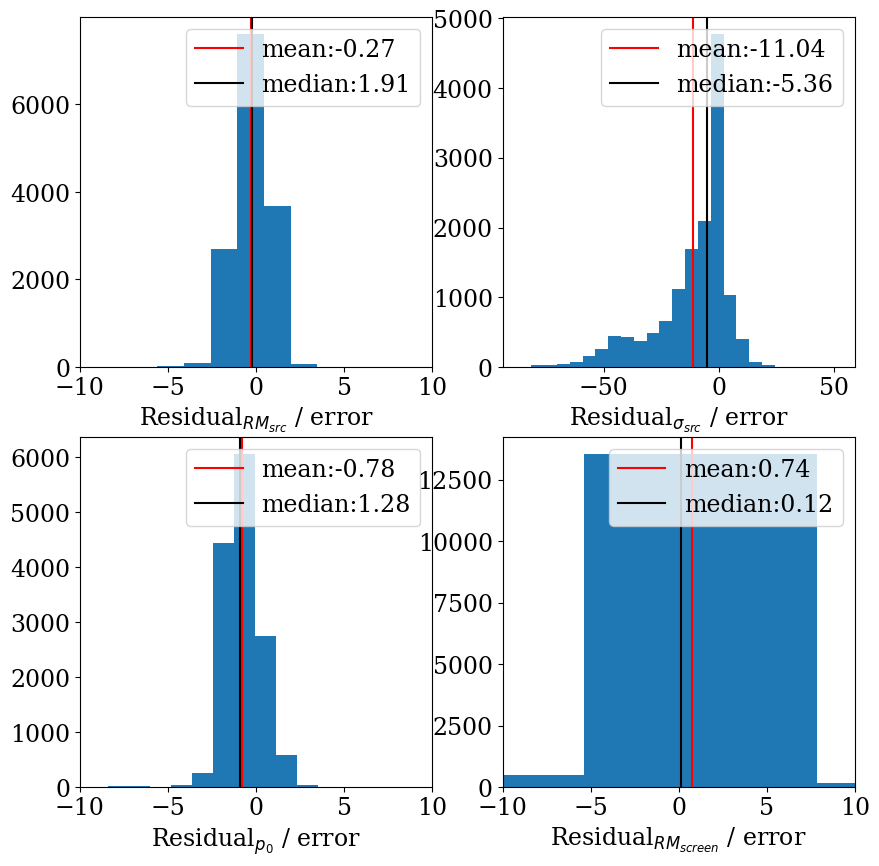

Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'deltaRM_radm2', 'sigmaRM_radm2', 'fracPol_plus_err',
       'psi0_deg_plus_err', 'RM_radm2_plus_err', 'deltaRM_radm2_plus_err',
       'sigmaRM_radm2_plus_err', 'fracPol_minus_err', 'psi0_deg_minus_err',
       'RM_radm2_minus_err', 'deltaRM_radm2_minus_err',
       'sigmaRM_radm2_minus_err', 'fracPol_bounds', 'psi0_deg_bounds',
       'RM_radm2_bounds', 'deltaRM_radm2_bounds', 'sigmaRM_radm2_bounds',
       'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC', 'ln(EVIDENCE) ',
       'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y', 'psi0_2_deg',
       'RM_screen_radm2', 'RM_screen_2_radm2', 'RM_src_radm2', 'sigma_RM_2',
       'sigmaRM_FG', 'frac_pol_2_comp', 'SNR', 'model', 'frac_pol_seed',
       'RM_screen_seed', 'RM_source_seed', 'sigmaRM_seed', 'sigma_FG_seed',
       'psi0_seed', 'p_err_residual', 'psi_err_residual', 'RM_err_residual',
       'RM_src_err_residual', 'sigma_RM_err_residual', 'p_err_residual_err',
       'psi

In [180]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))

delta_rm_resdiuals = (MS_MS_band1_merge_17000.RM_src_radm2 - MS_MS_band1_merge_17000.deltaRM_radm2) 
sigma_rm_resdiuals = (MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2) 
frac_pol_resdiuals = (MS_MS_band1_merge_17000.frac_pol - MS_MS_band1_merge_17000.fracPol) 
RM_screen_resdiuals = (MS_MS_band1_merge_17000.RM_screen_radm2 - MS_MS_band1_merge_17000.RM_radm2) 
psi_residuals = (MS_MS_band1_merge_17000.psi0_deg_y - MS_MS_band1_merge_17000.psi0_deg_x) 

ax1.hist(MS_MS_band1_merge_17000['RM_src_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3], bins=100)
ax1.axvline(x=np.mean(MS_MS_band1_merge_17000['RM_src_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'r', label='mean:{}'.format(np.round(np.mean(MS_MS_band1_merge_17000['RM_src_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), 2)))
ax1.axvline(x=np.median(MS_MS_band1_merge_17000['RM_src_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'k', label='median:{}'.format(np.round(np.std(MS_MS_band1_merge_17000['RM_src_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), 2)))
ax1.set_xlabel('Residual$_{{RM_{src}}}$ / error')
ax1.set_xlim(-10,10)
ax1.legend()

#AX2 - sigma_RM_FG
ax2.hist(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3], bins=25)
ax2.axvline(x=np.mean(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'r', label='mean:{}'.format(np.round(np.mean(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), 2)))
ax2.axvline(x=np.median(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'k', label='median:{}'.format(np.round(np.median(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), 2)))

ax2.set_xlabel('Residual$_{{\sigma_{src}}}$ / error')
ax2.legend()

#AX3 - frac pol
ax3.hist(MS_MS_band1_merge_17000['p_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3], bins=50)
ax3.axvline(x=np.mean(MS_MS_band1_merge_17000['p_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'r', label='mean:{}'.format(np.round(np.mean(MS_MS_band1_merge_17000['p_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), 2)))
ax3.axvline(x=np.median(MS_MS_band1_merge_17000['p_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'k', label='median:{}'.format(np.round(np.std(MS_MS_band1_merge_17000['p_err_residual_err'][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), 2)))

ax3.set_xlabel('Residual$_{p_{0}}$ / error')
ax3.set_xlim(-10,10)
ax3.legend()

#AX4 - RM screen
ax4.hist(RM_screen_resdiuals, bins=250)
ax4.axvline(x=np.mean(RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'r', label='mean:{}'.format(np.round(np.mean(RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), 2)))
ax4.axvline(x=np.median(RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'k', label='median:{}'.format(np.round(np.median(RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), 2)))

ax4.set_xlabel('Residual$_{RM_{screen}}$ / error')
ax4.set_xlim(-10,10)
ax4.legend()
plt.show()
print(MS_MS_band1_merge_17000.keys())

# Errorbars Band 1

In [181]:
ax1.hexbin("delta_rm_resdiuals)
ax1.set_xlabel('Residual$_{{RM_{src}}}$ / error')
ax1.set_xlim(-10,10)
ax1.legend()

#AX2 - sigma_RM_FG
ax2.hexbin(sigma_rm_resdiuals)
ax2.set_xlabel('Residual$_{{\sigma_{src}}}$ / error')
ax2.legend()

#AX3 - frac pol
ax3.hexbin(frac_pol_resdiuals)

ax3.set_xlabel('Residual$_{p_{0}}$ / error')
ax3.set_xlim(-10,10)
ax3.legend()

#AX4 - RM screen
ax4.hexbin(RM_screen_resdiuals)

ax4.set_xlabel('Residual$_{RM_{screen}}$ / error')
ax4.set_xlim(-10,10)
ax4.legend()
plt.show()

SyntaxError: unterminated string literal (detected at line 1) (2646859946.py, line 1)

In [ ]:
print(MS_MS_band1_merge_17000.keys())

In [ ]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))

ln_EVD_cut = 200
ax1.hist(delta_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut], bins=50)
ax1.axvline(x=np.mean(delta_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.mean(delta_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax1.axvline(x=np.median(delta_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(delta_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax1.set_xlabel('Residual$_{{RM_{src}}}$')
ax1.legend()

#AX2 - sigma_RM_FG
ax2.hist(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut], bins=50)
ax2.axvline(x=np.mean(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='std:{}'.format(np.round(np.std(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax2.axvline(x=np.median(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))

ax2.set_xlabel('Residual$_{{\sigma_{src}}}$')
ax2.legend()

#AX3 - frac pol
ax3.hist(frac_pol_resdiuals[abs(frac_pol_resdiuals)<0.3], bins=50)
ax3.axvline(x=np.mean(frac_pol_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='std:{}'.format(np.round(np.std(frac_pol_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax3.axvline(x=np.median(frac_pol_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(frac_pol_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax3.set_xlabel('Residual$_{p_{0}}$')
ax3.legend()

#AX4 - RM screen
ax4.hist(RM_screen_resdiuals[abs(RM_screen_resdiuals)<20], bins=50)
ax4.axvline(x=np.mean(RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'r', label='mean:{}'.format(np.round(np.std(RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax4.axvline(x=np.median(RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 3]), color = 'k', label='median:{}'.format(np.round(np.median(RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax4.set_xlabel('Residual$_{RM_{screen}}$')
ax4.legend()
plt.show()

plt.hist(psi_residuals[abs(psi_residuals)<100], bins=50)
plt.axvline(x=np.mean(psi_residuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.std(psi_residuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
plt.axvline(x=np.median(psi_residuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(psi_residuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
plt.xlabel('Residual$_{\psi_{0}}$')
plt.legend()

plt.show()

# Gone back to band 1 data and rerun it with a lower sigma limit

In [ ]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))
delta_rm_resdiuals_sigma= (MS_MS_band1_merge_sigma_limit_10000.RM_src_radm2 - MS_MS_band1_merge_sigma_limit_10000.deltaRM_radm2) 
sigma_rm_resdiuals_sigma = (MS_MS_band1_merge_sigma_limit_10000.sigma_RM_2 - MS_MS_band1_merge_sigma_limit_10000.sigmaRM_radm2) 
frac_pol_resdiuals_sigma = (MS_MS_band1_merge_sigma_limit_10000.frac_pol - MS_MS_band1_merge_sigma_limit_10000.fracPol) 
RM_screen_resdiuals_sigma = (MS_MS_band1_merge_sigma_limit_10000.RM_screen_radm2 - MS_MS_band1_merge_sigma_limit_10000.RM_radm2) 
psi_residuals_sigma = (MS_MS_band1_merge_sigma_limit_10000.psi0_deg_y - MS_MS_band1_merge_sigma_limit_10000.psi0_deg_x) 
ln_EVD_cut = 200
ax1.hist(delta_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut], bins=50)
ax1.axvline(x=np.mean(delta_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.mean(delta_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax1.axvline(x=np.median(delta_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(delta_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax1.set_xlabel('Residual$_{{RM_{src}}}$')
ax1.legend()

#AX2 - sigma_RM_FG
ax2.hist(sigma_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut], bins=50)
ax2.axvline(x=np.mean(sigma_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.mean(sigma_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax2.axvline(x=np.median(sigma_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(sigma_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))

ax2.set_xlabel('Residual$_{{\sigma_{src}}}$')
ax2.legend()

#AX3 - frac pol
ax3.hist(frac_pol_resdiuals_sigma[abs(frac_pol_resdiuals_sigma)<0.3], bins=50)
ax3.axvline(x=np.mean(frac_pol_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.mean(frac_pol_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax3.axvline(x=np.median(frac_pol_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(frac_pol_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax3.set_xlabel('Residual$_{p_{0}}$')
ax3.legend()

#AX4 - RM screen
ax4.hist(RM_screen_resdiuals_sigma[abs(RM_screen_resdiuals_sigma)<20], bins=50)
ax4.axvline(x=np.mean(RM_screen_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 3]), color = 'r', label='mean:{}'.format(np.round(np.mean(RM_screen_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax4.axvline(x=np.median(RM_screen_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 3]), color = 'k', label='median:{}'.format(np.round(np.median(RM_screen_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax4.set_xlabel('Residual$_{RM_{screen}}$')
ax4.legend()
plt.show()

plt.hist(psi_residuals_sigma[abs(psi_residuals_sigma)<100], bins=50)
plt.axvline(x=np.mean(psi_residuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.mean(psi_residuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
plt.axvline(x=np.median(psi_residuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(psi_residuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
plt.xlabel('Residual$_{\psi_{0}}$')
plt.legend()

plt.show()

## Does it vary with the QU outputs? Are there qU outputs that shouldn't be trusted

In [ ]:
plt.scatter(MS_MS_band1_merge_17000.sigmaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5], frac_pol_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5])
plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$p_{0} residuals$')
plt.show()

plt.scatter(MS_MS_band1_merge_17000.sigmaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5], RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5])
plt.yscale('symlog')
plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$RM_{screen} residuals$')

plt.show()

plt.scatter(MS_MS_band1_merge_17000.sigmaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5], psi_residuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5])
plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$\psi_{0} residuals$')
plt.show()

plt.scatter(MS_MS_band1_merge_17000.sigmaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5], sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5])
plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$\sigma_{RM}$ resdiuals')
plt.show()

plt.scatter(MS_MS_band1_merge_17000.sigmaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5], delta_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 5])

plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$\Delta RM residuals$')
plt.show()


# Have a look if the sigma limit is lower?

In [ ]:
plt.scatter(MS_MS_band1_merge_sigma_limit_10000.sigmaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5], frac_pol_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5])
plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$p_{0} residuals$')
plt.show()

plt.scatter(MS_MS_band1_merge_sigma_limit_10000.sigmaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5], RM_screen_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5])
plt.yscale('symlog')
plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$RM_{screen} residuals$')

plt.show()

plt.scatter(MS_MS_band1_merge_sigma_limit_10000.sigmaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5], psi_residuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5])
plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$\psi_{0} residuals$')
plt.show()

plt.scatter(MS_MS_band1_merge_sigma_limit_10000.sigmaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5], sigma_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5])
plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$\sigma_{RM}$ resdiuals')
plt.show()

plt.scatter(MS_MS_band1_merge_sigma_limit_10000.sigmaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5], delta_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > 5])

plt.xlabel('$\sigma_{RM, QU}$')
plt.ylabel('$\Delta RM residuals$')
plt.show()

# What about with delta RM

<>:4: SyntaxWarning: invalid escape sequence '\D'
<>:11: SyntaxWarning: invalid escape sequence '\D'
<>:15: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\p'
<>:20: SyntaxWarning: invalid escape sequence '\D'
<>:21: SyntaxWarning: invalid escape sequence '\s'
<>:26: SyntaxWarning: invalid escape sequence '\D'
<>:27: SyntaxWarning: invalid escape sequence '\D'
<>:4: SyntaxWarning: invalid escape sequence '\D'
<>:11: SyntaxWarning: invalid escape sequence '\D'
<>:15: SyntaxWarning: invalid escape sequence '\D'
<>:16: SyntaxWarning: invalid escape sequence '\p'
<>:20: SyntaxWarning: invalid escape sequence '\D'
<>:21: SyntaxWarning: invalid escape sequence '\s'
<>:26: SyntaxWarning: invalid escape sequence '\D'
<>:27: SyntaxWarning: invalid escape sequence '\D'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/1976030470.py:4: SyntaxWarning: invalid escape sequence '\D'
  plt.xlabel('$\Delta_{RM}$')
/var/folders/89/zgv9nv5563n89p

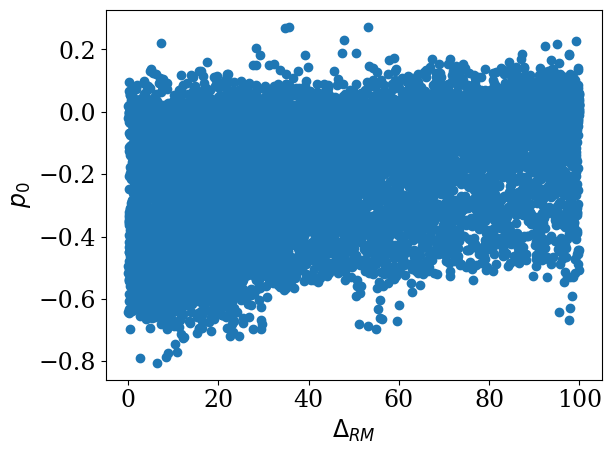

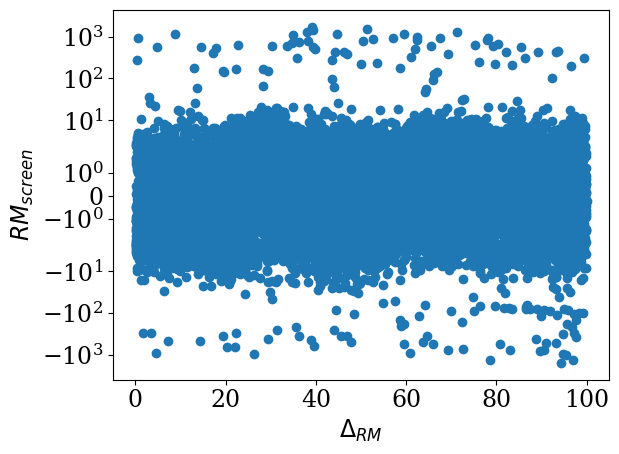

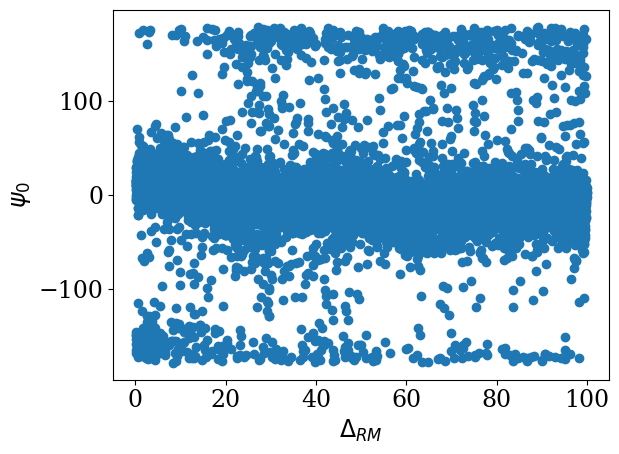

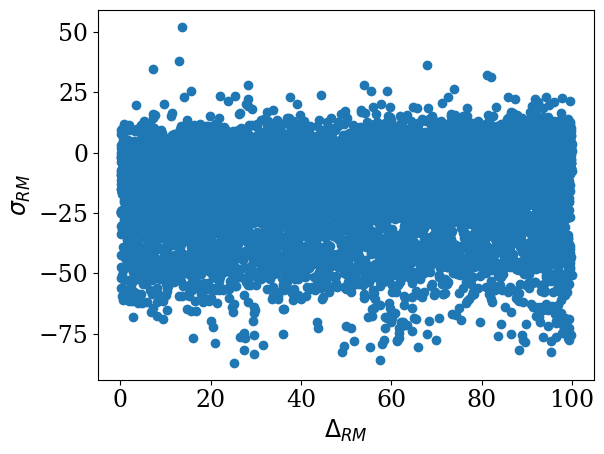

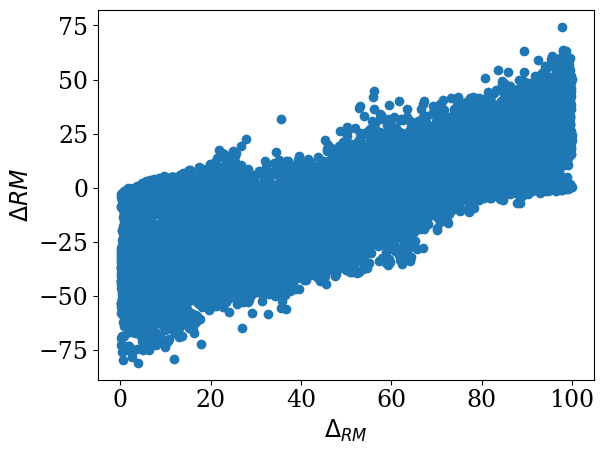

In [182]:

EVD_cut = 5

plt.scatter(MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], frac_pol_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut])
plt.xlabel('$\Delta_{RM}$')
plt.ylabel('$p_{0}$')
plt.show()

plt.scatter(MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], RM_screen_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut])
plt.yscale('symlog')
plt.ylabel('$RM_{screen}$')
plt.xlabel('$\Delta_{RM}$')
plt.show()

plt.scatter(MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], psi_residuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut])
plt.xlabel('$\Delta_{RM}$')
plt.ylabel('$\psi_{0}$')
plt.show()

plt.scatter(MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut])
plt.xlabel('$\Delta_{RM}$')
plt.ylabel('$\sigma_{RM}$')
plt.show()

plt.scatter(MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], delta_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut])

plt.xlabel('$\Delta_{RM}$')
plt.ylabel('$\Delta RM$')
plt.show()


<>:4: SyntaxWarning: invalid escape sequence '\D'
<>:11: SyntaxWarning: invalid escape sequence '\D'
<>:15: SyntaxWarning: invalid escape sequence '\D'
<>:19: SyntaxWarning: invalid escape sequence '\D'
<>:20: SyntaxWarning: invalid escape sequence '\s'
<>:25: SyntaxWarning: invalid escape sequence '\D'
<>:26: SyntaxWarning: invalid escape sequence '\D'
<>:4: SyntaxWarning: invalid escape sequence '\D'
<>:11: SyntaxWarning: invalid escape sequence '\D'
<>:15: SyntaxWarning: invalid escape sequence '\D'
<>:19: SyntaxWarning: invalid escape sequence '\D'
<>:20: SyntaxWarning: invalid escape sequence '\s'
<>:25: SyntaxWarning: invalid escape sequence '\D'
<>:26: SyntaxWarning: invalid escape sequence '\D'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/2996799834.py:4: SyntaxWarning: invalid escape sequence '\D'
  plt.xlabel('$\Delta_{RM, QU}$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/2996799834.py:11: SyntaxWarning: invalid escape sequence '\D'
 

ValueError: x and y must be the same size

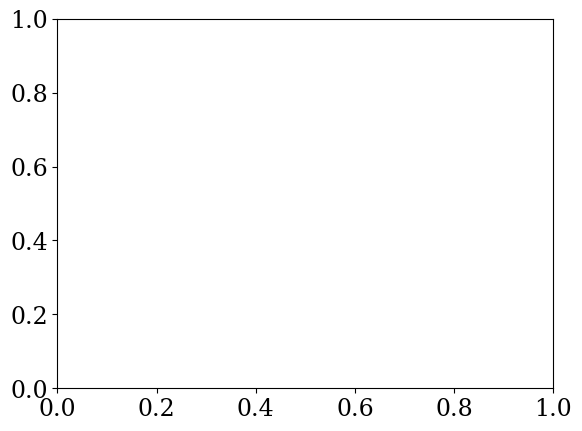

In [183]:
EVD_cut = 5

plt.scatter(MS_MS_band1_merge_10000.deltaRM_radm2[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut], frac_pol_resdiuals[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut])
plt.xlabel('$\Delta_{RM, QU}$')
plt.ylabel('$p_{0}$')
plt.show()

plt.scatter(MS_MS_band1_merge_10000.deltaRM_radm2[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut], RM_screen_resdiuals[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut])
plt.yscale('symlog')
plt.ylabel('$RM_{0}$')
plt.xlabel('$\Delta_{RM, QU}$')
plt.show()

plt.scatter(MS_MS_band1_merge_10000.deltaRM_radm2[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut], psi_residuals[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut])
plt.xlabel('$\Delta_{RM, QU}$')
plt.show()

plt.scatter(MS_MS_band1_merge_10000.deltaRM_radm2[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut], sigma_rm_resdiuals[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut])
plt.xlabel('$\Delta_{RM, QU}$')
plt.ylabel('$\sigma_{RM, QU}$')
plt.show()

plt.scatter(MS_MS_band1_merge_10000.deltaRM_radm2[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut], delta_rm_resdiuals[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > EVD_cut])

plt.xlabel('$\Delta_{RM, QU}$')
plt.ylabel('$\Delta RM QU$')
plt.show()


# What is the effect of the new sigma limit?

In [ ]:
EVD_cut = 5

plt.scatter(MS_MS_band1_merge_sigma_limit_10000.deltaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut], frac_pol_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut])
plt.xlabel('$\Delta_{RM, QU}$')
plt.ylabel('$p_{0}$')
plt.show()

plt.scatter(MS_MS_band1_merge_sigma_limit_10000.deltaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut], RM_screen_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut])
plt.yscale('symlog')
plt.ylabel('$RM_{0}$')
plt.xlabel('$\Delta_{RM, QU}$')
plt.show()

plt.scatter(MS_MS_band1_merge_sigma_limit_10000.deltaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut], psi_residuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut])
plt.xlabel('$\Delta_{RM, QU}$')
plt.show()

plt.scatter(MS_MS_band1_merge_sigma_limit_10000.deltaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut], sigma_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut])
plt.xlabel('$\Delta_{RM, QU}$')
plt.ylabel('$\sigma_{RM, QU}$')
plt.show()

plt.scatter(MS_MS_band1_merge_sigma_limit_10000.deltaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut], delta_rm_resdiuals_sigma[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut])

plt.xlabel('$\Delta_{RM, QU}$')
plt.ylabel('$\Delta RM QU$')
plt.show()


# IS there a relationship between Delta RM of the true model and the output of QU fitting 

In [ ]:
plt.hexbin(MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], MS_MS_band1_merge_17000.deltaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], gridsize = 35, cmap='cmr.flamingo', reduce_C_function = np.sum)
plt.xlabel('$\Delta_{RM}$')
plt.colorbar(label='Count')
plt.ylabel('$\Delta_{RM,QU}$')
plt.show()


plt.hexbin(MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], MS_MS_band1_merge_17000.deltaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], MS_MS_band1_merge_17000.sigma_RM_2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], gridsize = 35, cmap='cmr.ocean', vmax = 50, reduce_C_function = np.median)
plt.xlabel('$\Delta_{RM}$')
plt.colorbar(label='$\sigma_{RM,True}$')
plt.ylabel('$\Delta_{RM,QU}$')
plt.show()


plt.hexbin(MS_MS_band1_merge_sigma_limit_10000.RM_src_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut], MS_MS_band1_merge_sigma_limit_10000.deltaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut], MS_MS_band1_merge_sigma_limit_10000.sigmaRM_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > EVD_cut], gridsize = 35, cmap='cmr.ocean', reduce_C_function = np.median)
plt.xlabel('$\Delta_{RM}$')
plt.colorbar(label='$\sigma_{RM, QU}$')
plt.ylabel('$\Delta_{RM,QU}$')
plt.show()

plt.hexbin(MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], MS_MS_band1_merge_17000.SNR[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], MS_MS_band1_merge_17000.deltaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], gridsize = 25, cmap='cmr.ember', reduce_C_function = np.median)
plt.xlabel('$\Delta_{RM}$')
plt.colorbar(label='$\Delta_{RM,QU}$')
plt.ylabel('SNR')
plt.show()

plt.hexbin(MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], MS_MS_band1_merge_17000.deltaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], MS_MS_band1_merge_17000.SNR[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > EVD_cut], gridsize = 35, cmap='cmr.ember', reduce_C_function = np.median)
plt.xlabel('$\Delta_{RM}$')
plt.colorbar(label='SNR')
plt.ylabel('$\Delta_{RM,QU}$')
plt.show()


# Find out which sources it is?

In [ ]:
srcs = MS_MS_band1_merge_10000.src[MS_MS_band1_merge_10000['sigmaRM_radm2'] > 50]
print(len(srcs))
print(MS_MS_band1_merge_10000.src[0])
for s in srcs:
    print('rm mixedslab_unif_fg_10000_b1/{}_m7_dynesty.json'.format(s))
    print('rm mixedslab_unif_fg_10000_b1/{}_m7_dynesty.dat'.format(s))
    print('rm -rf mixedslab_unif_fg_10000_b1/{}_m7_dynesty'.format(s))

In [ ]:
print(MS_MS_band1_merge.keys())

## PLOT PAPERS

In [ ]:
lnEVD_cut = 20
print(len(MS_MS_band1_merge_17000.sigma_RM_2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut],))
delta_rm_resdiuals = (MS_MS_band1_merge_17000.RM_src_radm2 - MS_MS_band1_merge_17000.deltaRM_radm2) 
hf = plt.hexbin(MS_MS_band1_merge_17000.sigma_RM_2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut],abs(fracpol_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut]), gridsize=20,reduce_C_function=np.median, cmap='cmr.guppy' )
plt.colorbar(hf, label='Residual$_{{RM_{src}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.tight_layout()
#plt.savefig('RM_src_accuracy_MS.pdf', format='pdf')
plt.show()


sigma_rm_resdiuals = (MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2) 
hg = plt.hexbin(MS_MS_band1_merge_17000.sigma_RM_2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut],sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut], gridsize=20,reduce_C_function=np.median, vmin=-30, vmax=30, cmap='cmr.guppy' )
plt.colorbar(hg, label='Residual$_{{\sigma_{RM}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.tight_layout()
plt.savefig('sigma_RM_accuracy_MS.pdf', format='pdf')
plt.show()

fracpol_resdiuals = (MS_MS_band1_merge_17000.frac_pol - MS_MS_band1_merge_17000.fracPol)
hx = plt.hexbin(MS_MS_band1_merge_17000.frac_pol[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_band1_merge_17000.psi0_deg_y[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut],fracpol_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut], gridsize=20,reduce_C_function=np.median, vmin=-0.3, vmax=0.3, cmap='cmr.guppy' )
plt.colorbar(hx, label='Residual$_{{p_{0}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.tight_layout()
plt.savefig('frac_pol_accuracy_MS.pdf', format='pdf')
plt.show()

psi_resdiuals = (MS_MS_band1_merge_17000.psi0_deg_y - MS_MS_band1_merge_17000.psi0_deg_x)
hp = plt.hexbin(MS_MS_band1_merge_17000.sigma_RM_2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut],psi_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut], gridsize=20,reduce_C_function=np.median, vmin=-10, vmax=10, cmap='cmr.guppy' )
plt.colorbar(hp , label='Residual$_{{\psi_{0}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.tight_layout()
plt.savefig('psi_accuracy_MS.pdf', format='pdf')
plt.show()


sigma_rm_resdiuals = (MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2) 
plt.hexbin(MS_MS_band1_merge_17000.sigma_RM_2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_band1_merge_17000.RM_src_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut], gridsize=25,reduce_C_function=np.sum, cmap='cmr.flamingo' )
plt.colorbar(label='Residual$_{{RM_{src}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.show()

# For the real science we need it in terms of real values that can be plotted

In [184]:
def get_contours_nonlnbf(x, y, z, ax, vn=0, vx=30):
    import matplotlib as mpl
    from scipy.stats import gaussian_kde
    
    # Create hexbin plot with log scale on the x-axis
    #cmap = (mpl.colors.ListedColormap(['darkblue', 'royalblue', 'deepskyblue', 'yellow', 'gold', 'orange']).with_extremes(over='red', under='blue'))
    #bounds = [-50.0, -1.0, -0.5, 0.0, 0.5, 1.0, 50.0]
    #norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    
    hb=plt.hexbin(x, y, abs(z), gridsize = 25, reduce_C_function=np.median, vmin=vn, vmax=vx, cmap='cmr.bubblegum')
    
    if ax==1:
        plt.colorbar(hb,label='|Residual $RM_{screen}$|')
        plt.xlabel('SNR')
        plt.ylabel('ln(EVD)')
    if ax == 2:
        plt.colorbar(hb,label='Residual $p_{0}$')
        name = 'error_MS_frac_pol_b1.pdf'
        plt.ylabel('$p_{0}$, QU')
        plt.xlabel('ln(EVD)')
    if ax == 3:
        plt.colorbar(hb,label='|Residual $\psi_{0}$|')
        name = 'error_MS_psi_b1.pdf'
        plt.xlabel('ln(EVD)')
        
    if ax == 4:
        plt.ylabel('$RM_{src}$, QU')
        plt.xlabel('$\sigma_{RM}, QU$')
        plt.colorbar(hb,label='|Residual $RM_{src}$|')
        name = 'error_MS_RM_src_b1.pdf'
        plt.axvline(x=20, linestyle='--', linewidth=2, color='gold', label='POSSUM Combined Band')
        plt.axvline(x=30, linestyle='dotted', linewidth=2, color='gold', label='900 – 1700 MHz')
        plt.legend(fontsize=11)
        
    if ax == 5:
        plt.ylabel('$RM_{src}$, QU')
        name = 'error_MS_sigma_RM_b1.pdf'
        plt.xlabel('$\sigma_{RM}, QU$')
        plt.colorbar(hb,label='|Residual $\sigma_{RM}$|')

    
    
    # Add colorbar to hexbin plot
    
    # Kernel Density Estimation (KDE) for contour overlay
    
    plt.tight_layout()
    #plt.savefig(name, format='pdf')
    plt.show()

<>:22: SyntaxWarning: invalid escape sequence '\p'
<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:38: SyntaxWarning: invalid escape sequence '\s'
<>:39: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\p'
<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:38: SyntaxWarning: invalid escape sequence '\s'
<>:39: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/1918221931.py:22: SyntaxWarning: invalid escape sequence '\p'
  plt.colorbar(hb,label='|Residual $\psi_{0}$|')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/1918221931.py:28: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}, QU$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/1918221931.py:38: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}, QU$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/1918221931.py:39: SyntaxWarni

Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'deltaRM_radm2', 'sigmaRM_radm2', 'fracPol_plus_err',
       'psi0_deg_plus_err', 'RM_radm2_plus_err', 'deltaRM_radm2_plus_err',
       'sigmaRM_radm2_plus_err', 'fracPol_minus_err', 'psi0_deg_minus_err',
       'RM_radm2_minus_err', 'deltaRM_radm2_minus_err',
       'sigmaRM_radm2_minus_err', 'fracPol_bounds', 'psi0_deg_bounds',
       'RM_radm2_bounds', 'deltaRM_radm2_bounds', 'sigmaRM_radm2_bounds',
       'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC', 'ln(EVIDENCE) ',
       'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y', 'psi0_2_deg',
       'RM_screen_radm2', 'RM_screen_2_radm2', 'RM_src_radm2', 'sigma_RM_2',
       'sigmaRM_FG', 'frac_pol_2_comp', 'SNR', 'model', 'frac_pol_seed',
       'RM_screen_seed', 'RM_source_seed', 'sigmaRM_seed', 'sigma_FG_seed',
       'psi0_seed', 'p_err_residual', 'psi_err_residual', 'RM_err_residual',
       'RM_src_err_residual', 'sigma_RM_err_residual', 'p_err_residual_err',
       'psi

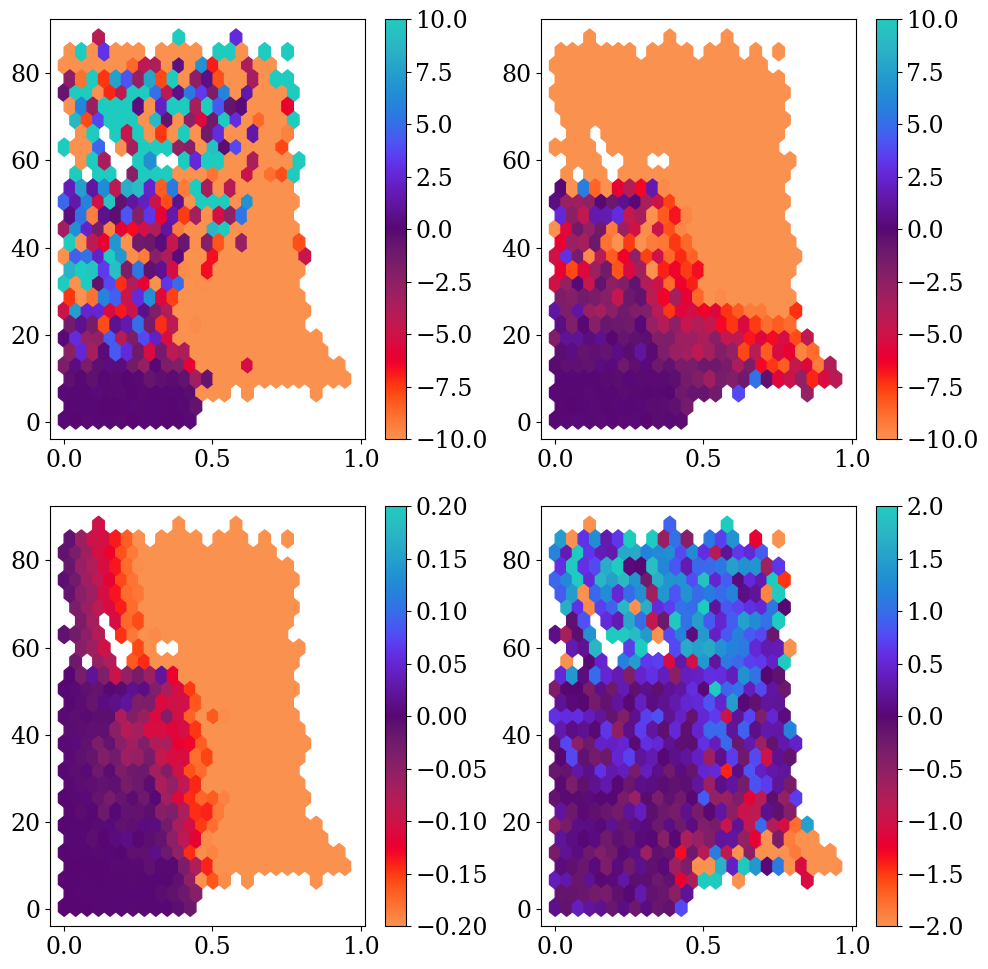

In [185]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))

lnEVD_cut = 20
SNR_cut = 10

delta_rm_resdiuals = (MS_MS_band1_merge_17000.RM_src_radm2 - MS_MS_band1_merge_17000.deltaRM_radm2) 
deltaax = ax1.hexbin(MS_MS_band1_merge_17000.fracPol[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) &  (MS_MS_band1_merge_17000.SNR >SNR_cut)], delta_rm_resdiuals[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=10, vmin=-10)
deltacbar = plt.colorbar(deltaax)

sigma_rm_resdiuals = (MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2) 
sigmaax = ax2.hexbin(MS_MS_band1_merge_17000.fracPol[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], sigma_rm_resdiuals[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], cmap='cmr.guppy',reduce_C_function=np.median, vmax=10, vmin=-10, gridsize=25)
sigmabar = plt.colorbar(sigmaax)

fracpol_resdiuals = (MS_MS_band1_merge_17000.frac_pol - MS_MS_band1_merge_17000.fracPol)
fracpolax = ax3.hexbin(MS_MS_band1_merge_17000.fracPol[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], fracpol_resdiuals[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=0.2, vmin=-0.2)
fracpbar = plt.colorbar(fracpolax)


psi_resdiuals = (MS_MS_band1_merge_17000.RM_screen_radm2 - MS_MS_band1_merge_17000.RM_radm2)
psiax = ax4.hexbin(MS_MS_band1_merge_17000.fracPol[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], psi_resdiuals[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=2, vmin=-2)
psibar = plt.colorbar(psiax)
print(MS_MS_band1_merge_17000.keys())
plt.tight_layout()
plt.show()


Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'deltaRM_radm2', 'sigmaRM_radm2', 'fracPol_plus_err',
       'psi0_deg_plus_err', 'RM_radm2_plus_err', 'deltaRM_radm2_plus_err',
       'sigmaRM_radm2_plus_err', 'fracPol_minus_err', 'psi0_deg_minus_err',
       'RM_radm2_minus_err', 'deltaRM_radm2_minus_err',
       'sigmaRM_radm2_minus_err', 'fracPol_bounds', 'psi0_deg_bounds',
       'RM_radm2_bounds', 'deltaRM_radm2_bounds', 'sigmaRM_radm2_bounds',
       'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC', 'ln(EVIDENCE) ',
       'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y', 'psi0_2_deg',
       'RM_screen_radm2', 'RM_screen_2_radm2', 'RM_src_radm2', 'sigma_RM_2',
       'sigmaRM_FG', 'frac_pol_2_comp', 'SNR', 'model', 'frac_pol_seed',
       'RM_screen_seed', 'RM_source_seed', 'sigmaRM_seed', 'sigma_FG_seed',
       'psi0_seed', 'p_err_residual', 'psi_err_residual', 'RM_err_residual',
       'RM_src_err_residual', 'sigma_RM_err_residual', 'p_err_residual_err',
       'psi

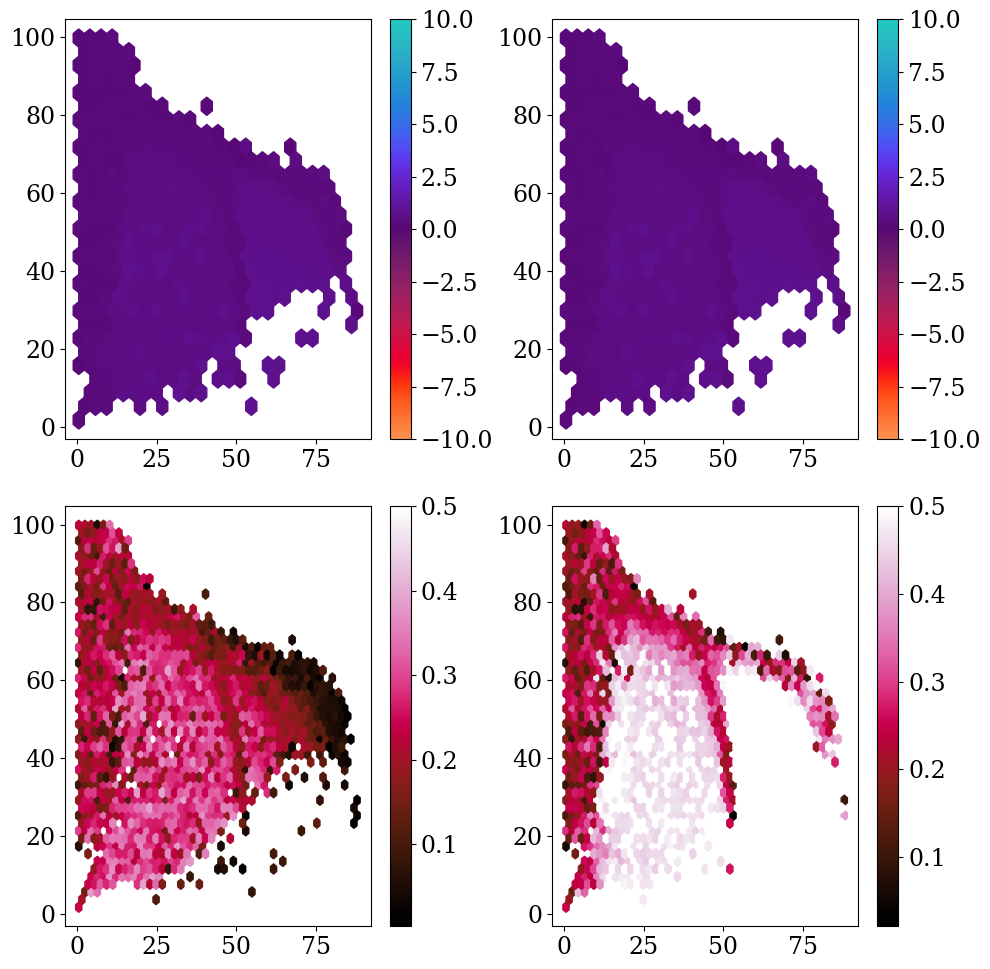

In [186]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))

lnEVD_cut = 20
SNR_cut = 10

delta_rm_resdiuals = (MS_MS_band1_merge_10000.RM_src_radm2 - MS_MS_band1_merge_10000.deltaRM_radm2) 
deltaax = ax1.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) &  (MS_MS_band1_merge_17000.SNR >SNR_cut)],  MS_MS_band1_merge_17000.fracPol[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=10, vmin=-10)
deltacbar = plt.colorbar(deltaax)

sigma_rm_resdiuals = (MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2) 
sigmaax = ax2.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],  MS_MS_band1_merge_17000.fracPol[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], cmap='cmr.guppy',reduce_C_function=np.median, vmax=10, vmin=-10, gridsize=25)
sigmabar = plt.colorbar(sigmaax)

fracpol_resdiuals = (MS_MS_band1_merge_17000.frac_pol - MS_MS_band1_merge_17000.fracPol)
fracpolax = ax3.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],  MS_MS_band1_merge_17000.frac_pol[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],cmap='cmr.flamingo', reduce_C_function=np.median, gridsize=45, vmax=0.5)
fracpbar = plt.colorbar(fracpolax)


psi_resdiuals = (MS_MS_band1_merge_17000.RM_screen_radm2 - MS_MS_band1_merge_17000.RM_radm2)
psiax = ax4.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],  MS_MS_band1_merge_17000.fracPol[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],cmap='cmr.flamingo', reduce_C_function=np.median, gridsize=45, vmax=0.5)
psibar = plt.colorbar(psiax)
print(MS_MS_band1_merge_17000.keys())
plt.tight_layout()
plt.show()


<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:24: SyntaxWarning: invalid escape sequence '\s'
<>:28: SyntaxWarning: invalid escape sequence '\p'
<>:29: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:24: SyntaxWarning: invalid escape sequence '\s'
<>:28: SyntaxWarning: invalid escape sequence '\p'
<>:29: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/175599228.py:17: SyntaxWarning: invalid escape sequence '\s'
  sigmabar = plt.colorbar(sigmaax, label='R$_{\sigma_{RM, src}}$ [rad m$^{-2}$]')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/175599228.py:24: SyntaxWarning: invalid escape sequence '\s'
  ax3.set_xlabel('$\sigma_{RM,src, QU}$ [rad $m^{-2}$]')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_43381/175599228.py:28: SyntaxWarning: invalid escape sequence '\p'
  psibar = plt.colorbar(psiax, label='R$_{\psi_{0}}$ [$\degree$]')
/var/fol

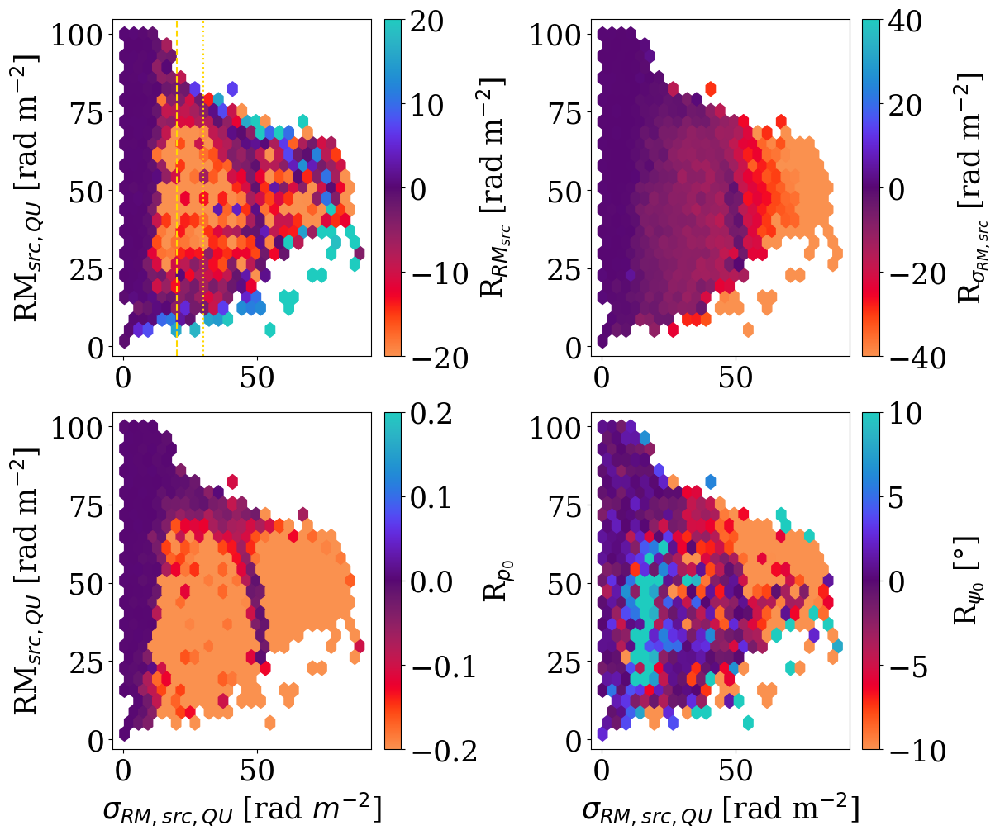

In [187]:
plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 25})

fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(12, 10), constrained_layout=True)

lnEVD_cut = 20
SNR_cut = 10

deltaax = ax1.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) &  (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000['RM_src_err_residual'] [(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=20, vmin=-20)
ax1.axvline(x=20, linestyle='--', color = 'gold', label='POSSUM Full Band')
ax1.axvline(x=30, linestyle='dotted', color = 'gold', label='900 - 1700 MHz Est.')
ax1.set_ylabel('RM$_{src, QU}$ [rad m$^{-2}$]')
deltacbar = plt.colorbar(deltaax, label='R$_{RM_{src}}$ [rad m$^{-2}$]')

sigma_rm_resdiuals = MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2
sigmaax = ax2.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], sigma_rm_resdiuals[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], cmap='cmr.guppy',reduce_C_function=np.median, vmax=40, vmin=-40, gridsize=25)
sigmabar = plt.colorbar(sigmaax, label='R$_{\sigma_{RM, src}}$ [rad m$^{-2}$]')


fracpol_resdiuals = (MS_MS_band1_merge_17000.frac_pol - MS_MS_band1_merge_17000.fracPol)
fracpolax = ax3.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000['p_err_residual'][(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=0.2, vmin=-0.2)
fracpbar = plt.colorbar(fracpolax, label='R$_{p_{0}}$')
ax3.set_ylabel('RM$_{src, QU}$ [rad m$^{-2}$]')
ax3.set_xlabel('$\sigma_{RM,src, QU}$ [rad $m^{-2}$]')

psi_resdiuals = (MS_MS_band1_merge_17000.RM_screen_radm2 - MS_MS_band1_merge_17000.RM_radm2)
psiax = ax4.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000['psi_err_residual'][(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=10, vmin=-10)
psibar = plt.colorbar(psiax, label='R$_{\psi_{0}}$ [$\degree$]')
ax4.set_xlabel('$\sigma_{RM,src, QU}$ [rad m$^{-2}$]')
plt.savefig('four_parameters_error_T-slab_B1.pdf', format='pdf')







MS_MS_band1_merge_17000['p_err_residual'] = MS_MS_band1_merge_17000['frac_pol'] - MS_MS_band1_merge_17000['fracPol']
MS_MS_band1_merge_17000['psi_err_residual'] = MS_MS_band1_merge_17000['psi0_deg_y'] - MS_MS_band1_merge_17000['psi0_deg_x']
MS_MS_band1_merge_17000['RM_err_residual'] = MS_MS_band1_merge_17000['RM_screen_radm2'] - MS_MS_band1_merge_17000['RM_radm2']
MS_MS_band1_merge_17000['RM_src_err_residual'] = MS_MS_band1_merge_17000['RM_src_radm2'] - MS_MS_band1_merge_17000['deltaRM_radm2']
MS_MS_band1_merge_17000['sigma_RM_err_residual'] = MS_MS_band1_merge_17000['sigmaRM_radm2'] - MS_MS_band1_merge_17000['sigmaRM_FG']


MS_MS_band1_merge_17000['p_err_residual_err'] = np.where(MS_MS_band1_merge_17000['p_err_residual'] > 0, MS_MS_band1_merge_17000['p_err_residual']/MS_MS_band1_merge_17000['fracPol_plus_err'], MS_MS_band1_merge_17000['p_err_residual']/MS_MS_band1_merge_17000['fracPol_minus_err'])
MS_MS_band1_merge_17000['psi_err_residual_err'] = np.where(MS_MS_band1_merge_17000['psi_err_residual'] > 0, MS_MS_band1_merge_17000['psi_err_residual']/MS_MS_band1_merge_17000['psi0_deg_plus_err'], MS_MS_band1_merge_17000['psi_err_residual']/MS_MS_band1_merge_17000['psi0_deg_minus_err'])
MS_MS_band1_merge_17000['RM_err_residual_err'] = np.where(MS_MS_band1_merge_17000['RM_err_residual'] > 0, MS_MS_band1_merge_17000['RM_err_residual']/MS_MS_band1_merge_17000['RM_radm2_plus_err'], MS_MS_band1_merge_17000['RM_err_residual']/MS_MS_band1_merge_17000['RM_radm2_minus_err'])
MS_MS_band1_merge_17000['RM_src_err_residual_err'] = np.where(MS_MS_band1_merge_17000['RM_src_err_residual'] > 0, MS_MS_band1_merge_17000['RM_src_err_residual']/MS_MS_band1_merge_17000['deltaRM_radm2_plus_err'], MS_MS_band1_merge_17000['RM_src_err_residual']/MS_MS_band1_merge_17000['deltaRM_radm2_minus_err'])
MS_MS_band1_merge_17000['sigma_RM_err_residual_err'] = np.where(MS_MS_band1_merge_17000['sigma_RM_err_residual'] > 0, MS_MS_band1_merge_17000['sigma_RM_err_residual']/MS_MS_band1_merge_17000['sigmaRM_radm2_plus_err'], MS_MS_band1_merge_17000['sigma_RM_err_residual']/MS_MS_band1_merge_17000['sigmaRM_radm2_minus_err'])




14439


KeyError: 'sigma_RM_err_residual_err'

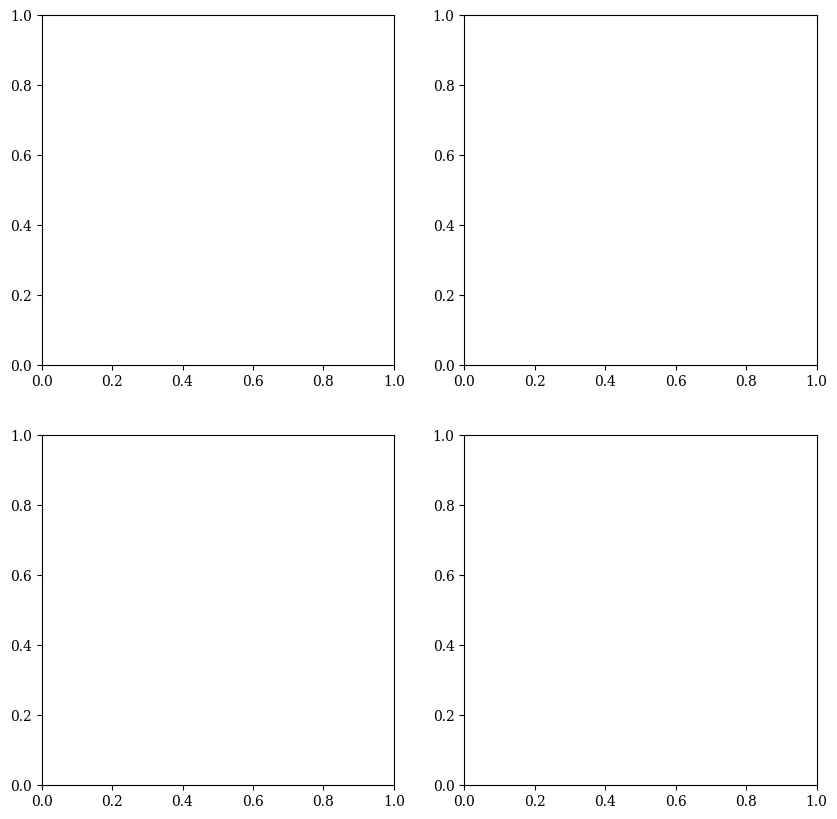

In [4]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))
print(len(MS_MS_band1_merge_17000.sigmaRM_radm2))
print(len(MS_MS_band1_merge_17000['sigma_RM_err_residual_err']))

lnEVD_cut = 20
SNR_cut = 10

deltaax = ax1.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) &  (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000['RM_src_err_residual_err'][(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=5, vmin=-5)
deltacbar = plt.colorbar(deltaax)


sigmaax = ax2.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000['sigma_RM_err_residual_err'][(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], cmap='cmr.guppy',reduce_C_function=np.median, vmax=5, vmin=-5, gridsize=25)
sigmabar = plt.colorbar(sigmaax)

fracpolax = ax3.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000['p_err_residual_err'][(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=2, vmin=-2)
fracpbar = plt.colorbar(fracpolax)


psi_resdiuals = (MS_MS_band1_merge_17000.RM_screen_radm2 - MS_MS_band1_merge_17000.RM_radm2)
psiax = ax4.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],MS_MS_band1_merge_17000['psi_err_residual_err'][(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)],cmap='cmr.guppy', reduce_C_function=np.median, gridsize=25, vmax=5, vmin=-5)
psibar = plt.colorbar(psiax)
print(MS_MS_band1_merge_17000.keys())
plt.tight_layout()
plt.show()


# Need to plot the trajectories

<>:45: SyntaxWarning: invalid escape sequence '\s'
<>:45: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1609222722.py:45: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}$ [rad $m^{-2}$]')


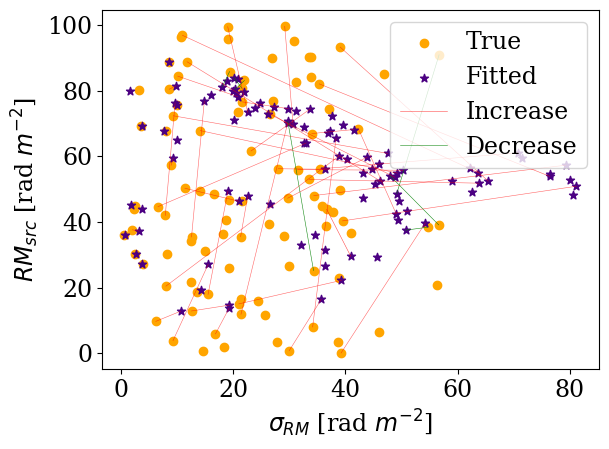

In [5]:

plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 17})
N = 50
indices = np.random.randint(0,7000,size=N)

plt.scatter(y=MS_MS_band1_merge_17000.RM_src_radm2[indices], x=MS_MS_band1_merge_17000.sigma_RM_2[indices], c='orange', label='True')
plt.scatter(y=MS_MS_band1_merge_17000.deltaRM_radm2[indices], x=MS_MS_band1_merge_17000.sigmaRM_radm2[indices], c='indigo', marker="*", label='Fitted')

xs = MS_MS_band1_merge_17000.RM_src_radm2[indices]
ys = MS_MS_band1_merge_17000.sigma_RM_2[indices]

x1s = MS_MS_band1_merge_17000.deltaRM_radm2[indices]
y1s = MS_MS_band1_merge_17000.sigmaRM_radm2[indices]

xs = np.asarray(xs)
ys = np.asarray(ys)

x1s = np.asarray(x1s)
y1s = np.asarray(y1s)
j=0
k=0

for i in range(0,N):

    if ys[i] < y1s[i]:
        #If the fitted parameter is too large
        if j == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', label='Increase', linewidth=0.4, alpha=0.7)
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', linewidth=0.4, alpha=0.6)

        j += 1
    else:
        #If the fitted parameter is too small
        if k == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g',linewidth=0.4, alpha=0.9, label='Decrease')
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g', linewidth=0.4, alpha=0.9)

        k += 1

            
        
plt.ylabel('$RM_{src}$ [rad $m^{-2}$]')
plt.xlabel('$\sigma_{RM}$ [rad $m^{-2}$]')
plt.legend()
plt.tight_layout()
#plt.savefig('MS_movement.pdf', format='pdf')
plt.show()       
        

# CHECKING 


In [6]:
MS_MS_test_band1_df = pd.read_csv('/Users/loberhel/Desktop/POSSUM_testing_MS_condensed_sim7_model_num_1000_sims.csv')

MS_test_true = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/band1_mixedslab_unif_fg_number_10000_freq_800_1089_SNR_band1_testing_to_make_sureno_extra_term.csv')
MS_test_true.rename(columns={'Unnamed: 0':'src'}, inplace=True)


MS_MS_test_band1_df['src'] = MS_MS_test_band1_df['src'] - 1               
    

MS_MS_band1_merge_test = pd.merge(MS_MS_test_band1_df, MS_test_true, on='src', how='inner')



<>:45: SyntaxWarning: invalid escape sequence '\s'
<>:45: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/369941571.py:45: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}$ [rad $m^{-2}$]')


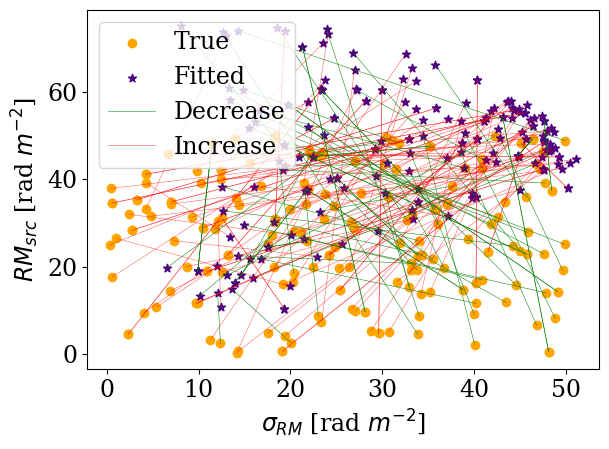

In [7]:
plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 17})
N = 200
indices = np.random.randint(0,300,size=N)

plt.scatter(y=MS_MS_band1_merge_test.RM_src_radm2[indices], x=MS_MS_band1_merge_test.sigma_RM_2[indices], c='orange', label='True')
plt.scatter(y=MS_MS_band1_merge_test.deltaRM_radm2[indices], x=MS_MS_band1_merge_test.sigmaRM_radm2[indices], c='indigo', marker="*", label='Fitted')

xs = MS_MS_band1_merge_test.RM_src_radm2[indices]
ys = MS_MS_band1_merge_test.sigma_RM_2[indices]

x1s = MS_MS_band1_merge_test.deltaRM_radm2[indices]
y1s = MS_MS_band1_merge_test.sigmaRM_radm2[indices]

xs = np.asarray(xs)
ys = np.asarray(ys)

x1s = np.asarray(x1s)
y1s = np.asarray(y1s)
j=0
k=0

for i in range(0,N):

    if ys[i] < y1s[i]:
        #If the fitted parameter is too large
        if j == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', label='Increase', linewidth=0.4, alpha=0.7)
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', linewidth=0.4, alpha=0.6)

        j += 1
    else:
        #If the fitted parameter is too small
        if k == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g',linewidth=0.4, alpha=0.9, label='Decrease')
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g', linewidth=0.4, alpha=0.9)

        k += 1

            
        
plt.ylabel('$RM_{src}$ [rad $m^{-2}$]')
plt.xlabel('$\sigma_{RM}$ [rad $m^{-2}$]')
plt.legend()
plt.tight_layout()
plt.savefig('MS_movement.pdf', format='pdf')
plt.show()     

# Combined Band

<>:45: SyntaxWarning: invalid escape sequence '\s'
<>:45: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2416689455.py:45: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM, src}$ [rad m$^{-2}$]')


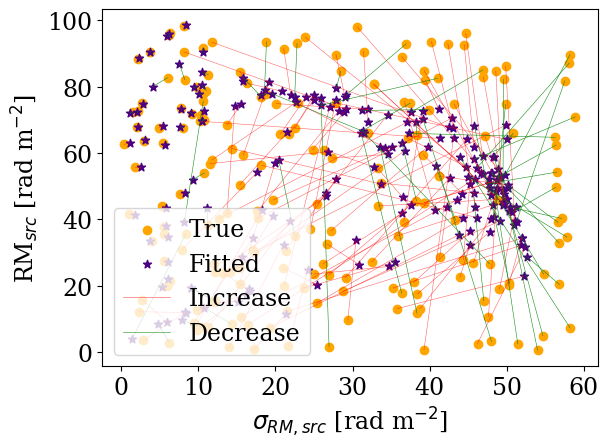

In [8]:
plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 17})
N = 200
indices = np.random.randint(0,7000,size=N)

plt.scatter(y=MS_MS_band1_merge_10000.RM_src_radm2[indices], x=MS_MS_band1_merge_10000.sigma_RM_2[indices], c='orange', label='True')
plt.scatter(y=MS_MS_band1_merge_10000.deltaRM_radm2[indices], x=MS_MS_band1_merge_10000.sigmaRM_radm2[indices], c='indigo', marker="*", label='Fitted')

xs = MS_MS_band1_merge_10000.RM_src_radm2[indices]
ys = MS_MS_band1_merge_10000.sigma_RM_2[indices]

x1s = MS_MS_band1_merge_10000.deltaRM_radm2[indices]
y1s = MS_MS_band1_merge_10000.sigmaRM_radm2[indices]

xs = np.asarray(xs)
ys = np.asarray(ys)

x1s = np.asarray(x1s)
y1s = np.asarray(y1s)
j=0
k=0

for i in range(0,N):

    if ys[i] < y1s[i]:
        #If the fitted parameter is too large
        if j == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', label='Increase', linewidth=0.4, alpha=0.7)
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', linewidth=0.4, alpha=0.6)

        j += 1
    else:
        #If the fitted parameter is too small
        if k == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g',linewidth=0.4, alpha=0.9, label='Decrease')
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g', linewidth=0.4, alpha=0.9)

        k += 1

            
        
plt.ylabel('RM$_{src}$ [rad m$^{-2}$]')
plt.xlabel('$\sigma_{RM, src}$ [rad m$^{-2}$]')
plt.legend(loc='lower left')
plt.tight_layout()
plt.savefig('MS_movement.pdf', format='pdf')
        
        

<>:6: SyntaxWarning: invalid escape sequence '\s'
<>:12: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:20: SyntaxWarning: invalid escape sequence '\s'
<>:6: SyntaxWarning: invalid escape sequence '\s'
<>:12: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:20: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3154096225.py:6: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3154096225.py:12: SyntaxWarning: invalid escape sequence '\s'
  plt.colorbar(label='Residual$_{{\sigma_{RM}}}$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3154096225.py:13: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3154096225.py:20: SyntaxWarning: invalid e

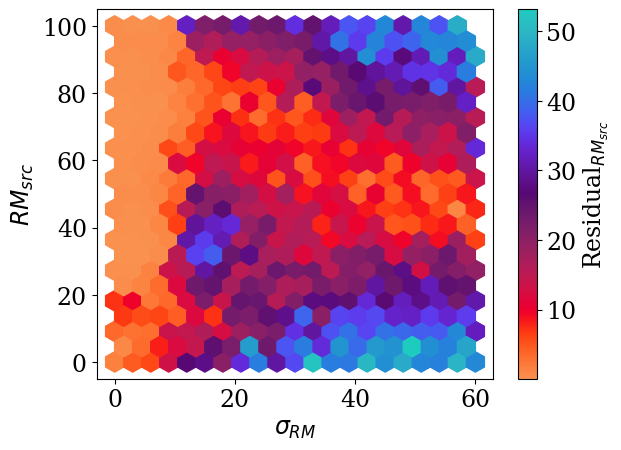

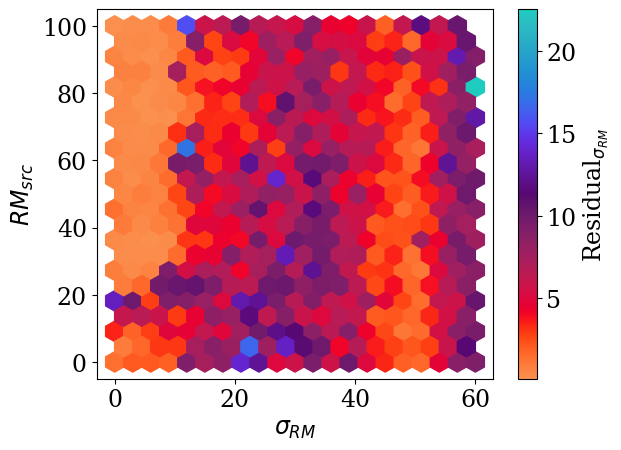

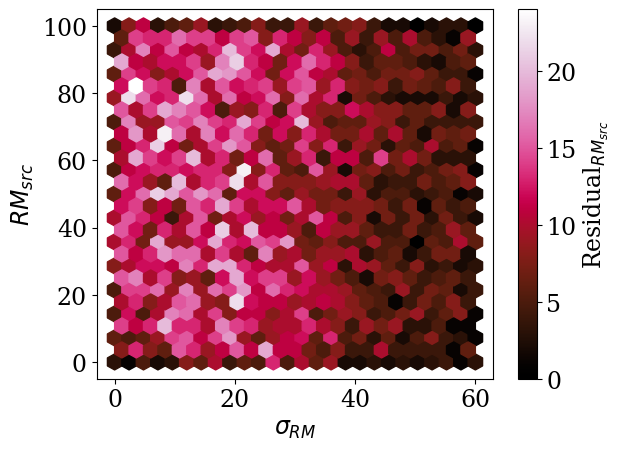

In [9]:
lnEVD_cut = 200

delta_rm_resdiuals = (MS_MS_band1_merge_sigma_limit_10000.RM_src_radm2 - MS_MS_band1_merge_sigma_limit_10000.deltaRM_radm2) 
plt.hexbin(MS_MS_band1_merge_sigma_limit_10000.sigma_RM_2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_band1_merge_sigma_limit_10000.RM_src_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > lnEVD_cut],abs(delta_rm_resdiuals[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > lnEVD_cut]), gridsize=20,reduce_C_function=np.median, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{{RM_{src}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.show()

sigma_rm_resdiuals = (MS_MS_band1_merge_sigma_limit_10000.sigma_RM_2 - MS_MS_band1_merge_sigma_limit_10000.sigmaRM_radm2) 
plt.hexbin(MS_MS_band1_merge_sigma_limit_10000.sigma_RM_2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_band1_merge_sigma_limit_10000.RM_src_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > lnEVD_cut],abs(sigma_rm_resdiuals[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > lnEVD_cut]), gridsize=20,reduce_C_function=np.median, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{{\sigma_{RM}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.show()

sigma_rm_resdiuals = (MS_MS_band1_merge_sigma_limit_10000.sigma_RM_2 - MS_MS_band1_merge_sigma_limit_10000.sigmaRM_radm2) 
plt.hexbin(MS_MS_band1_merge_sigma_limit_10000.sigma_RM_2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_band1_merge_sigma_limit_10000.RM_src_radm2[MS_MS_band1_merge_sigma_limit_10000['ln(EVIDENCE) '] > lnEVD_cut], gridsize=25,reduce_C_function=np.sum, cmap='cmr.flamingo' )
plt.colorbar(label='Residual$_{{RM_{src}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.show()

# ERROR BARS

<>:21: SyntaxWarning: invalid escape sequence '\s'
<>:21: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2454510553.py:21: SyntaxWarning: invalid escape sequence '\s'
  ax2.set_xlabel('Residual$_{{\sigma_{src}}}$ / error')


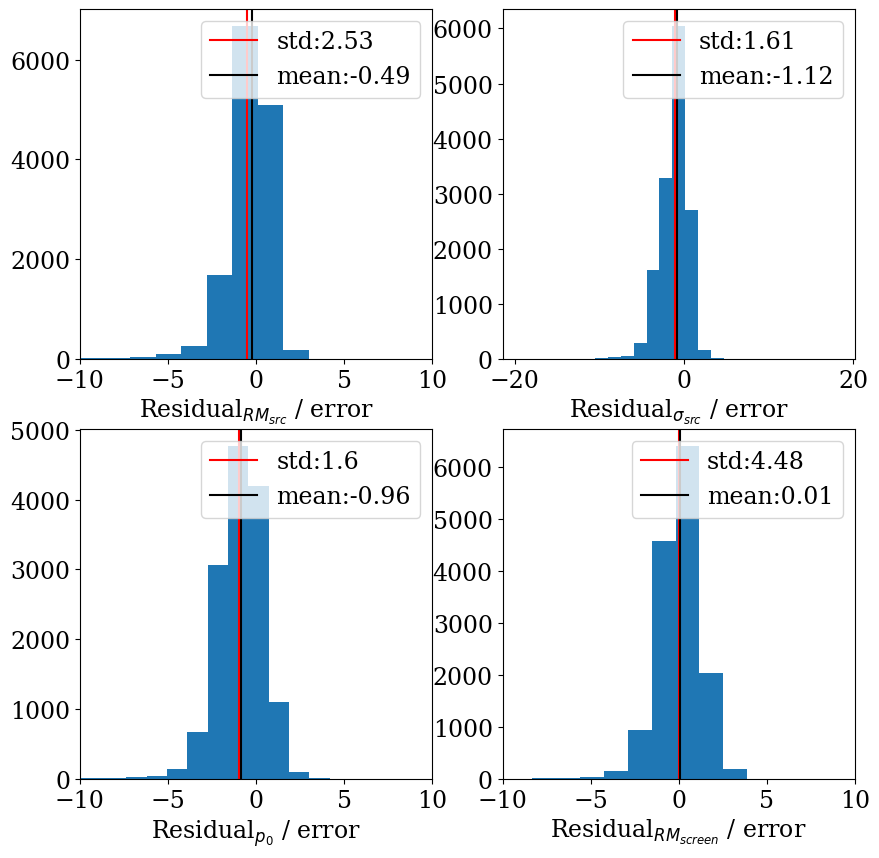

In [10]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))
evdcut=20
delta_rm_resdiuals_err = (MS_MS_band1_merge_17000.RM_src_radm2 - MS_MS_band1_merge_17000.deltaRM_radm2) / MS_MS_band1_merge_17000.deltaRM_radm2_plus_err
sigma_rm_resdiuals_err = (MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2) / MS_MS_band1_merge_17000.sigmaRM_radm2_plus_err
frac_pol_resdiuals_err = (MS_MS_band1_merge_17000.frac_pol - MS_MS_band1_merge_17000.fracPol) / MS_MS_band1_merge_17000.fracPol_plus_err
RM_screen_resdiuals_err = (MS_MS_band1_merge_17000.RM_screen_radm2 - MS_MS_band1_merge_17000.RM_radm2) / MS_MS_band1_merge_17000.RM_radm2_plus_err
psi_residuals_err = (MS_MS_band1_merge_17000.psi0_deg_y - MS_MS_band1_merge_17000.psi0_deg_x) / MS_MS_band1_merge_17000.psi0_deg_plus_err

ax1.hist(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut], bins=100)
ax1.axvline(x=np.mean(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax1.axvline(x=np.median(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'k', label='mean:{}'.format(np.round(np.mean(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax1.set_xlabel('Residual$_{{RM_{src}}}$ / error')
ax1.set_xlim(-10,10)
ax1.legend()

#AX2 - sigma_RM_FG
ax2.hist(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut], bins=25)
ax2.axvline(x=np.mean(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax2.axvline(x=np.median(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'k', label='mean:{}'.format(np.round(np.mean(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))

ax2.set_xlabel('Residual$_{{\sigma_{src}}}$ / error')
ax2.legend()

#AX3 - frac pol
ax3.hist(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut], bins=50)
ax3.axvline(x=np.mean(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax3.axvline(x=np.median(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'k', label='mean:{}'.format(np.round(np.mean(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))

ax3.set_xlabel('Residual$_{p_{0}}$ / error')
ax3.set_xlim(-10,10)
ax3.legend()

#AX4 - RM screen
ax4.hist(RM_screen_resdiuals_err, bins=250)
ax4.axvline(x=np.mean(RM_screen_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(psi_residuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax4.axvline(x=np.median(RM_screen_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'k', label='mean:{}'.format(np.round(np.mean(psi_residuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))

ax4.set_xlabel('Residual$_{RM_{screen}}$ / error')
ax4.set_xlim(-10,10)
ax4.legend()


# Full BAnd

<>:21: SyntaxWarning: invalid escape sequence '\s'
<>:21: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1395179187.py:21: SyntaxWarning: invalid escape sequence '\s'
  ax2.set_xlabel('Residual$_{{\sigma_{src}}}$ / error')


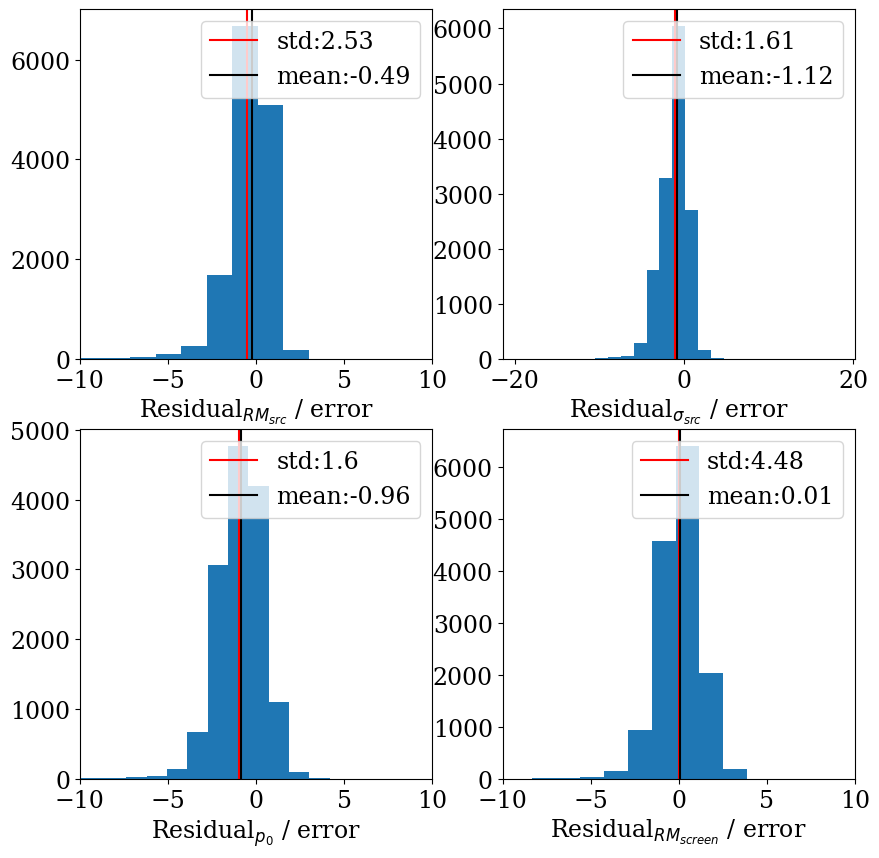

In [11]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))
evdcut=20
delta_rm_resdiuals_err = (MS_MS_band1_merge_17000.RM_src_radm2 - MS_MS_band1_merge_17000.deltaRM_radm2) / MS_MS_band1_merge_17000.deltaRM_radm2_plus_err
sigma_rm_resdiuals_err = (MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2) / MS_MS_band1_merge_17000.sigmaRM_radm2_plus_err
frac_pol_resdiuals_err = (MS_MS_band1_merge_17000.frac_pol - MS_MS_band1_merge_17000.fracPol) / MS_MS_band1_merge_17000.fracPol_plus_err
RM_screen_resdiuals_err = (MS_MS_band1_merge_17000.RM_screen_radm2 - MS_MS_band1_merge_17000.RM_radm2) / MS_MS_band1_merge_17000.RM_radm2_plus_err
psi_residuals_err = (MS_MS_band1_merge_17000.psi0_deg_y - MS_MS_band1_merge_17000.psi0_deg_x) / MS_MS_band1_merge_17000.psi0_deg_plus_err

ax1.hist(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut], bins=100)
ax1.axvline(x=np.mean(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax1.axvline(x=np.median(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'k', label='mean:{}'.format(np.round(np.mean(delta_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax1.set_xlabel('Residual$_{{RM_{src}}}$ / error')
ax1.set_xlim(-10,10)
ax1.legend()

#AX2 - sigma_RM_FG
ax2.hist(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut], bins=25)
ax2.axvline(x=np.mean(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax2.axvline(x=np.median(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'k', label='mean:{}'.format(np.round(np.mean(sigma_rm_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))

ax2.set_xlabel('Residual$_{{\sigma_{src}}}$ / error')
ax2.legend()

#AX3 - frac pol
ax3.hist(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut], bins=50)
ax3.axvline(x=np.mean(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax3.axvline(x=np.median(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'k', label='mean:{}'.format(np.round(np.mean(frac_pol_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))

ax3.set_xlabel('Residual$_{p_{0}}$ / error')
ax3.set_xlim(-10,10)
ax3.legend()

#AX4 - RM screen
ax4.hist(RM_screen_resdiuals_err, bins=250)
ax4.axvline(x=np.mean(RM_screen_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(psi_residuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))
ax4.axvline(x=np.median(RM_screen_resdiuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), color = 'k', label='mean:{}'.format(np.round(np.mean(psi_residuals_err[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > evdcut]), 2)))

ax4.set_xlabel('Residual$_{RM_{screen}}$ / error')
ax4.set_xlim(-10,10)
ax4.legend()

In [12]:
def get_contours_nonerr(x, y, z, ax, vn=-1, vx=1):
    import matplotlib as mpl
    from scipy.stats import gaussian_kde
    
    # Create hexbin plot with log scale on the x-axis
    #cmap = (mpl.colors.ListedColormap(['darkblue', 'royalblue', 'deepskyblue', 'yellow', 'gold', 'orange']).with_extremes(over='red', under='blue'))
    #bounds = [-50.0, -1.0, -0.5, 0.0, 0.5, 1.0, 50.0]
    #norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    
    hb=plt.hexbin(x, y, z, gridsize = 25, reduce_C_function=np.median, vmin=vn, vmax=vx, cmap='cmr.guppy')
    
    if ax==1:
        plt.colorbar(hb,label='|Residual $RM_{screen}$|')
        plt.xlabel('SNR')
        plt.ylabel('ln(EVD)')
    if ax == 2:
        plt.colorbar(hb,label='Residual $p_{0}$')
        name = 'error_MS_frac_pol_b1.pdf'
        plt.ylabel('$p_{0}$, QU')
        plt.xlabel('ln(EVD)')
    if ax == 3:
        plt.colorbar(hb,label='|Residual $\psi_{0}$|')
        name = 'error_MS_psi_b1.pdf'
        plt.xlabel('ln(EVD)')
        
    if ax == 4:
        plt.ylabel('$RM_{src}$, QU')
        plt.xlabel('$\sigma_{RM}, QU$')
        plt.colorbar(hb,label='|Residual $RM_{src}$|')
        name = 'error_MS_RM_src_b1.pdf'
        plt.axvline(x=20, linestyle='--', linewidth=2, color='gold', label='POSSUM Combined Band')
        plt.axvline(x=30, linestyle='dotted', linewidth=2, color='gold', label='900 – 1700 MHz')
        plt.legend(fontsize=11)
        
    if ax == 5:
        plt.ylabel('$RM_{src}$, QU')
        name = 'error_MS_sigma_RM_b1.pdf'
        plt.xlabel('$\sigma_{RM}, QU$')
        plt.colorbar(hb,label='|Residual $\sigma_{RM}$| / err')

    
    
    # Add colorbar to hexbin plot
    
    # Kernel Density Estimation (KDE) for contour overlay
    
    plt.tight_layout()
    #plt.savefig(name, format='pdf')
    plt.show()

<>:22: SyntaxWarning: invalid escape sequence '\p'
<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:38: SyntaxWarning: invalid escape sequence '\s'
<>:39: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\p'
<>:28: SyntaxWarning: invalid escape sequence '\s'
<>:38: SyntaxWarning: invalid escape sequence '\s'
<>:39: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/453821418.py:22: SyntaxWarning: invalid escape sequence '\p'
  plt.colorbar(hb,label='|Residual $\psi_{0}$|')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/453821418.py:28: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}, QU$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/453821418.py:38: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}, QU$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/453821418.py:39: SyntaxWarning: inva

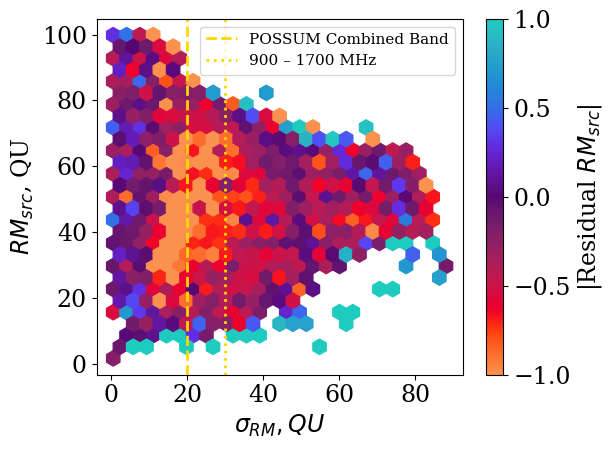

In [13]:
lnEVD_cut = 20
SNR_cut = 10

delta_rm_resdiuals = (MS_MS_band1_merge_17000.RM_src_radm2 - MS_MS_band1_merge_17000.deltaRM_radm2) 
get_contours_nonerr(MS_MS_band1_merge_17000.sigmaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], MS_MS_band1_merge_17000.deltaRM_radm2[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) &  (MS_MS_band1_merge_17000.SNR >SNR_cut)], delta_rm_resdiuals_err[(MS_MS_band1_merge_17000['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_band1_merge_17000.SNR >SNR_cut)], ax=4)







## There is a signal to noise floor at SNR < 7 where QU fitting over estiamtes the Delta RM But now let's look at goodness of fit


In [14]:

delta_rm_resdiuals = (MS_MS_band1_merge_17000.RM_src_radm2 - MS_MS_band1_merge_17000.deltaRM_radm2) 
plt.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 20], MS_MS_band1_merge_17000['ln(EVIDENCE) '][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 20],sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 20], gridsize=25,reduce_C_function=np.median,vmin=-40, vmax=40, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{{RM_{src}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('ln(EVD)')

<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:4: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2718865897.py:4: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2718865897.py:4: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}$')


IndexError: boolean index did not match indexed array along dimension 0; dimension is 6945 but corresponding boolean dimension is 13890

# Should try to remove the sources that it perferred the screen

In [ ]:
sigma_rm_resdiuals = (MS_MS_band1_merge_10000.sigma_RM_2 - MS_MS_band1_merge_10000.sigmaRM_radm2) / MS_MS_band1_merge_10000.sigmaRM_radm2_plus_err
plt.hexbin(MS_MS_band1_merge_10000.RM_src_radm2[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > 3], MS_MS_band1_merge_10000.SNR[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > 3],sigma_rm_resdiuals[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > 3], gridsize=20, vmin=-3, vmax=3, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{\sigma_{RM}}$ / error')
plt.xlabel('$RM_{src}$')
plt.ylabel('SNR')

In [ ]:
delta_rm_resdiuals = (MS_MS_band1_merge_10000.RM_src_radm2 - MS_MS_band1_merge_10000.deltaRM_radm2) / MS_MS_band1_merge_10000.deltaRM_radm2_plus_err
plt.hexbin(MS_MS_band1_merge_10000.RM_src_radm2[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > 3], MS_MS_band1_merge_10000.sigma_RM_2[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > 3],delta_rm_resdiuals[MS_MS_band1_merge_10000['ln(EVIDENCE) '] > 3], gridsize=20, vmin=-3, vmax=3, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{RM_{src}}$ / error')
plt.xlabel('$RM_{src}$')
plt.ylabel('$\sigma_{RM}$')

# What Does the SNR vs goodness of fit look like?

In [ ]:
def get_contours_resdi(x, y, z, ax, axe, vn, vx):
    import matplotlib as mpl
    from scipy.stats import gaussian_kde
    
    # Create hexbin plot with log scale on the x-axis
    #cmap = (mpl.colors.ListedColormap(['darkblue', 'royalblue', 'deepskyblue', 'yellow', 'gold', 'orange']).with_extremes(over='red', under='blue'))
    #bounds = [-50.0, -1.0, -0.5, 0.0, 0.5, 1.0, 50.0]
    #norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    
    hb=axe.hexbin(x, y, z, reduce_C_function=np.mean, gridsize=30, yscale='log', vmin=vn, vmax=vx, cmap='cmr.guppy')
    if ax==1:
        plt.colorbar(hb,label='Residual $RM_{screen}$')
        axe.set_xlabel('SNR')
        axe.set_ylabel('ln(EVD)')
    if ax == 2:
        plt.colorbar(hb,label='Residual $p_{0}$')
    if ax == 3:
        plt.colorbar(hb,label='Residual $\psi_{0}$')
    if ax == 4:
        axe.set_ylabel('ln(EVD)')
        axe.set_xlabel('SNR')
        plt.colorbar(hb,label='Residual $\Delta RM_{0}$')
    if ax == 5:
        plt.colorbar(hb,label='Residual $\sigma_{RM}$')

        
    axe.set_xlim(0,50)
    axe.set_ylim(0,100)
    
    #hb = plt.hexbin(x, y, gridsize=25, cmap='Blues', xscale='log', mincnt=1)
    
    # Set x-axis to log scale
    
    
    # Add colorbar to hexbin plot
    
    # Kernel Density Estimation (KDE) for contour overlay
    xy = np.vstack([np.log10(x), y])  # Log transform x for KDE
    kde = gaussian_kde(xy)
    z_i = kde(xy)
    
    # Sort the density values to create population contours
    sorted_z = np.sort(z_i)
    cumulative_z = np.cumsum(sorted_z)
    cumulative_z /= cumulative_z[-1]  # Normalize to [0, 1]
    
    # Define contour levels for different population percentages
    contour_levels = [0.01, .1, 0.5, 0.9]  # 10%, 25%, 50%, 75%, and 90%
    
    fmt = {}
    # Map contour levels to actual density values
    density_levels = np.interp(contour_levels, cumulative_z, sorted_z)
    CS = axe.tricontour(x, y, z_i, levels=density_levels, linewidths=1.5, extend='neither', colors='red')
    strs = ['99 %', '90 %', '50 %', '10 %']
    for l, s in zip(CS.levels, strs):
        fmt[l] = s
    axe.clabel(CS, CS.levels, inline=1,fmt=fmt, fontsize=10)

In [ ]:
def get_contours_nonlnbf(x, y, z, ax, axe, vn, vx):
    import matplotlib as mpl
    from scipy.stats import gaussian_kde
    
    # Create hexbin plot with log scale on the x-axis
    #cmap = (mpl.colors.ListedColormap(['darkblue', 'royalblue', 'deepskyblue', 'yellow', 'gold', 'orange']).with_extremes(over='red', under='blue'))
    #bounds = [-50.0, -1.0, -0.5, 0.0, 0.5, 1.0, 50.0]
    #norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    
    hb=axe.hexbin(x, y, z, reduce_C_function=np.mean, gridsize=30, yscale='log', vmin=vn, vmax=vx, cmap='cmr.guppy')
    if ax==1:
        plt.colorbar(hb,label='Residual $RM_{screen}$')
        axe.set_xlabel('SNR')
        axe.set_ylabel('ln(EVD)')
    if ax == 2:
        plt.colorbar(hb,label='Residual $p_{0}$')
    if ax == 3:
        plt.colorbar(hb,label='Residual $\psi_{0}$')
    if ax == 4:
        axe.set_ylabel('ln(EVD)')
        axe.set_xlabel('SNR')
        plt.colorbar(hb,label='Residual $\Delta RM_{0}$')
    if ax == 5:
        plt.colorbar(hb,label='Residual $\sigma_{RM}$')

        
    axe.set_xlim(0,50)
    axe.set_ylim(0,100)
    
    #hb = plt.hexbin(x, y, gridsize=25, cmap='Blues', xscale='log', mincnt=1)
    
    # Set x-axis to log scale
    
    
    # Add colorbar to hexbin plot
    
    # Kernel Density Estimation (KDE) for contour overlay
    xy = np.vstack([np.log10(x), y])  # Log transform x for KDE
    kde = gaussian_kde(xy)
    z_i = kde(xy)
    
    # Sort the density values to create population contours
    sorted_z = np.sort(z_i)
    cumulative_z = np.cumsum(sorted_z)
    cumulative_z /= cumulative_z[-1]  # Normalize to [0, 1]
    
    # Define contour levels for different population percentages
    contour_levels = [0.01, .1, 0.5, 0.9]  # 10%, 25%, 50%, 75%, and 90%
    
    fmt = {}
    # Map contour levels to actual density values
    density_levels = np.interp(contour_levels, cumulative_z, sorted_z)
    CS = axe.tricontour(x, y, z_i, levels=density_levels, linewidths=1.5, extend='neither', colors='red')
    strs = ['99 %', '90 %', '50 %', '10 %']
    for l, s in zip(CS.levels, strs):
        fmt[l] = s
    axe.clabel(CS, CS.levels, inline=1,fmt=fmt, fontsize=10)

NameError: name 'get_contours_resdi' is not defined

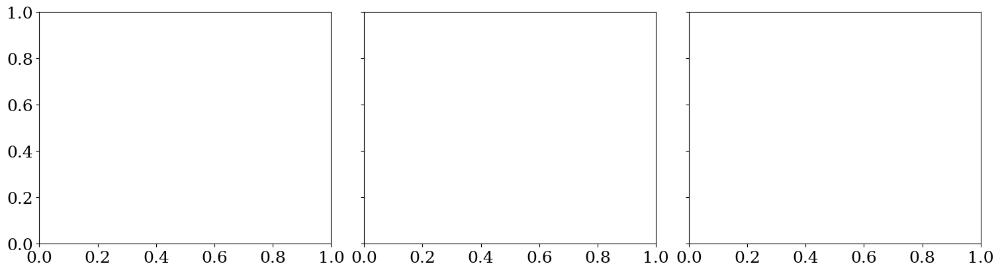

In [15]:
plt.rcParams.update({'font.size': 18})
fig_chi, ax_test = plt.subplots(nrows=1, ncols=3, figsize=(15,4), sharey=True, constrained_layout=True)

MS_MS_band1_merge['RM_residual'] = MS_MS_band1_merge.RM_screen_radm2 - MS_MS_band1_merge.RM_radm2
MS_MS_band1_merge['psi_residual'] = MS_MS_band1_merge.psi0_deg_y - MS_MS_band1_merge.psi0_deg_x
MS_MS_band1_merge['p_residual'] = MS_MS_band1_merge.frac_pol - MS_MS_band1_merge.fracPol

EVD_CUT =5 

get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['ln(EVIDENCE) '][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['RM_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 1, ax_test[0], -2, 2)
get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['ln(EVIDENCE) '][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['p_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 2, ax_test[1], -0.5, 0.5)
get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['ln(EVIDENCE) '][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['psi_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 2, ax_test[2], -20, 20)

print(MS_MS_band1_merge.keys())


In [ ]:
plt.rcParams.update({'font.size': 18})
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(9,4), sharey=True, constrained_layout=True)

MS_MS_band1_merge['deltaRM_residual'] = MS_MS_band1_merge.RM_src_radm2 - MS_MS_band1_merge.deltaRM_radm2
MS_MS_band1_merge['sigma_residual'] = MS_MS_band1_merge.sigma_RM_2 - MS_MS_band1_merge.sigmaRM_radm2


get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['ln(EVIDENCE) '][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['deltaRM_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 4, ax_test[0], -20, 20)
get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['ln(EVIDENCE) '][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['sigma_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 5, ax_test[1], -60, 60)




In [ ]:
plt.rcParams.update({'font.size': 18})
fig_chi, ax_test = plt.subplots(nrows=1, ncols=3, figsize=(15,4), sharey=True, constrained_layout=True)

MS_MS_band1_merge['RM_residual'] = MS_MS_band1_merge.RM_screen_radm2 - MS_MS_band1_merge.RM_radm2
MS_MS_band1_merge['psi_residual'] = MS_MS_band1_merge.psi0_deg_y - MS_MS_band1_merge.psi0_deg_x
MS_MS_band1_merge['p_residual'] = MS_MS_band1_merge.frac_pol - MS_MS_band1_merge.fracPol

EVD_CUT =5 

get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['sigmaRM_radm2'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['RM_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 1, ax_test[0], -2, 2)
get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['sigmaRM_radm2'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['p_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 2, ax_test[1], -0.5, 0.5)
get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['sigmaRM_radm2'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['psi_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 2, ax_test[2], -20, 20)


fig_4, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(9,4), sharey=True, constrained_layout=True)

MS_MS_band1_merge['deltaRM_residual'] = MS_MS_band1_merge.RM_src_radm2 - MS_MS_band1_merge.deltaRM_radm2
MS_MS_band1_merge['sigma_residual'] = MS_MS_band1_merge.sigma_RM_2 - MS_MS_band1_merge.sigmaRM_radm2


get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['sigmaRM_radm2'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['deltaRM_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 4, ax_test[0], -20, 20)
get_contours_resdi(MS_MS_band1_merge.SNR[MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['sigmaRM_radm2'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], MS_MS_band1_merge['sigma_residual'][MS_MS_band1_merge['ln(EVIDENCE) '] > EVD_CUT], 5, ax_test[1], -60, 60)




# Now need to look at the error bars

In [ ]:
delta_rm_resdiuals = (MS_MS_band1_merge_17000.RM_src_radm2 - MS_MS_band1_merge_17000.deltaRM_radm2) / MS_MS_band1_merge_17000.deltaRM_radm2_plus_err
sigma_rm_resdiuals_err = (MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2) / MS_MS_band1_merge_17000.sigmaRM_radm2_plus_err
frac_pol_resdiuals_err = (MS_MS_band1_merge_17000.frac_pol - MS_MS_band1_merge_17000.fracPol) / MS_MS_band1_merge_17000.fracPol_plus_err
RM_screen_resdiuals_err = (MS_MS_band1_merge_17000.RM_screen_radm2 - MS_MS_band1_merge_17000.RM_radm2) / MS_MS_band1_merge_17000.RM_radm2_plus_err
psi_residuals_err = (MS_MS_band1_merge_17000.psi0_deg_y - MS_MS_band1_merge_17000.psi0_deg_x) / MS_MS_band1_merge_17000.psi0_deg_plus_err


plt.hexbin(MS_MS_band1_merge_17000.SNR[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], MS_MS_band1_merge_17000['ln(EVIDENCE) '][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10],frac_pol_resdiuals_err[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], gridsize=20, yscale='log',vmin=-2, vmax=2, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{RM_{src}}$ / error')
plt.ylabel('ln(EVD)')
plt.xlabel('SNR')
plt.show()

plt.hexbin(MS_MS_band1_merge_17000.RM_screen_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], MS_MS_band1_merge_17000.deltaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10],RM_screen_resdiuals_err[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], gridsize=20,vmin=-2, vmax=2, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{RM_{src}}$ / error')
plt.ylabel('$RM_{src}$, QU')
plt.xlabel('$\sigma_{RM}, QU$')
plt.show()

<>:11: SyntaxWarning: invalid escape sequence '\s'
<>:11: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1923791331.py:11: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}, QU$')


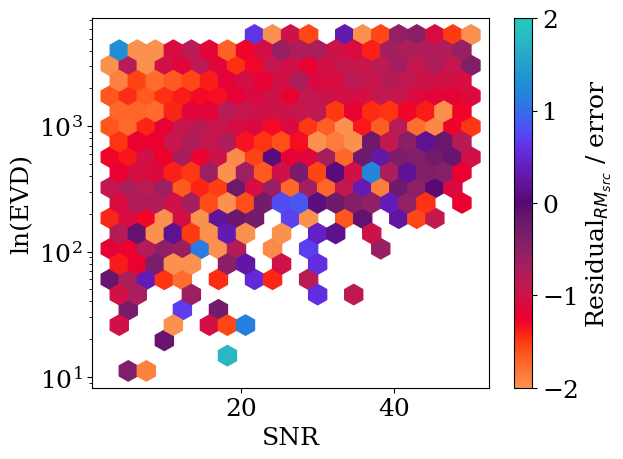

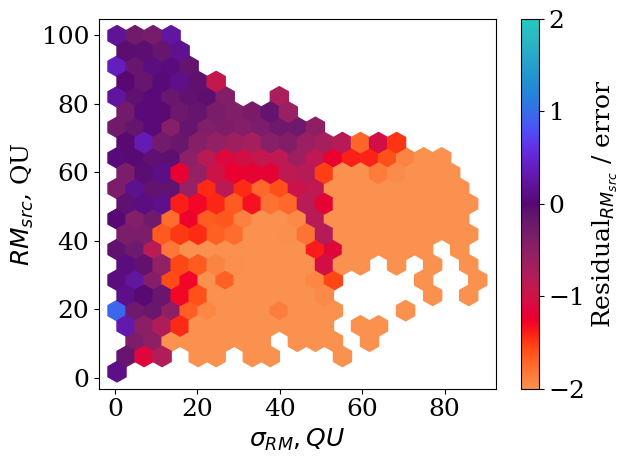

In [16]:
sigma_rm_resdiuals = (MS_MS_band1_merge_17000.sigma_RM_2 - MS_MS_band1_merge_17000.sigmaRM_radm2) / MS_MS_band1_merge_17000.sigmaRM_radm2_plus_err
plt.hexbin(MS_MS_band1_merge_17000.SNR[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], MS_MS_band1_merge_17000['ln(EVIDENCE) '][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10],sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], gridsize=20, yscale='log',vmin=-2, vmax=2, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{RM_{src}}$ / error')
plt.ylabel('ln(EVD)')
plt.xlabel('SNR')
plt.show()

plt.hexbin(MS_MS_band1_merge_17000.sigmaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], MS_MS_band1_merge_17000.deltaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10],sigma_rm_resdiuals[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], gridsize=20,vmin=-2, vmax=2, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{RM_{src}}$ / error')
plt.ylabel('$RM_{src}$, QU')
plt.xlabel('$\sigma_{RM}, QU$')
plt.show()



In [17]:
#MS_MS_band1_merge['RM_residual'] = MS_MS_band1_merge_17000.RM_screen_radm2 - MS_MS_band1_merge_17000.RM_radm2
#MS_MS_band1_merge['psi_residual'] = MS_MS_band1_merge_17000.psi0_deg_y - MS_MS_band1_merge_17000.psi0_deg_x
p_residual_err= (MS_MS_band1_merge_17000.frac_pol - MS_MS_band1_merge_17000.fracPol) / MS_MS_band1_merge_17000.fracPol_plus_err

<>:10: SyntaxWarning: invalid escape sequence '\s'
<>:10: SyntaxWarning: invalid escape sequence '\s'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3486139332.py:10: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('$\sigma_{RM}, QU$')


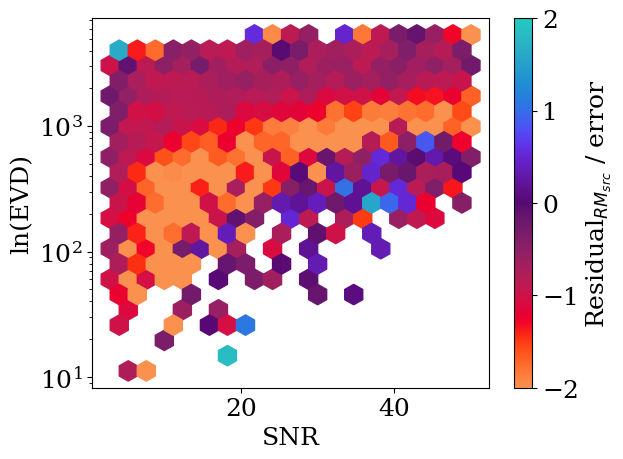

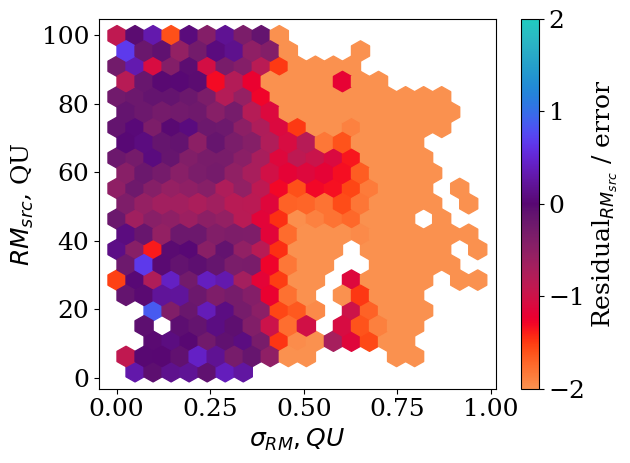

In [18]:
plt.hexbin(MS_MS_band1_merge_17000.SNR[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], MS_MS_band1_merge_17000['ln(EVIDENCE) '][MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10],p_residual_err[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], gridsize=20, yscale='log',vmin=-2, vmax=2, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{RM_{src}}$ / error')
plt.ylabel('ln(EVD)')
plt.xlabel('SNR')
plt.show()

plt.hexbin(MS_MS_band1_merge_17000.fracPol[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], MS_MS_band1_merge_17000.deltaRM_radm2[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10],p_residual_err[MS_MS_band1_merge_17000['ln(EVIDENCE) '] > 10], gridsize=20,vmin=-2, vmax=2, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{RM_{src}}$ / error')
plt.ylabel('$RM_{src}$, QU')
plt.xlabel('$\sigma_{RM}, QU$')
plt.show()

# show the median res

In [19]:
def get_the_mean(x, y, z):
    rm_list = [10,20,30,40,50,60,70,80,90]
    sigma_list = [10,20,30,40,50,60,70,80,90]

    rm_means = []
    sigma_means = []
    
    for i in range(len(rm_list)):
        
        rm_means.append(np.mean(z[(x < rm_list[i]) & (x > rm_list[i] - 10)]))
        sigma_means.append(np.mean(z[(y < sigma_list[i]) & (y > sigma_list[i] - 10)]))
        
    return rm_means, sigma_means
        

    
    

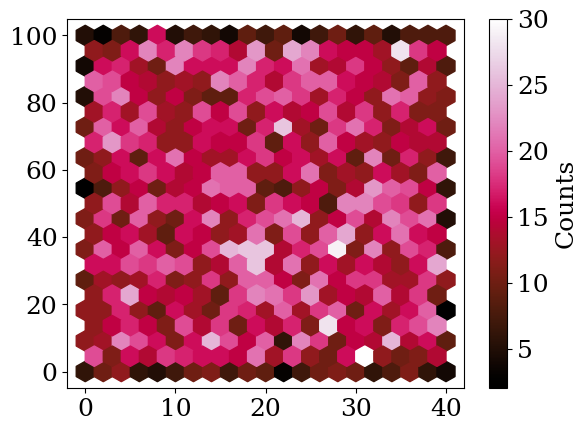

In [20]:
plt.hexbin(MS_MS_band1_merge.sigma_RM_2, MS_MS_band1_merge.RM_src_radm2, reduce_C_function=np.sum, gridsize=20, cmap='cmr.flamingo')
plt.colorbar(label='Counts')

# Check the SNR and residuals to see that they are reasonable

In [21]:
MS_MS_band1_merge['rm_residual'] = MS_MS_band1_merge.RM_screen_radm2 - MS_MS_band1_merge.RM_radm2
MS_RFG_band1_merge['rm_residual'] = (MS_RFG_band1_merge.RM_screen_radm2 + 0.5*MS_RFG_band1_merge.RM_src_radm2 )- MS_RFG_band1_merge.RM_radm2
print(len(MS_RFG_band1_merge['BIC']))

MS_MS_band1_merge['delta_BIC_7_10'] = MS_MS_band1_merge['BIC'] - MS_RFG_band1_merge['BIC']
MS_MS_band1_merge['delta_AIC_7_10'] = MS_MS_band1_merge['AIC'] - MS_RFG_band1_merge['AIC']
MS_MS_band1_merge['delta_chi_7_10'] = MS_MS_band1_merge['chiSq'] - MS_RFG_band1_merge['chiSq']
MS_MS_band1_merge['delta_evd_7_10'] = MS_MS_band1_merge['ln(EVIDENCE) '] - MS_RFG_band1_merge['ln(EVIDENCE) ']

7000


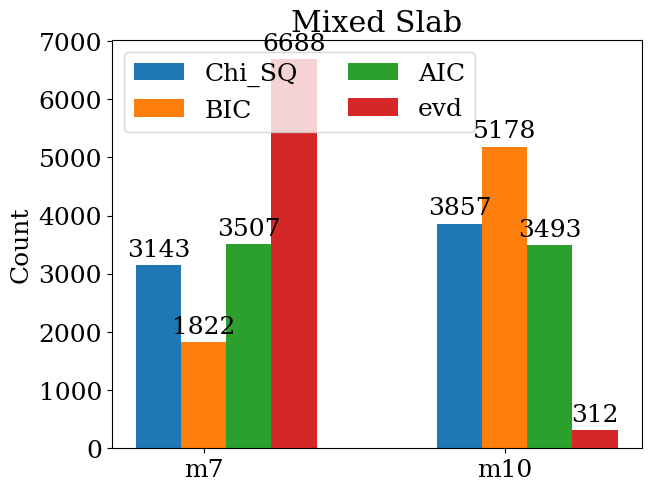

In [22]:
MS_MS_band1_merge['is_good_model_chi']= MS_MS_band1_merge.chiSq < MS_RFG_band1_merge.chiSq
MS_MS_band1_merge['is_good_model_BIC'] = MS_MS_band1_merge.BIC < MS_RFG_band1_merge.BIC
MS_MS_band1_merge['is_good_model_AIC'] = MS_MS_band1_merge.AIC < MS_RFG_band1_merge.AIC
MS_MS_band1_merge['is_good_model_evd'] = MS_MS_band1_merge['ln(EVIDENCE) '] > MS_RFG_band1_merge['ln(EVIDENCE) ']

species = ("m7", "m10")
penguin_means = {
    'Chi_SQ': [np.sum(MS_MS_band1_merge['is_good_model_chi']), (7000-np.sum(MS_MS_band1_merge['is_good_model_chi']))],
    'BIC': [np.sum(MS_MS_band1_merge['is_good_model_BIC']), (7000-np.sum(MS_MS_band1_merge['is_good_model_BIC']))],
    'AIC': [np.sum(MS_MS_band1_merge['is_good_model_AIC']), (7000-np.sum(MS_MS_band1_merge['is_good_model_AIC']))],
    'evd': [np.sum(MS_MS_band1_merge['is_good_model_evd']), (7000-np.sum(MS_MS_band1_merge['is_good_model_evd']))],
}

x = np.arange(len(species))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in penguin_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count')
ax.set_title('Mixed Slab')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=2)
#ax.set_ylim(0, 1000)

plt.show()

<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:5: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:3: SyntaxWarning: invalid escape sequence '\D'
<>:5: SyntaxWarning: invalid escape sequence '\D'
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3117213954.py:1: SyntaxWarning: invalid escape sequence '\D'
  plt.plot(MS_MS_band1_merge['ln(EVIDENCE) '], MS_MS_band1_merge.delta_BIC_7_10, '.', label='$\Delta BIC$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3117213954.py:2: SyntaxWarning: invalid escape sequence '\D'
  plt.plot(MS_MS_band1_merge['ln(EVIDENCE) '], MS_MS_band1_merge.delta_AIC_7_10, '.', label='$\Delta AIC$')
/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3117213954.py:3: SyntaxWarning: invalid escape sequence '\D'
  plt.plo

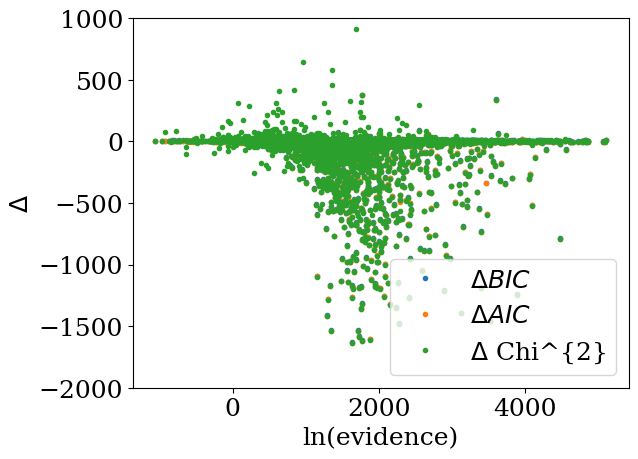

In [23]:
plt.plot(MS_MS_band1_merge['ln(EVIDENCE) '], MS_MS_band1_merge.delta_BIC_7_10, '.', label='$\Delta BIC$')
plt.plot(MS_MS_band1_merge['ln(EVIDENCE) '], MS_MS_band1_merge.delta_AIC_7_10, '.', label='$\Delta AIC$')
plt.plot(MS_MS_band1_merge['ln(EVIDENCE) '], MS_MS_band1_merge.delta_chi_7_10, '.', label='$\Delta$ Chi^{2}')
plt.xlabel('ln(evidence)')
plt.ylabel('$\Delta$')
plt.ylim(-2000,1000)
plt.legend()

# WHAT IS GOOD EVIDENCE?
I assumed that the larger the evidence the better the fit. Is this correct, not sure need to GOOGLE

Text(0, 0.5, 'RM residual')

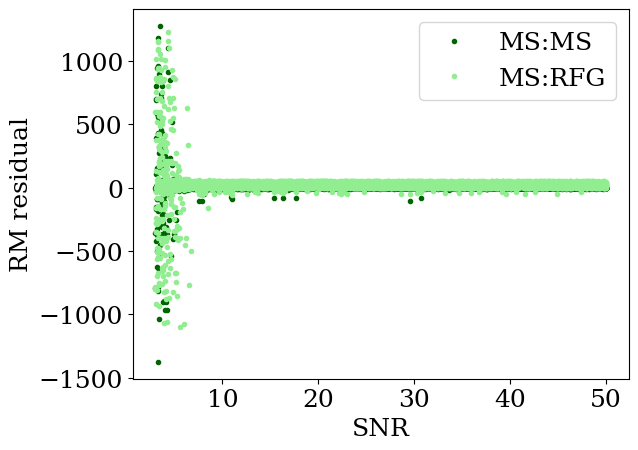

In [24]:
plt.plot(MS_MS_band1_merge['SNR'], MS_MS_band1_merge['rm_residual'], '.', color='darkgreen', label='MS:MS')
plt.plot(MS_RFG_band1_merge['SNR'], MS_RFG_band1_merge['rm_residual'], '.', color='lightgreen', label='MS:RFG')
plt.legend()
plt.xlabel('SNR')
plt.ylabel('RM residual')




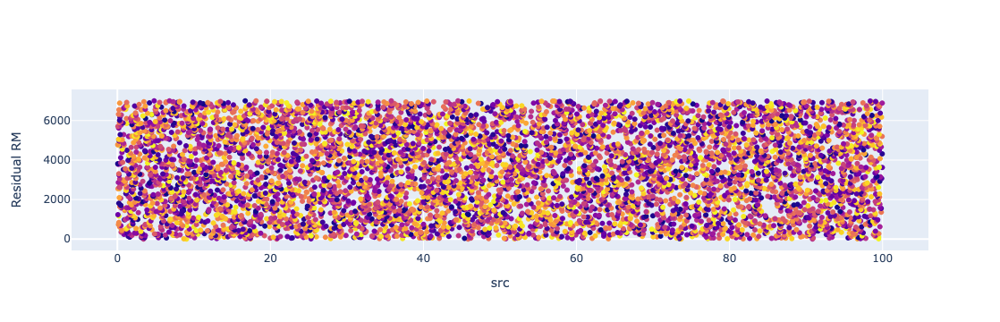

In [25]:


fig = go.Figure()
fig.add_scatter(x = MS_RFG_band1_merge.RM_src_radm2, y=MS_RFG_band1_merge.src, mode="markers", marker_color=MS_RFG_band1_merge.sigma_RM_2)
#fig.add_scatter(y = BS_FS_9000_src_sample.RM_src_radm2, x=BS_FS_9000_src_sample.SNR, c=BS_BS_9000_src_sample.src, mode="markers", marker_symbol="triangle-up",  name="BS m1", marker=dict(size=10, color='rgba(13,229,0,0.4)'))
fig.update_yaxes(title_text="Residual RM")
fig.update_xaxes(title_text="src ")
fig.show()

# Making the Hexbin plots 
The slab width and the RM dispersion are both interesting quantities

<>:16: SyntaxWarning:

invalid escape sequence '\s'

<>:21: SyntaxWarning:

invalid escape sequence '\s'

<>:28: SyntaxWarning:

invalid escape sequence '\D'

<>:16: SyntaxWarning:

invalid escape sequence '\s'

<>:21: SyntaxWarning:

invalid escape sequence '\s'

<>:28: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2598908642.py:16: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2598908642.py:21: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2598908642.py:28: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2598908642.py:16: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2598908642.py:21: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm00

NameError: name 'values_interest' is not defined

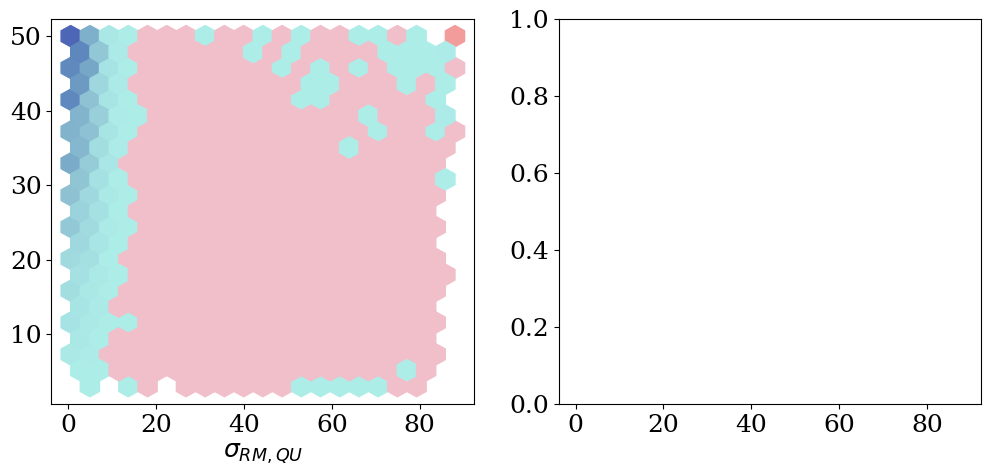

In [26]:
plt.rcParams.update({'font.size': 18})
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5), sharex=True)

bottom = plt.get_cmap('cmr.dusk_r', 12)
top= plt.get_cmap('cmr.sapphire', 244)
newcolors = np.vstack((top(np.linspace(0, 1, 244)), bottom(np.linspace(0, 0.09, 12))))
newcmp = ListedColormap(newcolors, name='embersaph')


bottom = plt.get_cmap('cmr.dusk_r', 22)
top= plt.get_cmap('cmr.sapphire', 234)
newcolors = np.vstack((top(np.linspace(0, 1, 234)), bottom(np.linspace(0, 0.09, 22))))
newcmp1 = ListedColormap(newcolors, name='embersaph')

hex1 = ax_test[0].hexbin(MS_MS_band1_merge['sigmaRM_radm2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['delta_BIC_7_10'],gridsize=20, vmax=100, vmin=-2000, cmap=newcmp)
ax_test[0].set_xlabel('$\sigma_{RM, QU}$')
ax_test[0].set_ylabel(values_interest[y_index])
ax_test[0].set_title('Slab')

hex2 = ax_test[1].hexbin(MS_MS_band1_merge['sigmaRM_radm2'][MS_MS_band1_merge['SNR']<11], MS_MS_band1_merge['SNR'][MS_MS_band1_merge['SNR']<11],MS_MS_band1_merge['delta_BIC_7_10'][MS_MS_band1_merge['SNR']<11], gridsize=18, reduce_C_function=np.median, cmap=newcmp1)
ax_test[1].set_xlabel('$\sigma_{RM}$')
ax_test[1].set_title('{} zoom in'.format('Slab'))

cbar_ax = fig_chi.add_axes([0.47, 0.15, 0.04, 0.7])
fig_chi.colorbar(hex1, cax=cbar_ax)

cbar_ax1 = fig_chi.add_axes([0.92, 0.15, 0.04, 0.7])
fig_chi.colorbar(hex2, cax=cbar_ax1, label='$\Delta$ $BIC_{T,A}$')

plt.subplots_adjust(left=0.2, bottom=0.1, right=0.9, top=0.9, wspace=0.7,hspace=0.6)


In [ ]:
from matplotlib.colors import ListedColormap
plt.rcParams.update({'font.size': 18})

#bottom = plt.get_cmap('cmr.dusk_r', 12)
#top= plt.get_cmap('cmr.sapphire', 244)
#newcolors = np.vstack((top(np.linspace(0, 1, 244)), bottom(np.linspace(0, 0.09, 12))))
#newcmp = ListedColormap(newcolors, name='embersaph')

bounds = [-2000,-10, -2.5, -1, 0, 10]
cmap_rb = plt.get_cmap('cmr.sapphire')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

plt.hexbin(MS_MS_band1_merge['sigma_RM_2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['delta_BIC_7_10'],gridsize=20, norm=norm, cmap=cmap)
plt.xlabel('$\sigma_{RM,QU}$')
plt.ylabel('SNR')

labels = (' ','S', 'M', 'W', 'IC' ,'IM')
cb = plt.colorbar(label='$\Delta$ $BIC_{7,10}$', ticklocation='bottom')
cb.ax.set_yticklabels(labels)


In [ ]:
plt.rcParams.update({'font.size': 18})
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5), sharex=True)
from matplotlib.colors import ListedColormap


bottom = plt.get_cmap('cmr.dusk_r', 1)
top= plt.get_cmap('cmr.sapphire', 252)
newcolors = np.vstack((top(np.linspace(0, 1, 255)),
                bottom(np.linspace(0, 0.09, 1))))
newcmp = ListedColormap(newcolors, name='embersaph')

bottom_low = plt.get_cmap('cmr.dusk_r', 24)
top_low= plt.get_cmap('cmr.sapphire', 232)
newcolors_low = np.vstack((top_low(np.linspace(0, 1, 232)),
                bottom_low(np.linspace(0, 0.09, 24))))
newcmp_low = ListedColormap(newcolors_low, name='embersaph')


hex1 = ax_test[0].hexbin(MS_MS_band1_merge['RM_src_radm2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['delta_BIC_7_10'], vmin=-1500, gridsize=20, cmap=newcmp, reduce_C_function=np.median)
ax_test[0].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[0].set_ylabel('SNR')
ax_test[0].set_title('Slab')

hex2 = ax_test[1].hexbin(MS_MS_band1_merge['RM_src_radm2'][MS_MS_band1_merge['SNR']<11], MS_MS_band1_merge['SNR'][MS_MS_band1_merge['SNR']<11],MS_MS_band1_merge['delta_BIC_7_10'][MS_MS_band1_merge['SNR']<11], gridsize=18, reduce_C_function=np.median, cmap=newcmp_low)
ax_test[1].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[1].set_title('{} zoom in'.format('Slab'))

cbar_ax = fig_chi.add_axes([0.47, 0.15, 0.04, 0.7])
fig_chi.colorbar(hex1, cax=cbar_ax)

cbar_ax1 = fig_chi.add_axes([0.92, 0.15, 0.04, 0.7])
fig_chi.colorbar(hex2, cax=cbar_ax1, label='$\Delta$ $BIC_{slab,simple}$')

plt.subplots_adjust(left=0.2, bottom=0.1, right=0.9, top=0.9, wspace=0.7,hspace=0.6)

In [ ]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5))

bottom = plt.get_cmap('cmr.dusk_r', 12)
top= plt.get_cmap('cmr.sapphire', 244)
newcolors = np.vstack((top(np.linspace(0, 1, 244)),
                bottom(np.linspace(0, 0.09, 12))))
newcmp = ListedColormap(newcolors, name='embersaph')

bounds = [-2000,-10, -2.5, -1, 0, 10]
cmap_rb = plt.get_cmap(newcmp)
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)



hex1 = ax_test[0].hexbin(MS_MS_band1_merge['RM_src_radm2'],MS_MS_band1_merge['SNR'], MS_MS_band1_merge['delta_evd_7_10'],norm=norm, gridsize=20, cmap=cmap, reduce_C_function=np.median)
ax_test[0].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[0].set_ylabel('SNR')

hex2 = plt.hexbin(MS_MS_band1_merge['sigma_RM_2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['delta_evd_7_10'], gridsize=20, norm=norm, cmap=cmap, reduce_C_function=np.median)
plt.xlabel('$\sigma_{RM}$')
#plt.ylabel(values_interest[y_index])
#ax_test[0].set_title('Slab')


labels = ('-10>', '-5>','-2.5>', '-1>', '0>' ,'0+')
cb2 = plt.colorbar(hex1)
cb2.ax.set_yticklabels(labels)


cb = plt.colorbar(hex2, label='$\Delta$ $BIC_{T,A}$', ticklocation='bottom')
cb.ax.set_yticklabels(labels)
plt.tight_layout()
plt.show()

In [ ]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5))

bounds = [-1000,0, 1, 2.0, 4, 7000] 
cmap_rb = plt.get_cmap('cmr.ember')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)



hex1 = ax_test[0].hexbin(MS_MS_band1_merge['RM_src_radm2'],MS_MS_band1_merge['SNR'], MS_MS_band1_merge['delta_evd_7_10'],norm=norm, gridsize=20, cmap=cmap, reduce_C_function=np.median)
ax_test[0].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[0].set_ylabel('SNR')

hex2 = plt.hexbin(MS_MS_band1_merge['sigma_RM_2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['delta_evd_7_10'], gridsize=20, norm=norm, cmap=cmap, reduce_C_function=np.median)
plt.xlabel('$\sigma_{RM}$')
#plt.ylabel(values_interest[y_index])
#ax_test[0].set_title('Slab')


labels = ('<-1', '0','>1.', '>2.5', '>5' ,'10+')
cb2 = plt.colorbar(hex1)
cb2.ax.set_yticklabels(labels)


cb = plt.colorbar(hex2, label='$ln(\Delta$ $Bayes Factor_{T,A}$)', ticklocation='bottom')
cb.ax.set_yticklabels(labels)
plt.tight_layout()
plt.show()

In [ ]:
plt.rcParams.update({'font.size': 18})
from matplotlib.colors import ListedColormap


bounds = [-2000,-500, -100, -5, 0, 10]
cmap_rb = plt.get_cmap('cmr.sapphire')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

plt.hexbin(MS_MS_band1_merge['RM_src_radm2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['delta_BIC_7_10'], gridsize=20,norm=norm, cmap=cmap, reduce_C_function=np.median)
plt.xlabel('$RM_{src}$ rad $m^{-2}$')
plt.ylabel('SNR')

labels = (' ','S', 'M', 'W', 'IC' ,'IM')
cb = plt.colorbar(label='$\Delta$ $BIC_{7,10}$', ticklocation='bottom')
cb.ax.set_yticklabels(labels)


In [ ]:
plt.rcParams.update({'font.size': 18})
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5), sharex=True)
from matplotlib.colors import ListedColormap

values_interest = ['sigmaRM_radm2', 'RM_src_radm2', 'delta_BIC_7_10']
titles_list = ['MS', 'RFG']
data_frames = [MS_MS_band1_merge]
num_bins=15

z_color_i = 2
y_index = 0
x_index = 1

vx = np.max(MS_MS_band1_merge[values_interest[z_color_i]])
vn =  np.min(MS_MS_band1_merge[values_interest[z_color_i]])

print(vn)
bottom = plt.get_cmap('cmr.dusk_r', 20)
top= plt.get_cmap('cmr.sapphire', 246)
newcolors = np.vstack((top(np.linspace(0, 1, 246)),
                bottom(np.linspace(0, 0.09, 10))))
newcmp = ListedColormap(newcolors, name='embersaph')

bottom_low = plt.get_cmap('cmr.dusk_r', 20)
top_low = plt.get_cmap('cmr.sapphire', 246)
newcolors_low = np.vstack((top_low(np.linspace(0, 1, 246)),
                bottom_low(np.linspace(0, 0.09, 10))))
newcmp_low = ListedColormap(newcolors_low, name='embersaph')

hex1 = ax_test[0].hexbin(MS_MS_band1_merge['RM_src_radm2'], MS_MS_band1_merge['sigmaRM_radm2'], MS_MS_band1_merge['delta_BIC_7_10'], vmin=vn, gridsize=20, cmap=newcmp)
ax_test[0].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[0].set_ylabel(values_interest[y_index])
ax_test[0].set_title('Slab')

hex2 = ax_test[1].hexbin(MS_MS_band1_merge['RM_src_radm2'][MS_MS_band1_merge['SNR']<11], MS_MS_band1_merge['sigmaRM_radm2'][MS_MS_band1_merge['SNR']<11],MS_MS_band1_merge['delta_BIC_7_10'][MS_MS_band1_merge['SNR']<11], gridsize=18, reduce_C_function=np.median, cmap=newcmp_low)
ax_test[1].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[1].set_title('{} zoom in'.format('Slab'))

cbar_ax = fig_chi.add_axes([0.47, 0.15, 0.04, 0.7])
fig_chi.colorbar(hex1, cax=cbar_ax)

cbar_ax1 = fig_chi.add_axes([0.92, 0.15, 0.04, 0.7])
fig_chi.colorbar(hex2, cax=cbar_ax1, label='$\Delta$ $BIC_{slab,simple}$')

plt.subplots_adjust(left=0.2, bottom=0.1, right=0.9, top=0.9, wspace=0.7,hspace=0.6)  

In [ ]:
plt.hexbin(MS_MS_band1_merge['RM_src_radm2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['delta_BIC_7_10'], gridsize=20, cmap=cmr.sapphire)
plt.colorbar()

# Using Bayesian Evidence

In [ ]:
#ln(x/y) = ln(x) - ln(y)
MS_MS_band1_merge['Bayes_factor_7_10'] = MS_MS_band1_merge['ln(EVIDENCE) '] - MS_RFG_band1_merge['ln(EVIDENCE) ']

In [ ]:
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.colorbar import ColorbarBase
bounds = [-10,0, 1, 2.5, 5, 6000]
cmap_rb = plt.get_cmap('cmr.ember')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

#bottom = plt.get_cmap('cmr.dusk_r', 3)
#top= plt.get_cmap('cmr.sapphire', 253)
#newcolors = np.vstack((bottom(np.linspace(0, 0.09,3)), top(np.linspace(0, 1, 253))))
#newcmp = ListedColormap(newcolors, name='embersaph')
#print(np.min(MS_MS_band1_merge['Bayes_factor_7_10']))

plt.hexbin(MS_MS_band1_merge['RM_src_radm2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['Bayes_factor_7_10'], gridsize=20, norm=norm, cmap=cmap)
plt.xlabel('$RM_{src} [rad m^{-2}]$')
plt.ylabel('SNR')
labels = (' ', 'IM', 'IC', 'W', 'M', 'S')
cb = plt.colorbar(label='Bayes Facto$r_{7,10}$')
cb.ax.set_yticklabels(labels)


bounds = [-10,0, 1, 2.5, 5, 6000]
cmap_rb = plt.get_cmap('cmr.nuclear')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

plt.hexbin(MS_MS_band1_merge['sigmaRM_radm2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['Bayes_factor_7_10'], gridsize=20, norm=norm, cmap=cmap)
plt.xlabel('$\sigma_{RM}$ radm-2')
plt.ylabel('SNR')
labels = (' ', 'selected 10', 'inconclusive', 'weak', 'moderate', 'strong 7')
cb = plt.colorbar(label='Bayes Facto$r_{7,10}$')
cb.ax.set_yticklabels(labels)

In [ ]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5))

bounds = [-10,0, 1, 2.5, 5, 6000]
cmap_rb = plt.get_cmap()
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

hex1 = ax_test[0].hexbin(MS_MS_band1_merge['RM_src_radm2'],MS_MS_band1_merge['SNR'], MS_MS_band1_merge['Bayes_factor_7_10'],norm=norm, gridsize=20, cmap=cmap, reduce_C_function=np.median)
ax_test[0].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[0].set_ylabel('SNR')

hex2 = plt.hexbin(MS_MS_band1_merge['sigma_RM_2'], MS_MS_band1_merge['SNR'], MS_MS_band1_merge['Bayes_factor_7_10'], gridsize=20, norm=norm, cmap=cmap, reduce_C_function=np.median)
plt.xlabel('$\sigma_{RM}$')
#plt.ylabel(values_interest[y_index])
#ax_test[0].set_title('Slab')


labels = (' ','IM', 'IC', 'W', 'M' ,'S')
cb2 = plt.colorbar(hex1)
cb2.ax.set_yticklabels(labels)

labels = (' ','IM', 'IC', 'W', 'M' ,'S')
cb = plt.colorbar(hex2, label='$ln(\Delta$ $Bayes Factor_{T,A}$)', ticklocation='bottom')
cb.ax.set_yticklabels(labels)
plt.tight_layout()
plt.show()

In [ ]:
plt.rcParams.update({'font.size': 17})
plt.rc('font', family='serif')


bottom = plt.get_cmap('cmr.dusk_r',  1)
top= plt.get_cmap('cmr.ember' , 255)
newcolors = np.vstack((bottom(np.linspace(0 , 0.9 , 1)), 
                top(np.linspace(0 , 1 , 255))))
newcmp = ListedColormap(newcolors , name='embersaph')

bounds = [-10, 0,  1,  2,  5,  10000]
cmap_rb = plt.get_cmap(newcmp)
colors = cmap_rb(np.linspace(0 , 1 , len(bounds) - 1))
cmap , norm = mcolors.from_levels_and_colors(bounds , colors)

snr_cut=8
plt.hexbin(MS_MS_band1_merge['sigma_RM_2'][MS_MS_band1_merge.SNR > snr_cut], MS_MS_band1_merge['RM_src_radm2'][MS_MS_band1_merge.SNR > snr_cut], MS_MS_band1_merge['delta_evd_7_10'][MS_MS_band1_merge.SNR > snr_cut], reduce_C_function=np.nanmedian, gridsize=20, norm=norm, cmap=cmap)
plt.xlabel('$\sigma_{RM}$ [rad m$^{-2}]$')
plt.ylabel('RM$_{src}$ [rad m$^{-2}]$')
labels = ('-5', '0','1', '2', '5' ,'1000')
cb = plt.colorbar(label='ln(BF)$_{T-Slab, T-Screen}$')
cb.ax.set_yticklabels(labels)
plt.tight_layout()

plt.savefig('MS_RFG_b1.pdf', format='pdf')

In [ ]:
plt.hexbin(MS_MS_band1_merge['sigma_RM_2'][MS_MS_band1_merge.SNR > snr_cut], MS_MS_band1_merge['RM_src_radm2'][MS_MS_band1_merge.SNR > snr_cut], reduce_C_function=np.sum, gridsize=20, cmap='cmr.bubblegum')
plt.colorbar()

In [ ]:
def percentage_reduce_BIC_C(C):
    C = np.asarray(C)
    percentage = (len(C[C > 1]) / len(C)) * 100 
    return percentage

In [ ]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')


bounds = [-2000,-500, -100, -5, 0, 10]
cmap_rb = plt.get_cmap('cmr.sapphire')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

print(len(MS_MS_band1_merge))
plt.hexbin(MS_MS_band1_merge['sigma_RM_2'],MS_MS_band1_merge['RM_src_radm2'], MS_MS_band1_merge['Bayes_factor_7_10'], reduce_C_function=percentage_reduce_BIC_C, gridsize=20, cmap='cmr.lavender')
plt.ylabel('$RM_{src}$ rad $m^{-2}$')
plt.xlabel('$\sigma_{RM}$ radm-2')
#ax_test[0].set_title('Slab')

#labels = (' ','S', 'M', 'W', 'IC' ,'IM')
cb = plt.colorbar(label='True Positive Rate [BF]', ticklocation='bottom')
#cb.ax.set_yticklabels(labels)
plt.show()



## Combine Bands

In [ ]:
MS_MS_10000_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/new_comb_band/comb_MS_condensed_sim7_model_num_10000_sims.csv')
MS_RFG_10000_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/new_comb_band/comb_MS_condensed_sim2_model_num_10000_sims.csv')
MS_10000_true_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/new_comb_band/combined_band_mixedslab_unif_fg_number_10000_freq_800_1089_SNR_band1.csv')


MS_10000_true_df.rename(columns={'Unnamed: 0':'src'}, inplace=True)
MS_MS_10000_df['src'] = MS_MS_10000_df['src'] - 1               
MS_RFG_10000_df['src'] = MS_RFG_10000_df['src'] - 1        

MS_MS_merge_comb = pd.merge(MS_MS_10000_df, MS_10000_true_df, on='src', how='outer')
MS_RFG_merge_comb = pd.merge(MS_RFG_10000_df, MS_10000_true_df, on='src', how='outer')


MS_MS_10000_df_2 = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/combined_bands/combined_bands_condensed_simMS_model_num_7_sims.csv')
MS_10000_true_df_2 = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/combined_bands/combined_mixedslab_unif_fg_number_10000_freq_800_1089_SNR_band1.csv')

MS_MS_10000_df_2['src'] = MS_MS_10000_df_2['src'] - 1 
MS_10000_true_df_2.rename(columns={'Unnamed: 0':'src'}, inplace=True)
MS_MS_merge_comb_2 = pd.merge(MS_MS_10000_df_2, MS_10000_true_df_2, on='src', how='outer')
print(len(MS_10000_true_df_2))
MS_MS_merge_comb_3 = pd.concat([MS_MS_merge_comb, MS_MS_merge_comb_2])


In [ ]:
plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 17})
N = 200
indices = np.random.randint(0,10000,size=N)

plt.scatter(y=MS_MS_merge_comb.RM_src_radm2[indices], x=MS_MS_merge_comb.sigma_RM_2[indices], c='orange', label='True')
plt.scatter(y=MS_MS_merge_comb.deltaRM_radm2[indices], x=MS_MS_merge_comb.sigmaRM_radm2[indices], c='indigo', marker="*", label='Fitted')

xs = MS_MS_merge_comb.RM_src_radm2[indices]
ys = MS_MS_merge_comb.sigma_RM_2[indices]

x1s = MS_MS_merge_comb.deltaRM_radm2[indices]
y1s = MS_MS_merge_comb.sigmaRM_radm2[indices]

xs = np.asarray(xs)
ys = np.asarray(ys)

x1s = np.asarray(x1s)
y1s = np.asarray(y1s)
j=0
k=0

for i in range(0,N):

        
    if (ys[i] < y1s[i]):
        #If the fitted parameter is too large
        if j == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', label='Increase', linewidth=0.4, alpha=0.7)
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', linewidth=0.4, alpha=0.6)
        j += 1
        
    else:
        #If the fitted parameter is too small
        if k == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g',linewidth=0.4, alpha=0.9, label='Decrease')
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g', linewidth=0.4, alpha=0.9)

        k += 1

        
plt.ylabel('$RM_{src} [rad m^{-2}]$')
plt.xlabel('$\sigma_{RM} [rad m^{-2}]$')
plt.legend()
plt.tight_layout()
plt.savefig('MS_movement_comb.pdf', format='pdf')
        

In [ ]:
# CombinedBand Error 

In [ ]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))
evdcut=20
delta_rm_resdiuals_err = (MS_MS_merge_comb.RM_src_radm2 - MS_MS_merge_comb.deltaRM_radm2) / MS_MS_merge_comb.deltaRM_radm2_plus_err
sigma_rm_resdiuals_err = (MS_MS_merge_comb.sigma_RM_2 - MS_MS_merge_comb.sigmaRM_radm2) / MS_MS_merge_comb.sigmaRM_radm2_plus_err
frac_pol_resdiuals_err = (MS_MS_merge_comb.frac_pol - MS_MS_merge_comb.fracPol) / MS_MS_merge_comb.fracPol_plus_err
RM_screen_resdiuals_err = (MS_MS_merge_comb.RM_screen_radm2 - MS_MS_merge_comb.RM_radm2) / MS_MS_merge_comb.RM_radm2_plus_err
psi_residuals_err = (MS_MS_merge_comb.psi0_deg_y - MS_MS_merge_comb.psi0_deg_x) / MS_MS_merge_comb.psi0_deg_plus_err

ax1.hist(delta_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut], bins=100)
ax1.axvline(x=np.mean(delta_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(delta_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), 2)))
ax1.axvline(x=np.median(delta_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), color = 'k', label='median:{}'.format(np.round(np.mean(delta_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), 2)))
ax1.set_xlabel('Residual$_{{RM_{src}}}$ / error')
ax1.set_xlim(-10,10)
ax1.legend()

#AX2 - sigma_RM_FG
ax2.hist(sigma_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut], bins=25)
ax2.axvline(x=np.mean(sigma_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(sigma_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), 2)))
ax2.axvline(x=np.median(sigma_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), color = 'k', label='median:{}'.format(np.round(np.mean(sigma_rm_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), 2)))

ax2.set_xlabel('Residual$_{{\sigma_{src}}}$ / error')
ax2.legend()

#AX3 - frac pol
ax3.hist(frac_pol_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut], bins=50)
ax3.axvline(x=np.mean(frac_pol_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(frac_pol_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), 2)))
ax3.axvline(x=np.median(frac_pol_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), color = 'k', label='median:{}'.format(np.round(np.mean(frac_pol_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), 2)))

ax3.set_xlabel('Residual$_{p_{0}}$ / error')
ax3.set_xlim(-10,10)
ax3.legend()

#AX4 - RM screen
ax4.hist(RM_screen_resdiuals_err, bins=250)
ax4.axvline(x=np.mean(RM_screen_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), color = 'r', label='std:{}'.format(np.round(np.std(psi_residuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), 2)))
ax4.axvline(x=np.median(RM_screen_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), color = 'k', label='median:{}'.format(np.round(np.mean(psi_residuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > evdcut]), 2)))

ax4.set_xlabel('Residual$_{RM_{screen}}$ / error')
ax4.set_xlim(-10,10)
ax4.legend()

In [ ]:
plt.hexbin(MS_MS_merge_comb.SNR[MS_MS_merge_comb['ln(EVIDENCE) '] > 10], MS_MS_merge_comb['ln(EVIDENCE) '][MS_MS_merge_comb['ln(EVIDENCE) '] > 10],frac_pol_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > 10], gridsize=20, yscale='log',vmin=-2, vmax=2, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{RM_{src}}$ / error')
plt.ylabel('ln(EVD)')
plt.xlabel('SNR')
plt.show()

plt.hexbin(MS_MS_merge_comb.RM_screen_radm2[MS_MS_merge_comb['ln(EVIDENCE) '] > 10], MS_MS_merge_comb.deltaRM_radm2[MS_MS_merge_comb['ln(EVIDENCE) '] > 10],RM_screen_resdiuals_err[MS_MS_merge_comb['ln(EVIDENCE) '] > 10], gridsize=20,vmin=-2, vmax=2, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{RM_{src}}$ / error')
plt.ylabel('$RM_{src}$, QU')
plt.xlabel('$\sigma_{RM}, QU$')
plt.show()

In [27]:
print(len(MS_MS_merge_comb_2_comb))

NameError: name 'MS_MS_merge_comb_2_comb' is not defined

In [28]:
lnEVD_cut = 200

delta_rm_resdiuals = (MS_MS_merge_comb_2_comb.RM_src_radm2 - MS_MS_merge_comb_2_comb.deltaRM_radm2) 
hf = plt.hexbin(MS_MS_merge_comb_2_comb.sigma_RM_2[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_merge_comb_2_comb.RM_src_radm2[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut],abs(delta_rm_resdiuals[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut]), gridsize=20,reduce_C_function=np.median, cmap='cmr.guppy' )
plt.colorbar(hf, label='Residual$_{{RM_{src}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.tight_layout()
plt.savefig('RM_src_accuracy_MS.pdf', format='pdf')
plt.show()


sigma_rm_resdiuals = (MS_MS_merge_comb_2_comb.sigma_RM_2 - MS_MS_merge_comb_2_comb.sigmaRM_radm2) 
hg = plt.hexbin(MS_MS_merge_comb_2_comb.sigma_RM_2[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_merge_comb_2_comb.RM_src_radm2[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut],sigma_rm_resdiuals[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut], gridsize=20,reduce_C_function=np.median, vmin=-30, vmax=30, cmap='cmr.guppy' )
plt.colorbar(hg, label='Residual$_{{\sigma_{RM}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.tight_layout()
plt.savefig('sigma_RM_accuracy_MS.pdf', format='pdf')
plt.show()

fracpol_resdiuals = (MS_MS_merge_comb_2_comb.frac_pol - MS_MS_merge_comb_2_comb.fracPol)
hx = plt.hexbin(MS_MS_merge_comb_2_comb.sigma_RM_2[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_merge_comb_2_comb.RM_src_radm2[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut],fracpol_resdiuals[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut], gridsize=20,reduce_C_function=np.median, vmin=-0.3, vmax=0.3, cmap='cmr.guppy' )
plt.colorbar(hx, label='Residual$_{{p_{0}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.tight_layout()
plt.savefig('frac_pol_accuracy_MS.pdf', format='pdf')
plt.show()

psi_resdiuals = (MS_MS_merge_comb_2_comb.psi0_deg_y - MS_MS_merge_comb_2_comb.psi0_deg_x)
hp = plt.hexbin(MS_MS_merge_comb_2_comb.sigma_RM_2[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_merge_comb_2_comb.RM_src_radm2[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut],psi_resdiuals[MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut], gridsize=20,reduce_C_function=np.median, vmin=-10, vmax=10, cmap='cmr.guppy' )
plt.colorbar(hp , label='Residual$_{{\psi_{0}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.tight_layout()
plt.savefig('psi_accuracy_MS.pdf', format='pdf')
plt.show()


sigma_rm_resdiuals = (MS_MS_merge_comb_2_comb_2.sigma_RM_2 - MS_MS_merge_comb_2_comb_2.sigmaRM_radm2) 
plt.hexbin(MS_MS_merge_comb_2_comb_2.sigmaRM_radm2[MS_MS_merge_comb_2_comb_2['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_merge_comb_2_comb_2.deltaRM_radm2[MS_MS_merge_comb_2_comb_2['ln(EVIDENCE) '] > lnEVD_cut], gridsize=25,reduce_C_function=np.sum, vmax=50, cmap='cmr.flamingo' )
plt.colorbar(label='Residual$_{{RM_{src}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.show()

<>:6: SyntaxWarning:

invalid escape sequence '\s'

<>:15: SyntaxWarning:

invalid escape sequence '\s'

<>:16: SyntaxWarning:

invalid escape sequence '\s'

<>:25: SyntaxWarning:

invalid escape sequence '\s'

<>:33: SyntaxWarning:

invalid escape sequence '\p'

<>:34: SyntaxWarning:

invalid escape sequence '\s'

<>:44: SyntaxWarning:

invalid escape sequence '\s'

<>:6: SyntaxWarning:

invalid escape sequence '\s'

<>:15: SyntaxWarning:

invalid escape sequence '\s'

<>:16: SyntaxWarning:

invalid escape sequence '\s'

<>:25: SyntaxWarning:

invalid escape sequence '\s'

<>:33: SyntaxWarning:

invalid escape sequence '\p'

<>:34: SyntaxWarning:

invalid escape sequence '\s'

<>:44: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/80055929.py:6: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/80055929.py:15: SyntaxWarning:

invalid escape sequence '\s'

/var/fold

NameError: name 'MS_MS_merge_comb_2_comb' is not defined

# Accuracy Looks At just the Resiaduals

In [29]:
def get_contours_nonlnbf(x, y, z, ax, vn=0, vx=50):
    import matplotlib as mpl
    from scipy.stats import gaussian_kde
    
    # Create hexbin plot with log scale on the x-axis
    #cmap = (mpl.colors.ListedColormap(['darkblue', 'royalblue', 'deepskyblue', 'yellow', 'gold', 'orange']).with_extremes(over='red', under='blue'))
    #bounds = [-50.0, -1.0, -0.5, 0.0, 0.5, 1.0, 50.0]
    #norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    
    hb=plt.hexbin(x, y, abs(z), gridsize = 25, reduce_C_function=np.median, vmin=vn, vmax=vx, cmap='cmr.bubblegum')
    
    if ax==1:
        plt.colorbar(hb,label='|Residual $RM_{screen}$|')
        plt.xlabel('SNR')
        plt.ylabel('ln(EVD)')
    if ax == 2:
        plt.colorbar(hb,label='Residual $p_{0}$')
    if ax == 3:
        plt.colorbar(hb,label='Residual $\psi_{0}$')
    if ax == 4:
        plt.ylabel('$RM_{src}$, QU')
        plt.xlabel('$\sigma_{RM}, QU$')
        plt.colorbar(hb,label='|Residual $RM_{src}$|')
        name = 'comb_error_MS_RM_src_b1.pdf'
        plt.axvline(x=20, linestyle='--', linewidth=2, color='gold', label='POSSUM Combined Band')
        plt.axvline(x=30, linestyle='dotted', linewidth=2, color='gold', label='900 – 1700 MHz')
        plt.legend(fontsize=11)
        
    if ax == 5:
        plt.ylabel('$RM_{src}$, QU')
        name = 'comb_error_MS_sigma_RM_b1.pdf'
        plt.xlabel('$\sigma_{RM}, QU$')
        plt.colorbar(hb,label='|Residual $\sigma_{RM}$|')

    
    #hb = plt.hexbin(x, y, gridsize=25, cmap='Blues', xscale='log', mincnt=1)
    
    # Add colorbar to hexbin plot
    
    # Kernel Density Estimation (KDE) for contour overlay
    
    k = gaussian_kde(np.vstack([x, y]))
    xi, yi = np.mgrid[x.min():x.max():x.size**0.5*1j,y.min():y.max():y.size**0.5*1j]
    zi = k(np.vstack([xi.flatten(), yi.flatten()]))

    #set zi to 0-1 scale
    zi = (zi-zi.min())/(zi.max() - zi.min())
    zi =zi.reshape(xi.shape)

    #set up plot
    origin = 'lower'
    levels = [0,0.1,0.25,0.5]
    label_leve = [100,90,75,50]

    CS = plt.contour(xi, yi, zi,levels = levels, 
              colors=('white',),
              linewidths=(1,),
              origin=origin)
    fmt = lambda x: f"{(1-x) * 100:.0f}%"  # Convert to percentage
    plt.clabel(CS, fmt=fmt, colors='white', fontsize=8)
    plt.tight_layout()
    plt.savefig(name, format='pdf')
    plt.clf()

<>:19: SyntaxWarning:

invalid escape sequence '\p'

<>:22: SyntaxWarning:

invalid escape sequence '\s'

<>:32: SyntaxWarning:

invalid escape sequence '\s'

<>:33: SyntaxWarning:

invalid escape sequence '\s'

<>:19: SyntaxWarning:

invalid escape sequence '\p'

<>:22: SyntaxWarning:

invalid escape sequence '\s'

<>:32: SyntaxWarning:

invalid escape sequence '\s'

<>:33: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/320169174.py:19: SyntaxWarning:

invalid escape sequence '\p'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/320169174.py:22: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/320169174.py:32: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/320169174.py:33: SyntaxWarning:

invalid escape sequence '\s'



In [30]:
lnEVD_cut = 20
SNR_cut = 8

delta_rm_resdiuals = (MS_MS_merge_comb_2_comb.RM_src_radm2 - MS_MS_merge_comb_2_comb.deltaRM_radm2) 
get_contours_nonlnbf(MS_MS_merge_comb_2_comb.sigmaRM_radm2[(MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_merge_comb_2_comb.SNR >SNR_cut)], MS_MS_merge_comb_2_comb.deltaRM_radm2[(MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut) &  (MS_MS_merge_comb_2_comb.SNR >SNR_cut)], delta_rm_resdiuals[(MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_merge_comb_2_comb.SNR >SNR_cut)], ax=4)

plt.clf()
sigma_rm_resdiuals = (MS_MS_merge_comb_2_comb.sigma_RM_2 - MS_MS_merge_comb_2_comb.sigmaRM_radm2) 
get_contours_nonlnbf(MS_MS_merge_comb_2_comb.sigmaRM_radm2[(MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_merge_comb_2_comb.SNR >SNR_cut)], MS_MS_merge_comb_2_comb.deltaRM_radm2[(MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_merge_comb_2_comb.SNR >SNR_cut)], sigma_rm_resdiuals[(MS_MS_merge_comb_2_comb['ln(EVIDENCE) '] > lnEVD_cut) & (MS_MS_merge_comb_2_comb.SNR >SNR_cut)], ax=5)


NameError: name 'MS_MS_merge_comb_2_comb' is not defined

<>:19: SyntaxWarning:

invalid escape sequence '\s'

<>:40: SyntaxWarning:

invalid escape sequence '\p'

<>:19: SyntaxWarning:

invalid escape sequence '\s'

<>:40: SyntaxWarning:

invalid escape sequence '\p'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2285600906.py:19: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2285600906.py:40: SyntaxWarning:

invalid escape sequence '\p'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2285600906.py:19: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2285600906.py:40: SyntaxWarning:

invalid escape sequence '\p'



NameError: name 'MS_MS_merge_comb_2' is not defined

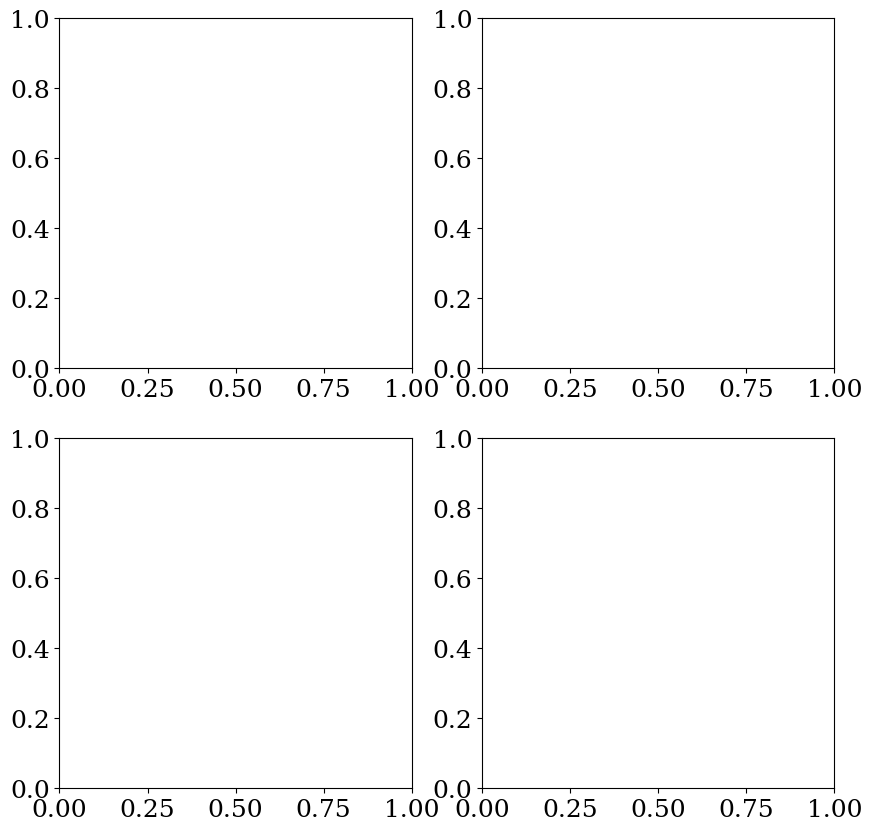

In [31]:
fig, [[ax1,ax2],[ax3, ax4]] = plt.subplots(2, 2, figsize=(10, 10))
delta_rm_resdiuals_comb = (MS_MS_merge_comb_2.RM_src_radm2 - MS_MS_merge_comb_2.deltaRM_radm2) 
sigma_rm_resdiuals_comb = (MS_MS_merge_comb_2.sigma_RM_2 - MS_MS_merge_comb_2.sigmaRM_radm2) 
frac_pol_resdiuals_comb = (MS_MS_merge_comb_2.frac_pol - MS_MS_merge_comb_2.fracPol) 
RM_screen_resdiuals_comb = (MS_MS_merge_comb_2.RM_screen_radm2 - MS_MS_merge_comb_2.RM_radm2) 
psi_residuals = (MS_MS_merge_comb_2.psi0_deg_y - MS_MS_merge_comb_2.psi0_deg_x) 
ln_EVD_cut = 200
ax1.hist(delta_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut], bins=50)
ax1.axvline(x=np.mean(delta_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.mean(delta_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax1.axvline(x=np.median(delta_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(delta_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax1.set_xlabel('Residual$_{{RM_{src}}}$')
ax1.legend()

#AX2 - sigma_RM_FG
ax2.hist(sigma_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut], bins=50)
ax2.axvline(x=np.mean(sigma_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.mean(sigma_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax2.axvline(x=np.median(sigma_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(sigma_rm_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))

ax2.set_xlabel('Residual$_{{\sigma_{src}}}$')
ax2.legend()

#AX3 - frac pol
ax3.hist(frac_pol_resdiuals_comb[abs(frac_pol_resdiuals_comb)<0.3], bins=50)
ax3.axvline(x=np.mean(frac_pol_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.mean(frac_pol_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax3.axvline(x=np.median(frac_pol_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(frac_pol_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax3.set_xlabel('Residual$_{p_{0}}$')
ax3.legend()

#AX4 - RM screen
ax4.hist(RM_screen_resdiuals_comb[abs(RM_screen_resdiuals)<20], bins=50)
ax4.axvline(x=np.mean(RM_screen_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > 3]), color = 'r', label='mean:{}'.format(np.round(np.mean(RM_screen_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax4.axvline(x=np.median(RM_screen_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > 3]), color = 'k', label='median:{}'.format(np.round(np.median(RM_screen_resdiuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
ax4.set_xlabel('Residual$_{RM_{screen}}$')
ax4.legend()
plt.show()

plt.hist(psi_residuals[abs(psi_residuals)<100], bins=50)
plt.axvline(x=np.mean(psi_residuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'r', label='mean:{}'.format(np.round(np.mean(psi_residuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
plt.axvline(x=np.median(psi_residuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), color = 'k', label='median:{}'.format(np.round(np.median(psi_residuals_comb[MS_MS_merge_comb_2['ln(EVIDENCE) '] > ln_EVD_cut]), 2)))
plt.xlabel('Residual$_{\psi_{0}}$')
plt.legend()

plt.show()

# Make the same hexbins as previous

In [ ]:
lnEVD_cut = 200

delta_rm_resdiuals = (MS_MS_merge_comb.RM_src_radm2 - MS_MS_merge_comb.deltaRM_radm2) 
plt.hexbin(MS_MS_merge_comb.sigma_RM_2[MS_MS_merge_comb['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_merge_comb.RM_src_radm2[MS_MS_merge_comb['ln(EVIDENCE) '] > lnEVD_cut],delta_rm_resdiuals[MS_MS_merge_comb['ln(EVIDENCE) '] > lnEVD_cut], gridsize=20,reduce_C_function=np.median, vmin=-50, vmax=50, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{{RM_{src}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.show()

sigma_rm_resdiuals = (MS_MS_merge_comb.sigma_RM_2 - MS_MS_merge_comb.sigmaRM_radm2) 
plt.hexbin(MS_MS_merge_comb.sigma_RM_2[MS_MS_merge_comb['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_merge_comb.RM_src_radm2[MS_MS_merge_comb['ln(EVIDENCE) '] > lnEVD_cut],sigma_rm_resdiuals[MS_MS_merge_comb['ln(EVIDENCE) '] > lnEVD_cut], gridsize=20,reduce_C_function=np.median, vmin=-30, vmax=30, cmap='cmr.guppy' )
plt.colorbar(label='Residual$_{{\sigma_{RM}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.show()

sigma_rm_resdiuals = (MS_MS_merge_comb_2.sigma_RM_2 - MS_MS_merge_comb_2.sigmaRM_radm2) 
med = plt.hexbin(MS_MS_merge_comb_2.sigma_RM_2[MS_MS_merge_comb_2['ln(EVIDENCE) '] > lnEVD_cut], MS_MS_merge_comb_2.RM_src_radm2[MS_MS_merge_comb_2['ln(EVIDENCE) '] > lnEVD_cut], gridsize=20, reduce_C_function=np.sum, cmap='cmr.flamingo' )
plt.colorbar(label='Residual$_{{RM_{src}}}$')
plt.xlabel('$\sigma_{RM}$')
plt.ylabel('$RM_{src}$')
plt.show()

In [32]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')


bottom = plt.get_cmap('cmr.dusk_r', 12)
top= plt.get_cmap('cmr.sapphire', 244)
newcolors = np.vstack((top(np.linspace(0, 1, 244)),
                bottom(np.linspace(0, 0.09, 12))))
newcmp = ListedColormap(newcolors, name='embersaph')

bounds = [-2000,-10, -2.5, -1, 0, 10]
cmap_rb = plt.get_cmap(newcmp)
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)



hex1 = ax_test[0].hexbin(MS_MS_merge_comb_2['RM_src_radm2'],MS_MS_merge_comb_2['SNR'], MS_MS_merge_comb_2['delta_BIC_7_10'],norm=norm, gridsize=20, cmap=cmap, reduce_C_function=np.median)
ax_test[0].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[0].set_ylabel('SNR')




labels = ('-10>', '-5>','-2.5>', '-1>', '0>' ,'0+')
cb2 = plt.colorbar(hex1)
cb2.ax.set_yticklabels(labels)

labels = ('-10>', '-5>','-2.5>', '-1>', '0>' ,'0+')
cb = plt.colorbar(hex2, label='$\Delta$ $BIC_{T,A}$', ticklocation='bottom')
cb.ax.set_yticklabels(labels)
plt.tight_layout()
plt.show()

<>:31: SyntaxWarning:

invalid escape sequence '\D'

<>:31: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1340041361.py:31: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1340041361.py:31: SyntaxWarning:

invalid escape sequence '\D'



NameError: name 'MS_MS_merge_comb_2' is not defined

In [33]:
MS_MS_merge_comb['rm_residual'] = MS_MS_merge_comb.RM_screen_radm2 - MS_MS_merge_comb.RM_radm2
MS_MS_merge_comb['delta_BIC_7_10'] = MS_MS_merge_comb.BIC - MS_MS_merge_comb.BIC
#MS_MS_merge_comb['delta_evd_7_10'] = MS_MS_merge_comb['ln(EVIDENCE) '] - MS_RFG_merge['ln(EVIDENCE) ']
MS_MS_merge_comb['delta_evd_7_10'] = MS_MS_merge_comb['ln(EVIDENCE) '] - MS_RFG_merge_comb['ln(EVIDENCE) ']

#MS_MS_merge_comb['delta_evd_7_10'] = MS_MS_merge_comb['ln(EVIDENCE) '] - MS_RFG_merge['ln(EVIDENCE) ']


NameError: name 'MS_MS_merge_comb' is not defined

<>:24: SyntaxWarning:

invalid escape sequence '\s'

<>:34: SyntaxWarning:

invalid escape sequence '\D'

<>:24: SyntaxWarning:

invalid escape sequence '\s'

<>:34: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/4260139127.py:24: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/4260139127.py:34: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/4260139127.py:24: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/4260139127.py:34: SyntaxWarning:

invalid escape sequence '\D'



NameError: name 'MS_MS_merge_comb' is not defined

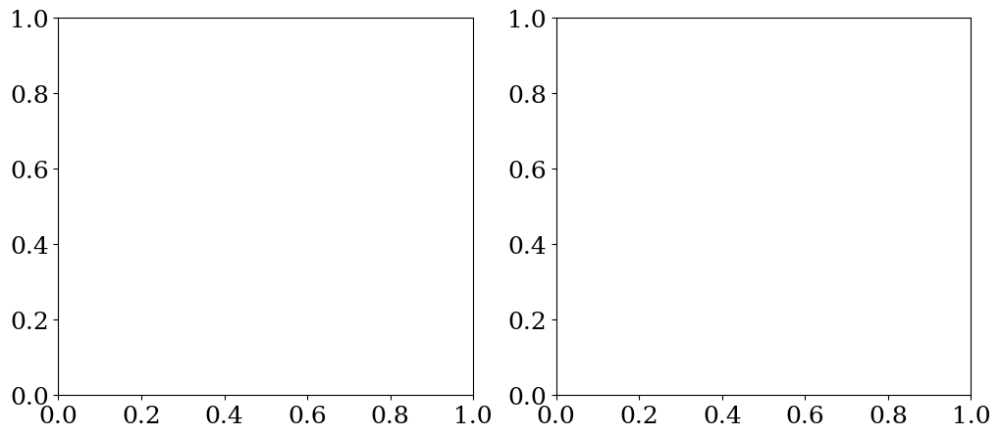

In [34]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5))

bottom = plt.get_cmap('cmr.dusk_r', 12)
top= plt.get_cmap('cmr.sapphire', 244)
newcolors = np.vstack((top(np.linspace(0, 1, 244)),
                bottom(np.linspace(0, 0.09, 12))))
newcmp = ListedColormap(newcolors, name='embersaph')

bounds = [-2000,-10, -2.5, -1, 0, 10]
cmap_rb = plt.get_cmap(newcmp)
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)



hex1 = ax_test[0].hexbin(MS_MS_merge_comb['RM_src_radm2'],MS_MS_merge_comb['SNR'], MS_MS_merge_comb['delta_BIC_7_10'],norm=norm, gridsize=20, cmap=cmap, reduce_C_function=np.median)
ax_test[0].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[0].set_ylabel('SNR')

hex2 = plt.hexbin(MS_MS_merge_comb['psi0_deg_y'], MS_MS_merge_comb['SNR'], MS_MS_merge_comb['delta_BIC_7_10'], gridsize=20, norm=norm, cmap=cmap, reduce_C_function=np.median)
plt.xlabel('$\sigma_{RM}$')
#plt.ylabel(values_interest[y_index])
#ax_test[0].set_title('Slab')


labels = ('-10>', '-5>','-2.5>', '-1>', '0>' ,'0+')
cb2 = plt.colorbar(hex1)
cb2.ax.set_yticklabels(labels)

labels = ('-10>', '-5>','-2.5>', '-1>', '0>' ,'0+')
cb = plt.colorbar(hex2, label='$\Delta$ $BIC_{T,A}$', ticklocation='bottom')
cb.ax.set_yticklabels(labels)
plt.tight_layout()
plt.show()

In [ ]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5))

bounds = [-7000,0, 1, 2.0, 5, 70000000] 
cmap_rb = plt.get_cmap('cmr.ember')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

hex1 = ax_test[0].hexbin(MS_MS_merge_comb['RM_src_radm2'],MS_MS_merge_comb['SNR'], delta_evd_7_10,norm=norm, gridsize=20, cmap=cmap, reduce_C_function=np.nanmedian)
ax_test[0].set_xlabel('$RM_{src}$ rad $m^{-2}$')
ax_test[0].set_ylabel('SNR')

hex2 = plt.hexbin(MS_MS_merge_comb['sigma_RM_2'], MS_MS_merge_comb['SNR'],delta_evd_7_10, gridsize=20, norm=norm, cmap=cmap, reduce_C_function=np.nanmedian)
plt.xlabel('$\sigma_{RM}$')
#plt.ylabel(values_interest[y_index])
#ax_test[0].set_title('Slab')



labels = ('<-1', '0','>1.', '>2.5', '>5' ,'10+')
cb2 = plt.colorbar(hex1)
cb2.ax.set_yticklabels(labels)


labels = ('<-1', '0','>1.', '>2.5', '>5' ,'10+')
cb = plt.colorbar(hex2, label='$ln(\Delta$ $Bayes Factor_{T,A}$)', ticklocation='bottom')
cb.ax.set_yticklabels(labels)
plt.tight_layout()
plt.show()

In [ ]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5))

bounds = [-10,0, 1, 2.0, 4, 7000] 
cmap_rb = plt.get_cmap('cmr.ember')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

hex1 = ax_test[0].hexbin(MS_MS_merge_comb['frac_pol'],MS_MS_merge_comb['SNR'], MS_MS_merge_comb['delta_evd_7_10'],norm=norm, gridsize=20, cmap=cmap, reduce_C_function=np.median)
ax_test[0].set_xlabel('$p_{0}$')
ax_test[0].set_ylabel('SNR')

hex2 = plt.hexbin(MS_MS_merge_comb['psi0_deg_y'], MS_MS_merge_comb['SNR'], MS_MS_merge_comb['delta_evd_7_10'], gridsize=20, norm=norm, cmap=cmap, reduce_C_function=np.median)
plt.xlabel('$\psi_{0}$')
#plt.ylabel(values_interest[y_index])
#ax_test[0].set_title('Slab')

labels = ('<-1', '0','>1.', '>2.5', '>5' ,'10+')
cb2 = plt.colorbar(hex1)
cb2.ax.set_yticklabels(labels)


labels = ('<-1', '0','>1.', '>2.5', '>5' ,'10+')
cb = plt.colorbar(hex2, label='$ln(\Delta$ $Bayes Factor_{T,A}$)', ticklocation='bottom')
cb.ax.set_yticklabels(labels)
plt.tight_layout()
plt.show()

In [ ]:
from matplotlib import gridspec
plt.rc('font'  ,family='serif')

bottom = plt.get_cmap('cmr.dusk_r',  1)
top= plt.get_cmap('cmr.ember' , 255)
newcolors = np.vstack((bottom(np.linspace(0 , 0.9 , 1)), 
                top(np.linspace(0 , 1 , 255))))
newcmp = ListedColormap(newcolors , name='embersaph')

bounds = [-10, 0,  1,  2,  5,  10000000000000000]
cmap_rb = plt.get_cmap(newcmp)
colors = cmap_rb(np.linspace(0 , 1 , len(bounds) - 1))
cmap , norm = mcolors.from_levels_and_colors(bounds , colors)


snr_cut= 8

hex1 = plt.hexbin(MS_MS_merge_b1['sigma_RM_2'][(MS_MS_merge_b1.SNR > snr_cut)& (MS_MS_merge_b1['sigma_RM_2']<50)], MS_MS_merge_b1['RM_src_radm2'][(MS_MS_merge_b1.SNR > snr_cut) & (MS_MS_merge_b1['sigma_RM_2']<50)], MS_MS_merge_b1['delta_evd_7_10'][(MS_MS_merge_b1.SNR > snr_cut) & (MS_MS_merge_b1['sigma_RM_2']<50)], reduce_C_function=np.nanmedian, gridsize=20, norm=norm, cmap=cmap)
plt.xlabel('$\sigma_{RM}$ [rad m$^{-2}]$')
plt.ylabel('$RM_{src}$ [rad m$^{-2}]$')
labels = ('-5', '0','1.', '2.', '5' ,'1000')
cb1 = plt.colorbar(hex1, label='ln(BF)$_{T-slab,T-Screen}$')
cb1.ax.set_yticklabels(labels)
plt.tight_layout()
plt.savefig('append_MS_RFG_b1.pdf', format='pdf')


In [35]:
plt.hexbin(MS_MS_merge_comb['sigma_RM_2'][MS_MS_merge_comb['sigma_RM_2']<40], MS_MS_merge_comb['RM_src_radm2'][MS_MS_merge_comb['sigma_RM_2']<40], gridsize=20, vmax=10 , reduce_C_function=np.sum, cmap='cmr.bubblegum')
#ax_test[0].set_xlabel('$\sigma_{RM}$ rad $m^{-2}$')
ax_test[0].set_ylabel('$RM_{src}$ rad $m^{-2}$')
plt.colorbar()

NameError: name 'MS_MS_merge_comb' is not defined

In [36]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')


bounds = [-2000,-500, -100, -5, 0, 10]
cmap_rb = plt.get_cmap('cmr.sapphire')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)


plt.hexbin(MS_MS_merge_comb_2['sigmaRM_radm2'],MS_MS_merge_comb_2['RM_src_radm2'], MS_MS_band1_merge['delta_BIC_7_10'], reduce_C_function=np.nanmedian, gridsize=20, cmap='cmr.lavender')
plt.ylabel('$RM_{src}$ rad $m^{-2}$')
plt.xlabel('$\sigma_{RM}$ radm-2')
#ax_test[0].set_title('Slab')

#labels = (' ','S', 'M', 'W', 'IC' ,'IM')
cb = plt.colorbar(label='% Correct Selections BIC', ticklocation='bottom')
#cb.ax.set_yticklabels(labels)
plt.show()

<>:14: SyntaxWarning:

invalid escape sequence '\s'

<>:14: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/719183838.py:14: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/719183838.py:14: SyntaxWarning:

invalid escape sequence '\s'



NameError: name 'MS_MS_merge_comb_2' is not defined

In [37]:
plt.plot(MS_MS_merge_comb_2['SNR'], MS_MS_merge_comb_2['rm_residual'], '.')
plt.ylim(-10,10)


NameError: name 'MS_MS_merge_comb_2' is not defined

In [38]:

bottom = plt.get_cmap('cmr.dusk_r', 43)
top= plt.get_cmap('cmr.sapphire', 253)
newcolors = np.vstack((top(np.linspace(0, 1, 253)),
                bottom(np.linspace(0, 0.09, 3))))
newcmp = ListedColormap(newcolors, name='embersaph')

plt.rcParams.update({'font.size': 18})
print(MS_MS_merge_comb_2.keys())
plt.hexbin(MS_MS_merge_comb_2['RM_src_radm2'], MS_MS_merge_comb_2['SNR'], MS_MS_merge_comb_2['delta_BIC_7_10'],gridsize=20, vmin=-2000, cmap=newcmp)
plt.colorbar(label='$\Delta BIC_{7,10}$')
plt.title('Mixed Slab vs Random FG')
plt.ylabel('SNR')
plt.xlabel('RM_src_radm2')

<>:10: SyntaxWarning:

invalid escape sequence '\D'

<>:10: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3708655066.py:10: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3708655066.py:10: SyntaxWarning:

invalid escape sequence '\D'



NameError: name 'MS_MS_merge_comb_2' is not defined

In [39]:
plt.rcParams.update({'font.size': 18})
print(MS_MS_merge_comb_2.keys())

bounds = [-10,0, 1, 2.5, 5, 6000]
cmap_rb = plt.get_cmap('cmr.sapphire')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

#bottom = plt.get_cmap('cmr.dusk_r', 8)
#top= plt.get_cmap('cmr.sapphire', 248)
#newcolors = np.vstack((bottom(np.linspace(0, 0.09,8)), top(np.linspace(0, 1, 248))))
#newcmp = ListedColormap(newcolors, name='embersaph')
#print(np.min(MS_MS_band1_merge['Bayes_factor_7_10']))

plt.hexbin(MS_MS_merge_comb_2['RM_src_radm2'], MS_MS_merge_comb_2['SNR'], MS_MS_merge_comb_2['delta_evd_7_10'],gridsize=20,norm=norm, cmap=cmap)
labels = (' ', 'selected 10', 'inconclusive', 'weak', 'moderate', 'strong 7')
plt.colorbar(label='ln(EVIDENCE) ')
cb.ax.set_yticklabels(labels)
plt.title('Mixed Slab vs Random FG')
plt.ylabel('SNR')
plt.xlabel('RM_src_radm2')

NameError: name 'MS_MS_merge_comb_2' is not defined

In [40]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')

MS_MS_merge_comb_2['angle_residual'] = (MS_MS_merge_comb_2.psi0_deg_y - MS_RFG_merge.psi0_deg_x) / MS_RFG_merge.psi0_deg_plus_err
cmap_name = 'cmr.watermelon'

hex1 = plt.hexbin(MS_MS_merge_comb_2['sigma_RM_2'], MS_MS_merge_comb_2['RM_src_radm2'], MS_MS_merge_comb_2['delta_evd_7_10'],gridsize=20, cmap=cmap_name,reduce_C_function=np.median)
plt.xlabel('$RM_{src}$ rad $m^{-2}$')
plt.ylabel(values_interest[y_index])
plt.colorbar(hex1, label='$\Psi_{0}$residual')

plt.show()

<>:11: SyntaxWarning:

invalid escape sequence '\P'

<>:11: SyntaxWarning:

invalid escape sequence '\P'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1893078313.py:11: SyntaxWarning:

invalid escape sequence '\P'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1893078313.py:11: SyntaxWarning:

invalid escape sequence '\P'



NameError: name 'MS_MS_merge_comb_2' is not defined

# Now for the opposite

# Import the Random Screen Data

In [41]:
#Band 1

RFG_MS_10000_comb_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/comb_RFG_condensed_sim7_model_num_10000_sims.csv')
RFG_RFG_10000_comb_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/comb_RFG_condensed_sim2_model_num_10000_sims.csv')
RFG_comb_true = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/unif_screen_lin_fg_number_10000_freq_800_1089_SNR_comb.csv')

RFG_comb_true.rename(columns={'Unnamed: 0':'src'}, inplace=True)

RFG_MS_10000_comb_df['src'] = RFG_MS_10000_comb_df['src'] - 1               
RFG_RFG_10000_comb_df['src'] = RFG_RFG_10000_comb_df['src'] - 1        

RFG_MS_comb_merge = pd.merge(RFG_MS_10000_comb_df, RFG_comb_true, on='src', how='outer')
RFG_RFG_comb_merge = pd.merge(RFG_RFG_10000_comb_df, RFG_comb_true, on='src', how='outer')



# Combined Data

In [42]:
RFG_MS_comb_merge['Bayes_factor_10_7'] = RFG_RFG_comb_merge['ln(EVIDENCE) '] - RFG_MS_comb_merge['ln(EVIDENCE) ']
RFG_RFG_comb_merge['delta_BIC_10_7'] = RFG_RFG_comb_merge.BIC - RFG_MS_comb_merge.BIC
print(RFG_RFG_comb_merge.keys())


Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'sigmaRM_radm2', 'fracPol_plus_err', 'psi0_deg_plus_err',
       'RM_radm2_plus_err', 'sigmaRM_radm2_plus_err', 'fracPol_minus_err',
       'psi0_deg_minus_err', 'RM_radm2_minus_err', 'sigmaRM_radm2_minus_err',
       'fracPol_bounds', 'psi0_deg_bounds', 'RM_radm2_bounds',
       'sigmaRM_radm2_bounds', 'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC',
       'ln(EVIDENCE) ', 'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y',
       'psi0_2_deg', 'RM_screen_radm2', 'RM_screen_2_radm2', 'RM_src_radm2',
       'sigma_RM_2', 'sigmaRM_FG', 'frac_pol_2_comp', 'SNR', 'model',
       'frac_pol_seed', 'RM_screen_seed', 'RM_source_seed', 'sigmaRM_seed',
       'sigma_FG_seed', 'psi0_seed', 'delta_BIC_10_7'],
      dtype='object')


<>:7: SyntaxWarning:

invalid escape sequence '\s'

<>:7: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/4216707890.py:7: SyntaxWarning:

invalid escape sequence '\s'



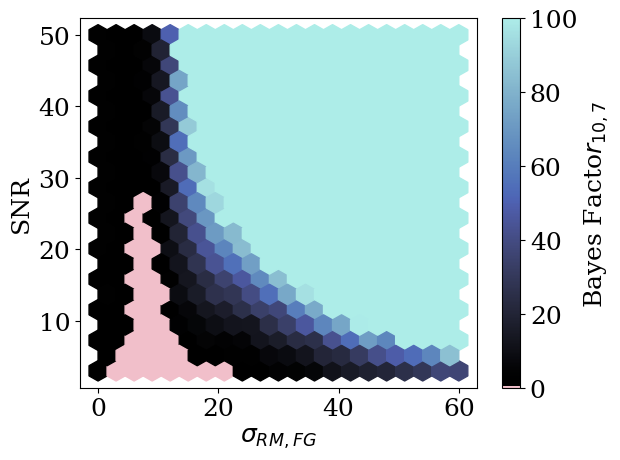

In [43]:
bottom = plt.get_cmap('cmr.dusk_r', 1)
top= plt.get_cmap('cmr.sapphire', 255)
newcolors = np.vstack((bottom(np.linspace(0, 0.09,1)), top(np.linspace(0, 1, 255))))
newcmp = ListedColormap(newcolors, name='embersaph')

plt.hexbin(RFG_MS_comb_merge['sigma_RM_2'], RFG_MS_comb_merge['SNR'], RFG_MS_comb_merge['Bayes_factor_10_7'], vmin=0, vmax=100, gridsize=20, cmap=newcmp)
plt.xlabel('$\sigma_{RM, FG}$')
plt.ylabel('SNR')
plt.colorbar(label='Bayes Facto$r_{10,7}$')

<>:10: SyntaxWarning:

invalid escape sequence '\D'

<>:10: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2905134529.py:10: SyntaxWarning:

invalid escape sequence '\D'



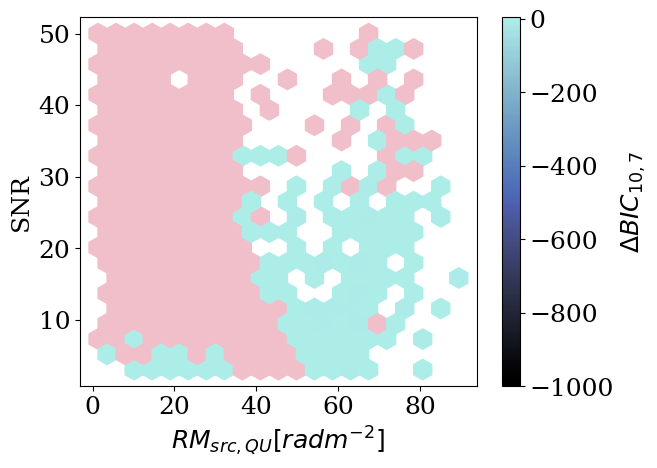

In [44]:
bottom_low = plt.get_cmap('cmr.dusk_r', 1)
top_low = plt.get_cmap('cmr.sapphire', 255)
newcolors_low = np.vstack((top_low(np.linspace(0, 1, 255)),
                bottom_low(np.linspace(0, 0.09, 1))))
newcmp_low = ListedColormap(newcolors_low, name='embersaph')

plt.hexbin(RFG_MS_comb_merge['deltaRM_radm2'], RFG_MS_comb_merge['SNR'], RFG_MS_comb_merge['Bayes_factor_10_7'], vmax=5, vmin=-1000,gridsize=20, cmap=newcmp_low)
plt.xlabel('$RM_{src, QU} [rad m^{-2}]$')
plt.ylabel('SNR')
plt.colorbar(label='$\Delta BIC_{10,7}$')

In [45]:
from matplotlib.colors import ListedColormap

bottom_low = plt.get_cmap('cmr.dusk_r', 1)
top_low = plt.get_cmap('cmr.sapphire', 255)
newcolors_low = np.vstack((top_low(np.linspace(0, 1, 255)),
                bottom_low(np.linspace(0, 0.09, 1))))
newcmp_low = ListedColormap(newcolors_low, name='embersaph')

plt.hexbin(RFG_MS_band1_merge['deltaRM_radm2'], RFG_RFG_band1_merge['SNR'], RFG_RFG_band1_merge['delta_BIC_10_7'], gridsize=20, cmap=newcmp_low)
plt.xlabel('$RM_{src, QU} [rad m^{-2}]$')
plt.ylabel('SNR')
plt.colorbar(label='$\Delta BIC_{10,7}$')

<>:12: SyntaxWarning:

invalid escape sequence '\D'

<>:12: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2046176593.py:12: SyntaxWarning:

invalid escape sequence '\D'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2046176593.py:12: SyntaxWarning:

invalid escape sequence '\D'



NameError: name 'RFG_MS_band1_merge' is not defined

# Counts for the bins

In [ ]:
from matplotlib import gridspec
plt.rcParams.update({'font.size': 18})
plt.rc('font', family='serif')
fig_chi, ax_test = plt.subplots(nrows=1, ncols=2, figsize=(12,5), sharex=True)



print(len(MS_MS_band1_merge))
hex2= ax_test[1].hexbin(MS_MS_band1_merge['sigmaRM_radm2'],MS_MS_band1_merge['SNR'],reduce_C_function=np.sum, gridsize=20, cmap='cmr.flamingo')
ax_test[1].set_xlabel('$p_{0}$')
ax_test[0].set_ylabel('SNR')

hex1 = ax_test[0].hexbin(RFG_MS_band1_merge['frac_pol'],RFG_MS_band1_merge['SNR'], reduce_C_function=np.sum, gridsize=20, cmap='cmr.flamingo')
ax_test[0].set_xlabel('$p_{0}$')


cb2 = plt.colorbar(hex2, label='Counts')
cb = plt.colorbar(hex1)

plt.tight_layout()
plt.show()

# ABCD PLots

In [ ]:
def mixedslabs_modelling(lambda_sq,  RM_screen, frac_pol, RM_src, psi0_deg, sigma_RM_2):

    para_S = (2. * lambda_sq**2 * sigma_RM_2**2 - 2j * lambda_sq * RM_src) 
    quarr = (frac_pol * np.exp( 2j * (np.radians(psi0_deg) + RM_screen * lambda_sq)) * (1 - np.exp(-1.*para_S)) / para_S)
      
    quarr_LoS = np.abs(quarr) 

    complex_p = []
    for qu in quarr_LoS:
        complex_p.append(np.sqrt(qu.real**2 + qu.imag**2))

    return quarr_LoS

NameError: name 'mixedslabs_modelling' is not defined

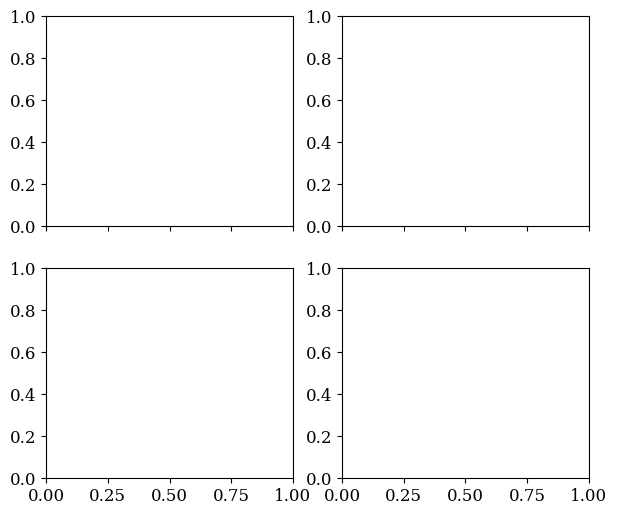

In [46]:
#MID SNR AND LOW RM_SRC
plt.rcParams.update({'font.size': 12})
plt.rc('font', family='serif')
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, sharex=True, figsize=(7, 6))
import numpy as np
c = 299792458.

frac_pol = 0.073724776
psi0_deg = 171.3361259610533
RM_screen = 941.1524514101545
sigma_RM = 2.1913073427860525
RM_src = 5.811

data_842 = np.genfromtxt('/Users/loberhel/Desktop/Project_2_Data/mixedslab_unif_fg_10000_b1/842.dat', names=True, dtype=None, delimiter=' ')

freq_arr = []
q_arr = []
u_arr = []

for row in data_842:
    freq_arr.append(row[0])
    q_arr.append(row[1])
    u_arr.append(row[2])


freq_arr=np.asarray(freq_arr)
lambda_sqr_array = np.power(c/freq_arr, 2.0)
quarr_LOS_842= mixedslabs_modelling(lambda_sqr_array, RM_screen, frac_pol, RM_src, psi0_deg, sigma_RM)



#plt.scatter(lambda_sqr_array, q_arr, marker='.', c='b')
ax1.plot(lambda_sqr_array, q_arr, c='b')
#plt.scatter(lambda_sqr_array, u_arr, marker='.', c='r')
ax1.plot(lambda_sqr_array, u_arr, c='r')
ax1.plot(lambda_sqr_array, quarr_LOS_842, c='k')

#B
frac_pol_2 = 0.27268568671651416
psi0_deg_2 = 49.89031398499003
RM_screen_2 = 950.772515850856
sigma_RM_2 = 17.480280907032828
RM_src_2 = 8.192230068757299 

data_215 = np.genfromtxt('/Users/loberhel/Desktop/Project_2_Data/mixedslab_unif_fg_10000_b1/215.dat', names=True, dtype=None, delimiter=' ')

freq_arr = []
q_arr = []
u_arr = []

for row in data_215:
    freq_arr.append(row[0])
    q_arr.append(row[1])
    u_arr.append(row[2])


freq_arr=np.asarray(freq_arr)
lambda_sqr_array = np.power(c/freq_arr, 2.0)
quarr_LOS_215= mixedslabs_modelling(lambda_sqr_array, RM_screen_2, frac_pol_2, RM_src_2, psi0_deg_2, sigma_RM_2)



#plt.scatter(lambda_sqr_array, q_arr, marker='.', c='b')
ax2.plot(lambda_sqr_array, q_arr, c='b')
#plt.scatter(lambda_sqr_array, u_arr, marker='.', c='r')
ax2.plot(lambda_sqr_array, u_arr, c='r')
ax2.plot(lambda_sqr_array, quarr_LOS_215, c='k')



frac_pol_3 = 0.23913802366688278
psi0_deg_3 = 39.747121288106534
RM_screen_3 = 104.32693071011386
sigma_RM_3  = 19.925221155054572
RM_src_3 = 67.90730199136485

data_6647 = np.genfromtxt('/Users/loberhel/Desktop/Project_2_Data/mixedslab_unif_fg_10000_b1/6647.dat', names=True, dtype=None, delimiter=' ')

freq_arr = []
q_arr = []
u_arr = []

for row in data_6647:
    freq_arr.append(row[0])
    q_arr.append(row[1])
    u_arr.append(row[2])


freq_arr=np.asarray(freq_arr)
lambda_sqr_array = np.power(c/freq_arr, 2.0)
quarr_LOS_6647= mixedslabs_modelling(lambda_sqr_array, RM_screen_3, frac_pol_3, RM_src_3, psi0_deg_3, sigma_RM_3)



#plt.scatter(lambda_sqr_array, q_arr, marker='.', c='b')
ax3.plot(lambda_sqr_array, q_arr, c='b')
#plt.scatter(lambda_sqr_array, u_arr, marker='.', c='r')
ax3.plot(lambda_sqr_array, u_arr, c='r')
ax3.plot(lambda_sqr_array, quarr_LOS_6647, c='k')

#D

frac_pol_4 = 0.2713132630364347
psi0_deg_4 = 115.64645140632527
RM_screen_4 = 1014.8297487537152
sigma_RM_4 = 14.420270350643852
RM_src_4 = 78.82252321882231

data_2615 = np.genfromtxt('/Users/loberhel/Desktop/Project_2_Data/mixedslab_unif_fg_10000_b1/2615.dat', names=True, dtype=None, delimiter=' ')

freq_arr = []
q_arr = []
u_arr = []

for row in data_2615:
    freq_arr.append(row[0])
    q_arr.append(row[1])
    u_arr.append(row[2])


freq_arr=np.asarray(freq_arr)
lambda_sqr_array = np.power(c/freq_arr, 2.0)
quarr_LOS_2615= mixedslabs_modelling(lambda_sqr_array, RM_screen_4, frac_pol_4, RM_src_4, psi0_deg_4, sigma_RM_4)



#plt.scatter(lambda_sqr_array, q_arr, marker='.', c='b')
ax4.plot(lambda_sqr_array, q_arr, c='b')
#plt.scatter(lambda_sqr_array, u_arr, marker='.', c='r')
ax4.plot(lambda_sqr_array, u_arr, c='r')
ax4.plot(lambda_sqr_array, quarr_LOS_2615, c='k')


plt.tight_layout()
plt.show()




In [ ]:
c = 299792458.

f


## Testing the Accuracy of the QU fitting with M7

In [ ]:
MS_MS_5000_band1_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/band1/b1_condensed_simMS_model_num_7_sims.csv')
MS_band1_true = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/mixed_slab_random_screen/band1/mixedslab_unif_fg_number_10000_freq_800_1089_SNR_band1.csv')

MS_band1_true.rename(columns={'Unnamed: 0':'src'}, inplace=True)

MS_MS_5000_band1_df['src'] = MS_MS_5000_band1_df['src'] - 1               
MS_MS_band1_merge = pd.merge(MS_MS_5000_band1_df, MS_band1_true, on='src', how='inner')

print(len(MS_MS_band1_merge))

In [ ]:
MS_MS_band1_merge['p_residual'] = (MS_MS_band1_merge.frac_pol - MS_MS_band1_merge.fracPol)
MS_MS_band1_merge['psi_residual'] = (MS_MS_band1_merge.psi0_deg_y - MS_MS_band1_merge.psi0_deg_x)
MS_MS_band1_merge['rm_src_residual'] = (MS_MS_band1_merge.RM_src_radm2 - MS_MS_band1_merge.deltaRM_radm2)
MS_MS_band1_merge['rm_scr_residual'] = (MS_MS_band1_merge.RM_screen_radm2 - MS_MS_band1_merge.RM_radm2)
MS_MS_band1_merge['sigma_residual'] = (MS_MS_band1_merge.sigma_RM_2 - MS_MS_band1_merge.sigmaRM_radm2) /MS_MS_band1_merge.sigmaRM_radm2_plus_err 

In [ ]:
plt.hexbin(MS_MS_band1_merge.RM_src_radm2, MS_MS_band1_merge['sigma_residual'], gridsize=40)
plt.colorbar()

In [ ]:
plt.scatter(MS_MS_band1_merge.p_residual, MS_MS_band1_merge['fracPol_plus_err'])

In [ ]:
x = [0.0, -0.3]
y= [0.0, 0.3]
number_source_below_1sig = np.sum(1 > (MS_MS_band1_merge.p_residual/MS_MS_band1_merge['fracPol_plus_err'])) / len(MS_MS_band1_merge.p_residual) * 100

print(number_source_below_1sig)
plt.hexbin(MS_MS_band1_merge.p_residual[(MS_MS_band1_merge['fracPol_plus_err']<0.3) &(MS_MS_band1_merge['p_residual']>-0.3)], MS_MS_band1_merge['fracPol_plus_err'][(MS_MS_band1_merge['fracPol_plus_err']<0.3) &(MS_MS_band1_merge['p_residual']>-0.3)], gridsize=40)
plt.plot(x, y)
plt.xlabel('frac polarization residual')
plt.ylabel('frac pol error')
plt.colorbar(label='counts')

In [ ]:
x = [0.0, -0.1, -0.2,-0.3, -0.4, -0.5, -0.6]
y= [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
plt.hexbin(MS_MS_band1_merge.psi_residual, MS_MS_band1_merge['psi0_deg_plus_err'], gridsize=30, vmax=150)
plt.plot(x, y)
plt.xlabel('psi residual')
plt.ylabel('psi error')
plt.colorbar(label='counts')




In [ ]:
x = [0.0, -0.1, -0.2,-0.3, -0.4, -0.5, -0.6]
y= [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
plt.hexbin(MS_MS_band1_merge.rm_scr_residual, MS_MS_band1_merge['RM_radm2_plus_err'], gridsize=30, vmax=50)
plt.plot(x, y)
plt.xlabel('RM screen residual')
plt.ylabel('RM error')
plt.colorbar(label='counts')

In [ ]:
x = [0.0, -0.1, -0.2,-0.3, -0.4, -0.5, -0.6]
y= [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
plt.hexbin(MS_MS_band1_merge.sigma_residual, MS_MS_band1_merge['sigmaRM_radm2_plus_err'], gridsize=30)
plt.plot(x, y)
plt.xlabel('RM screen residual')
plt.ylabel('RM error')
plt.colorbar(label='counts')

# Need to make a final plot that shows how combined band adds to the accuracy

In [47]:
#Make a function to calculate the median binned by true sigma RM
def calculate_mean_and_med(dataframe, upper, lower, resdiual):

    mean = np.nanmean(resdiual[(dataframe.sigma_RM_2 < upper) & (dataframe.sigma_RM_2 > lower) & (dataframe['ln(EVIDENCE) '] > 200)])
    median = np.nanmedian(resdiual[(dataframe.sigma_RM_2 < upper) & (dataframe.sigma_RM_2 > lower) &(dataframe['ln(EVIDENCE) '] > 200)])

    
    return mean, median

In [48]:
delta_rm_resdiuals = (MS_MS_band1_merge_10000.RM_src_radm2 - MS_MS_band1_merge_10000.deltaRM_radm2) 
sigma_rm_resdiuals = (MS_MS_band1_merge_10000.sigma_RM_2 - MS_MS_band1_merge_10000.sigmaRM_radm2) 
frac_pol_resdiuals = (MS_MS_band1_merge_10000.frac_pol - MS_MS_band1_merge_10000.fracPol) 
RM_screen_resdiuals = (MS_MS_band1_merge_10000.RM_screen_radm2 - MS_MS_band1_merge_10000.RM_radm2) 
psi_residuals = (MS_MS_band1_merge_10000.psi0_deg_y - MS_MS_band1_merge_10000.psi0_deg_x) 

delta_rm_resdiuals_comb = (MS_MS_merge_comb_2_comb.RM_src_radm2 - MS_MS_merge_comb_2_comb.deltaRM_radm2) 
sigma_rm_resdiuals_comb = (MS_MS_merge_comb_2_comb.sigma_RM_2 - MS_MS_merge_comb_2_comb.sigmaRM_radm2) 
frac_pol_resdiuals_comb = (MS_MS_merge_comb_2_comb.frac_pol - MS_MS_merge_comb_2_comb.fracPol) 
RM_screen_resdiuals_comb = (MS_MS_merge_comb_2_comb.RM_screen_radm2 - MS_MS_merge_comb_2_comb.RM_radm2) 
psi_residuals_comb = (MS_MS_merge_comb_2_comb.psi0_deg_y - MS_MS_merge_comb_2_comb.psi0_deg_x) 

sigma_upp = np.arange(10,100,10)
sigma_low =  np.arange(0,90,10)

means_comb = []
med_comb = []

med_b1_bad = []
mean_b1_bad = []

for i in range(len(sigma_upp)):

    mean, median  = calculate_mean_and_med(MS_MS_merge_comb_2, sigma_upp[i], sigma_low[i], RM_screen_resdiuals_comb)
    mean_b1, median_b1  = calculate_mean_and_med(MS_MS_band1_merge_10000, sigma_upp[i], sigma_low[i], RM_screen_resdiuals)

    means_comb.append(mean)
    med_comb.append(median)

    med_b1_bad.append(median_b1)
    mean_b1_bad.append(mean_b1)

means_comb = np.asarray(means_comb)
mean_b1_bad = np.asarray(mean_b1_bad)

diff_meann= (abs(means_comb - mean_b1_bad) / abs(mean_b1_bad)) * 100
print(diff_meann)

plt.plot(sigma_upp, med_comb, color='green')
plt.plot(sigma_upp, med_b1_bad, color='blue')

NameError: name 'MS_MS_merge_comb_2_comb' is not defined

# Lets find out if the errors are significantly improves with the addition of the c

In [49]:
print(MS_MS_band1_merge_10000.keys())
print(MS_MS_merge_comb_2.keys())

Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'deltaRM_radm2', 'sigmaRM_radm2', 'fracPol_plus_err',
       'psi0_deg_plus_err', 'RM_radm2_plus_err', 'deltaRM_radm2_plus_err',
       'sigmaRM_radm2_plus_err', 'fracPol_minus_err', 'psi0_deg_minus_err',
       'RM_radm2_minus_err', 'deltaRM_radm2_minus_err',
       'sigmaRM_radm2_minus_err', 'fracPol_bounds', 'psi0_deg_bounds',
       'RM_radm2_bounds', 'deltaRM_radm2_bounds', 'sigmaRM_radm2_bounds',
       'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC', 'ln(EVIDENCE) ',
       'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y', 'psi0_2_deg',
       'RM_screen_radm2', 'RM_screen_2_radm2', 'RM_src_radm2', 'sigma_RM_2',
       'sigmaRM_FG', 'frac_pol_2_comp', 'SNR', 'model', 'frac_pol_seed',
       'RM_screen_seed', 'RM_source_seed', 'sigmaRM_seed', 'sigma_FG_seed',
       'psi0_seed'],
      dtype='object')


NameError: name 'MS_MS_merge_comb_2' is not defined

# Random Foreground Screen

# Band 1

In [50]:
#Band 1
RFG_MS_10000_b1_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/b1_RFG_condensed_sim7_model_num_10000_sims.csv')
RFG_RFG_10000_b1_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/b1_RFG_condensed_sim2_model_num_10000_sims.csv')
RFG_b1_true = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/unif_screen_lin_fg_number_10000_freq_800_1089_SNR_band1.csv')

RFG_b1_true.rename(columns={'Unnamed: 0':'src'}, inplace=True)


RFG_MS_10000_b1_df['src'] = RFG_MS_10000_b1_df['src'] - 1               
RFG_RFG_10000_b1_df['src'] = RFG_RFG_10000_b1_df['src'] - 1        

RFG_MS_b1_merge = pd.merge(RFG_MS_10000_b1_df, RFG_b1_true, on='src', how='outer')
RFG_RFG_b1_merge = pd.merge(RFG_RFG_10000_b1_df, RFG_b1_true, on='src', how='outer')

print(RFG_MS_b1_merge.keys())
print(len(RFG_MS_10000_b1_df))

RFG_RFG_b1_merge['evd_2_7'] = RFG_RFG_b1_merge['ln(EVIDENCE) '] - RFG_MS_b1_merge['ln(EVIDENCE) ']
RFG_MS_b1_merge['evd_2_7'] = RFG_RFG_b1_merge['ln(EVIDENCE) '] - RFG_MS_b1_merge['ln(EVIDENCE) ']

RM_residb1 = RFG_RFG_b1_merge.frac_pol - RFG_RFG_b1_merge.fracPol


Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'deltaRM_radm2', 'sigmaRM_radm2', 'fracPol_plus_err',
       'psi0_deg_plus_err', 'RM_radm2_plus_err', 'deltaRM_radm2_plus_err',
       'sigmaRM_radm2_plus_err', 'fracPol_minus_err', 'psi0_deg_minus_err',
       'RM_radm2_minus_err', 'deltaRM_radm2_minus_err',
       'sigmaRM_radm2_minus_err', 'fracPol_bounds', 'psi0_deg_bounds',
       'RM_radm2_bounds', 'deltaRM_radm2_bounds', 'sigmaRM_radm2_bounds',
       'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC', 'ln(EVIDENCE) ',
       'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y', 'psi0_2_deg',
       'RM_screen_radm2', 'RM_screen_2_radm2', 'RM_src_radm2', 'sigma_RM_2',
       'sigmaRM_FG', 'frac_pol_2_comp', 'SNR', 'model', 'frac_pol_seed',
       'RM_screen_seed', 'RM_source_seed', 'sigmaRM_seed', 'sigma_FG_seed',
       'psi0_seed'],
      dtype='object')
9727


# Combined Bands

In [51]:
#Combined
RFG_MS_10000_comb_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/comb_RFG_condensed_sim7_model_num_10000_sims.csv')
RFG_RFG_10000_comb_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/comb_RFG_condensed_sim2_model_num_10000_sims.csv')
RFG_comb_true = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/unif_screen_lin_fg_number_10000_freq_800_1089_SNR_comb.csv')

RFG_comb_true.rename(columns={'Unnamed: 0':'src'}, inplace=True)

RFG_MS_10000_comb_df['src'] = RFG_MS_10000_comb_df['src'] - 1               
RFG_RFG_10000_comb_df['src'] = RFG_RFG_10000_comb_df['src'] - 1        

RFG_MS_comb_merge = pd.merge(RFG_MS_10000_comb_df, RFG_comb_true, on='src', how='outer')
RFG_RFG_comb_merge = pd.merge(RFG_RFG_10000_comb_df, RFG_comb_true, on='src', how='outer')

print(RFG_RFG_comb_merge.keys())
print(len(RFG_RFG_comb_merge))
evd_2_7_comb = RFG_RFG_comb_merge['ln(EVIDENCE) '] - RFG_MS_comb_merge['ln(EVIDENCE) ']
RM_resid = RFG_RFG_comb_merge.frac_pol - RFG_MS_comb_merge.fracPol


Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'sigmaRM_radm2', 'fracPol_plus_err', 'psi0_deg_plus_err',
       'RM_radm2_plus_err', 'sigmaRM_radm2_plus_err', 'fracPol_minus_err',
       'psi0_deg_minus_err', 'RM_radm2_minus_err', 'sigmaRM_radm2_minus_err',
       'fracPol_bounds', 'psi0_deg_bounds', 'RM_radm2_bounds',
       'sigmaRM_radm2_bounds', 'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC',
       'ln(EVIDENCE) ', 'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y',
       'psi0_2_deg', 'RM_screen_radm2', 'RM_screen_2_radm2', 'RM_src_radm2',
       'sigma_RM_2', 'sigmaRM_FG', 'frac_pol_2_comp', 'SNR', 'model',
       'frac_pol_seed', 'RM_screen_seed', 'RM_source_seed', 'sigmaRM_seed',
       'sigma_FG_seed', 'psi0_seed'],
      dtype='object')
10000


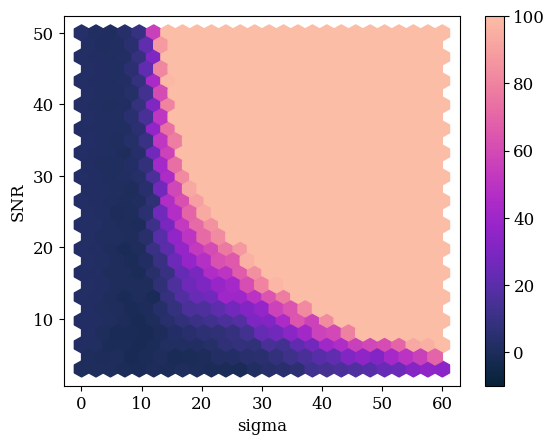

Text(0, 0.5, 'SNR')

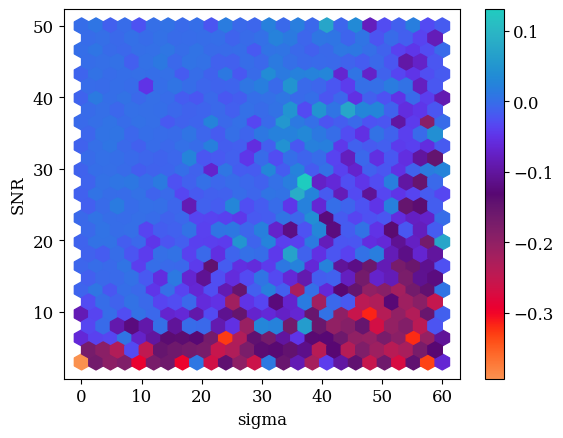

In [52]:
plt.hexbin(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.SNR, evd_2_7_comb, gridsize=25,reduce_C_function=np.median, cmap='cmr.bubblegum', vmin=-10, vmax=100)
plt.colorbar()
plt.xlabel('sigma')
plt.ylabel('SNR')
plt.show()

plt.hexbin(RFG_RFG_b1_merge.sigma_RM_2, RFG_RFG_b1_merge.SNR, RM_residb1, gridsize=25,reduce_C_function=np.median, cmap='cmr.guppy')
plt.colorbar()
plt.xlabel('sigma')
plt.ylabel('SNR')

# Look at each of the parameters and S:N Band 1

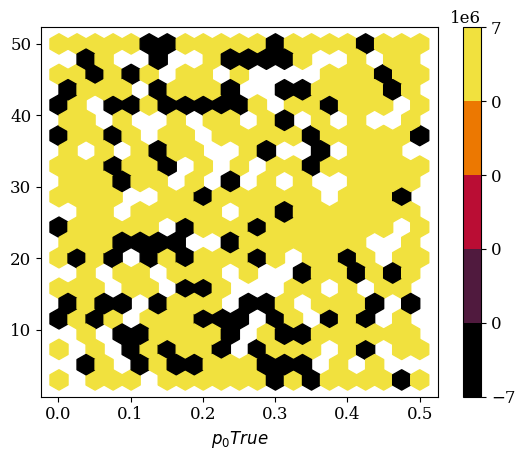

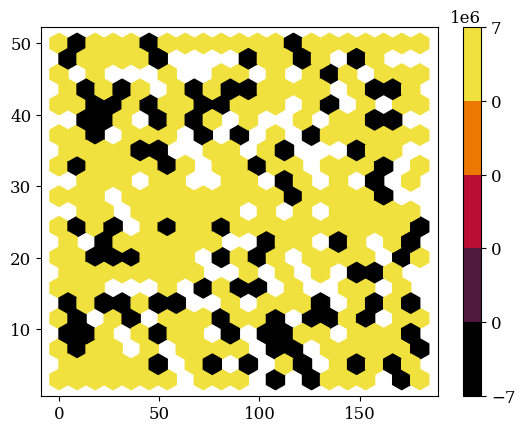

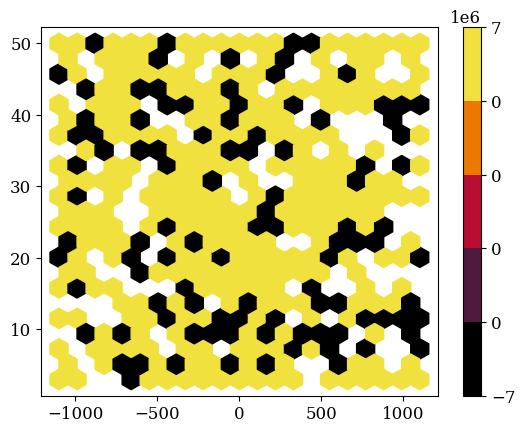

In [53]:
bounds = [-7000000, 0.0, 1.0, 2.0, 5, 7000000] 
cmap_rb = plt.get_cmap('cmr.ember')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

plt.hexbin(RFG_RFG_b1_merge.frac_pol, RFG_RFG_b1_merge.SNR, RFG_RFG_b1_merge['evd_2_7'], reduce_C_function=np.nanmean, gridsize=20, cmap=cmap, norm=norm)
plt.colorbar()
plt.xlabel('$p_{0} True$')
plt.show()


plt.hexbin(RFG_RFG_b1_merge.psi0_deg_y, RFG_RFG_b1_merge.SNR, RFG_RFG_b1_merge['evd_2_7'], reduce_C_function=np.nanmean, gridsize=20, cmap=cmap, norm=norm)
plt.colorbar()
plt.show()


plt.hexbin(RFG_RFG_b1_merge.RM_screen_radm2, RFG_RFG_b1_merge.SNR, RFG_RFG_b1_merge['evd_2_7'], reduce_C_function=np.nanmean, gridsize=20, cmap=cmap, norm=norm)
plt.colorbar()
plt.show()




# Combined Band


<>:8: SyntaxWarning:

invalid escape sequence '\s'

<>:8: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/1283100914.py:8: SyntaxWarning:

invalid escape sequence '\s'



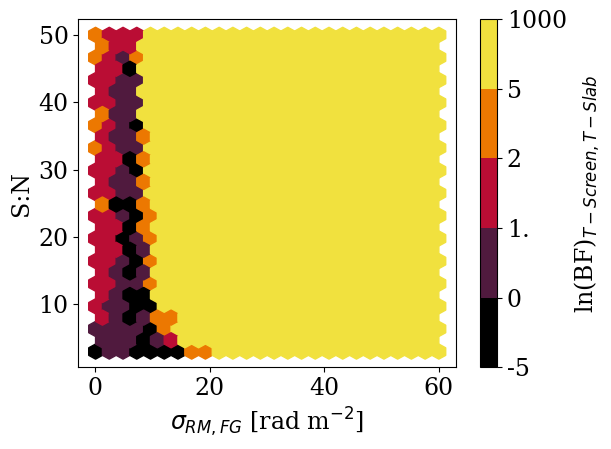

In [54]:
plt.rcParams.update({'font.size': 17})
plt.rc('font', family='serif')

hex1 = plt.hexbin(RFG_RFG_b1_merge.sigma_RM_2, RFG_RFG_b1_merge.SNR, RFG_RFG_b1_merge.evd_2_7, reduce_C_function=np.nanmedian, gridsize=25, cmap=cmap, norm=norm)
labels = ('-5', '0','1.', '2', '5' ,'1000')
cb = plt.colorbar(hex1, label='ln(BF)$_{T-Screen,T-Slab}$')
cb.ax.set_yticklabels(labels) 
plt.xlabel('$\sigma_{RM, FG}$ [rad m$^{-2}$]')
plt.ylabel('S:N')
plt.tight_layout()
plt.savefig('T_screen_Tslab_b1.pdf',format='pdf')


<>:13: SyntaxWarning:

invalid escape sequence '\s'

<>:23: SyntaxWarning:

invalid escape sequence '\s'

<>:13: SyntaxWarning:

invalid escape sequence '\s'

<>:23: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3682729724.py:13: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3682729724.py:23: SyntaxWarning:

invalid escape sequence '\s'



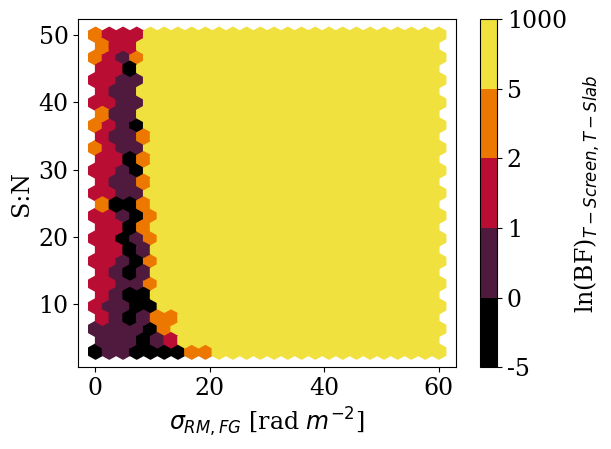

10000


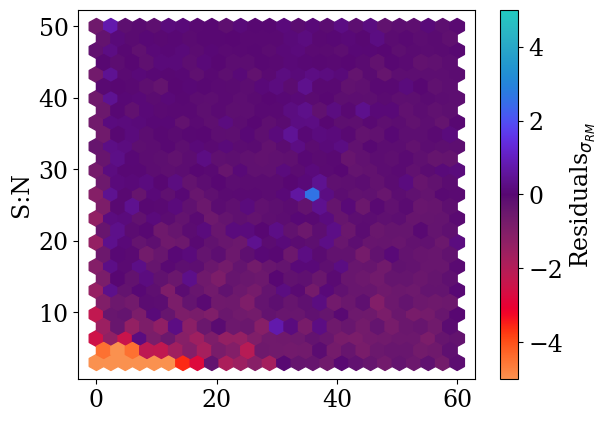

In [55]:
plt.rcParams.update({'font.size': 17})
plt.rc('font', family='serif')

bounds = [-700000, 0.0, 1.0, 2.0, 5, 7000000] 
cmap_rb = plt.get_cmap('cmr.ember')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

hex1 = plt.hexbin(RFG_RFG_b1_merge.sigma_RM_2, RFG_RFG_b1_merge.SNR, RFG_RFG_b1_merge['evd_2_7'], reduce_C_function=np.nanmedian, gridsize=25, cmap=cmap, norm=norm)
labels = ('-5', '0','1', '2', '5' ,'1000')
cb = plt.colorbar(hex1, label='ln(BF)$_{T-Screen,T-Slab}$', )
cb.ax.set_yticklabels(labels) 
plt.xlabel('$\sigma_{RM, FG}$ [rad $m^{-2}$]')
plt.ylabel('S:N')
plt.tight_layout()
plt.savefig('RFG_MS_b1.pdf', format='pdf')
plt.show()

RM_residuals = RFG_RFG_b1_merge.sigma_RM_2 - RFG_RFG_b1_merge.sigmaRM_radm2
print(len(RFG_RFG_b1_merge))
hex2 = plt.hexbin(RFG_RFG_b1_merge.sigma_RM_2, RFG_RFG_b1_merge.SNR, RM_residuals, reduce_C_function=np.nanmedian, vmax=5, vmin=-5, gridsize=25, cmap='cmr.guppy')
labels = ['<-1', '0','>1.', '>2.5', '>5' ,'100+']
cb = plt.colorbar(hex2, label='Residuals$_{\sigma_{RM}}$')
('<-1', '0','>1.', '>2.5', '>5' ,'1000')
plt.ylabel('S:N')
plt.show()


<>:4: SyntaxWarning:

invalid escape sequence '\s'

<>:11: SyntaxWarning:

invalid escape sequence '\s'

<>:4: SyntaxWarning:

invalid escape sequence '\s'

<>:11: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3987168758.py:4: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3987168758.py:11: SyntaxWarning:

invalid escape sequence '\s'



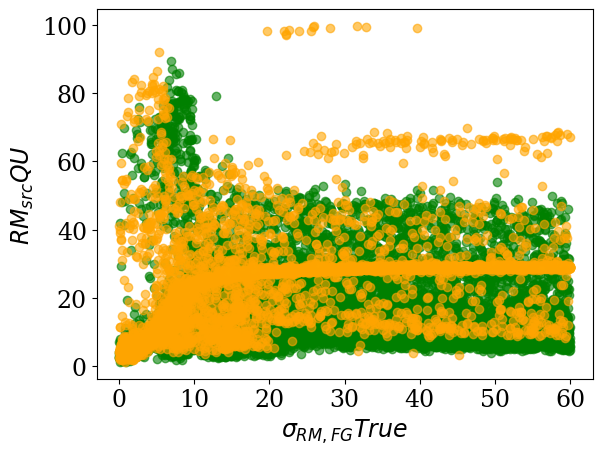

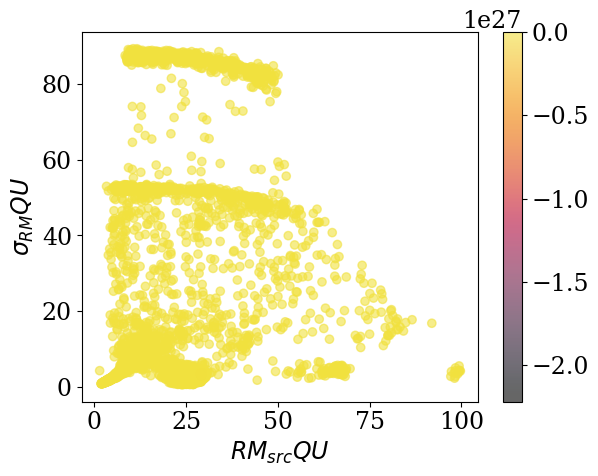

In [56]:
#Test to see what slabs they are fitting
plt.scatter(RFG_MS_comb_merge.sigma_RM_2, RFG_MS_comb_merge.deltaRM_radm2, color='green',alpha =0.6)
plt.scatter(RFG_MS_b1_merge.sigma_RM_2, RFG_MS_b1_merge.deltaRM_radm2,color='orange', alpha =0.6)
plt.xlabel('$\sigma_{RM, FG} True$')
plt.ylabel('$RM_{src} QU$')
plt.show()

#Test to see what slabs they are fitting
plt.scatter(RFG_MS_b1_merge.deltaRM_radm2, RFG_MS_b1_merge.sigmaRM_radm2, c=RFG_MS_b1_merge['evd_2_7'], alpha =0.6, cmap='cmr.ember')
plt.colorbar()
plt.ylabel('$\sigma_{RM} QU$')
plt.xlabel('$RM_{src} QU$')
plt.show()



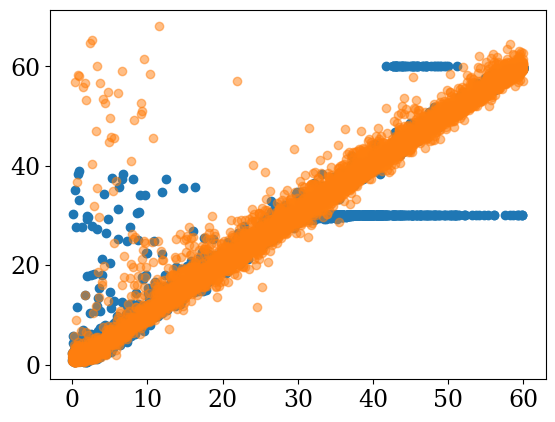

In [57]:
plt.scatter(RFG_RFG_b1_merge.sigma_RM_2, RFG_RFG_b1_merge.sigmaRM_radm2)
plt.scatter(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.sigmaRM_radm2, alpha=0.5)

In [58]:
#Combined Bands
RFG_MS_10000_comb_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/comb_RFG_condensed_sim7_model_num_10000_sims.csv')
RFG_RFG_10000_comb_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/comb_RFG_condensed_sim2_model_num_10000_sims.csv')
RFG_comb_true = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/unif_screen_lin_fg_number_10000_freq_800_1089_SNR_comb.csv')

RFG_comb_true.rename(columns={'Unnamed: 0':'src'}, inplace=True)


RFG_MS_10000_comb_df['src'] = RFG_MS_10000_comb_df['src'] - 1               
RFG_RFG_10000_comb_df['src'] = RFG_RFG_10000_comb_df['src'] - 1        

RFG_MS_comb_merge = pd.merge(RFG_MS_10000_comb_df, RFG_comb_true, on='src', how='inner')
RFG_RFG_comb_merge = pd.merge(RFG_RFG_10000_comb_df, RFG_comb_true, on='src', how='inner')

print(RFG_RFG_10000_comb_df.keys())
print(len(RFG_MS_10000_comb_df))

Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg', 'RM_radm2', 'sigmaRM_radm2',
       'fracPol_plus_err', 'psi0_deg_plus_err', 'RM_radm2_plus_err',
       'sigmaRM_radm2_plus_err', 'fracPol_minus_err', 'psi0_deg_minus_err',
       'RM_radm2_minus_err', 'sigmaRM_radm2_minus_err', 'fracPol_bounds',
       'psi0_deg_bounds', 'RM_radm2_bounds', 'sigmaRM_radm2_bounds', 'chiSq',
       'chiSqRed', 'AIC', 'AICc', 'BIC', 'ln(EVIDENCE) ', 'dLn(EVIDENCE)'],
      dtype='object')
8519


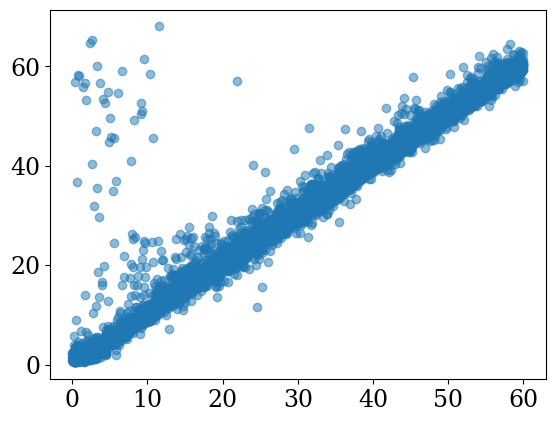

In [59]:
RFG_RFG_comb_merge['frac_pol_resid'] = RFG_RFG_comb_merge.frac_pol - RFG_RFG_comb_merge.fracPol
RFG_RFG_comb_merge['psi_resid'] = RFG_RFG_comb_merge.psi0_deg_y - RFG_RFG_comb_merge.psi0_deg_x
RFG_RFG_comb_merge['RM_resid'] = RFG_RFG_comb_merge.RM_screen_radm2 - RFG_RFG_comb_merge.RM_radm2
RFG_RFG_comb_merge['sigmaRM_radm2_resid'] = RFG_RFG_comb_merge.sigmaRM_FG - RFG_RFG_comb_merge.sigmaRM_radm2

RFG_MS_comb_merge['frac_pol_resid'] = RFG_MS_comb_merge.frac_pol - RFG_MS_comb_merge.fracPol
RFG_MS_comb_merge['psi_resid'] = RFG_MS_comb_merge.psi0_deg_y - RFG_MS_comb_merge.psi0_deg_x
RFG_MS_comb_merge['RM_resid'] = RFG_MS_comb_merge.RM_screen_radm2 - RFG_MS_comb_merge.RM_radm2
RFG_MS_comb_merge['sigmaRM_radm2_resid'] = RFG_MS_comb_merge.sigmaRM_FG - RFG_MS_comb_merge.sigmaRM_radm2


RFG_RFG_comb_merge['delta_evd_2_7'] = RFG_RFG_comb_merge['ln(EVIDENCE) '] - RFG_MS_comb_merge['ln(EVIDENCE) ']
RFG_RFG_comb_merge['delta_BIC_2_7'] = RFG_RFG_comb_merge['BIC'] - RFG_MS_comb_merge['BIC']

plt.scatter(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.sigmaRM_radm2, alpha=0.5)

### Random Foreground Screen Accuracy

<>:10: SyntaxWarning:

invalid escape sequence '\p'

<>:16: SyntaxWarning:

invalid escape sequence '\s'

<>:10: SyntaxWarning:

invalid escape sequence '\p'

<>:16: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2364381545.py:10: SyntaxWarning:

invalid escape sequence '\p'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2364381545.py:16: SyntaxWarning:

invalid escape sequence '\s'



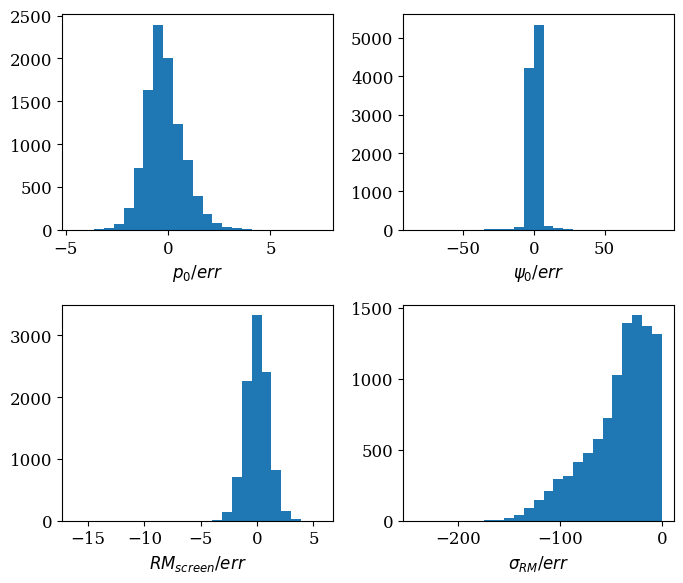

In [60]:
plt.rcParams.update({'font.size': 12})
plt.rc('font', family='serif')
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(7, 6))
import numpy as np

ax1.hist(RFG_RFG_comb_merge.frac_pol_resid/RFG_RFG_comb_merge.fracPol_plus_err, bins=25)
ax1.set_xlabel('$p_{0}/err$')

ax2.hist(RFG_RFG_comb_merge.psi_resid/RFG_RFG_comb_merge.psi0_deg_plus_err, bins=25)
ax2.set_xlabel('$\psi_{0}/err$')

ax3.hist(RFG_RFG_comb_merge.RM_resid/RFG_RFG_comb_merge.RM_radm2_plus_err, bins=25)
ax3.set_xlabel('$RM_{screen}/err$')

ax4.hist(RFG_RFG_comb_merge.sigmaRM_radm2_resid/RFG_RFG_comb_merge.sigmaRM_radm2_plus_err, bins=25)
ax4.set_xlabel('$\sigma_{RM}/err$')

plt.tight_layout()

Is there some sort of bias in the errors?

# Some sort of comparison between goodness of fit and error

# Some Sort of SNR and accuracy

In [61]:
print(RFG_RFG_comb_merge.keys())

Index(['Unnamed: 0', 'src', 'fracPol', 'psi0_deg_x', 'RM_radm2',
       'sigmaRM_radm2', 'fracPol_plus_err', 'psi0_deg_plus_err',
       'RM_radm2_plus_err', 'sigmaRM_radm2_plus_err', 'fracPol_minus_err',
       'psi0_deg_minus_err', 'RM_radm2_minus_err', 'sigmaRM_radm2_minus_err',
       'fracPol_bounds', 'psi0_deg_bounds', 'RM_radm2_bounds',
       'sigmaRM_radm2_bounds', 'chiSq', 'chiSqRed', 'AIC', 'AICc', 'BIC',
       'ln(EVIDENCE) ', 'dLn(EVIDENCE)', 'frac_pol', 'psi0_deg_y',
       'psi0_2_deg', 'RM_screen_radm2', 'RM_screen_2_radm2', 'RM_src_radm2',
       'sigma_RM_2', 'sigmaRM_FG', 'frac_pol_2_comp', 'SNR', 'model',
       'frac_pol_seed', 'RM_screen_seed', 'RM_source_seed', 'sigmaRM_seed',
       'sigma_FG_seed', 'psi0_seed', 'frac_pol_resid', 'psi_resid', 'RM_resid',
       'sigmaRM_radm2_resid', 'delta_evd_2_7', 'delta_BIC_2_7'],
      dtype='object')


# Goodness of Fit

In [62]:
bounds = [-7000, 0.0, 1.0, 2.0, 5, 70000] 
cmap_rb = plt.get_cmap('cmr.ember')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

plt.hexbin(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.SNR, RFG_RFG_comb_merge['evd_2_7'], reduce_C_function=np.nanmedian, gridsize=25, cmap=cmap, norm=norm)
plt.colorbar()
plt.show()


RM_residuals = RFG_RFG_comb_merge.sigma_RM_2 - RFG_RFG_comb_merge.sigmaRM_radm2

hex2 = plt.hexbin(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.SNR, RM_residuals, reduce_C_function=np.nanmedian, vmax=5, vmin=-5, gridsize=25, cmap='cmr.guppy')
cb = plt.colorbar(hex2, label='Residuals$_{\sigma_{RM}}$')
plt.xlabel('$\sigma_{RM, FG} True$')
plt.ylabel('S:N')
plt.show()

<>:14: SyntaxWarning:

invalid escape sequence '\s'

<>:15: SyntaxWarning:

invalid escape sequence '\s'

<>:14: SyntaxWarning:

invalid escape sequence '\s'

<>:15: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/198895658.py:14: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/198895658.py:15: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/198895658.py:14: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/198895658.py:15: SyntaxWarning:

invalid escape sequence '\s'



KeyError: 'evd_2_7'

In [ ]:

cmap_rb = plt.get_cmap('cmr.watermelon')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

plt.hexbin(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.SNR, RFG_RFG_comb_merge['evd_2_7'], vmax=700, vmin=-700, reduce_C_function=np.nanmean, gridsize=25, cmap='cmr.watermelon',)






plt.colorbar()

plt.show()

In [ ]:
from matplotlib.colors import ListedColormap 
bottom = plt.get_cmap('cmr.dusk_r', 1)
top= plt.get_cmap('cmr.sapphire', 255)
newcolors = np.vstack((top(np.linspace(0, 1, 255)),
                bottom(np.linspace(0, 0.09, 1))))
newcmp = ListedColormap(newcolors, name='embersaph')

plt.hexbin(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.SNR, RFG_RFG_comb_merge['delta_BIC_2_7'], vmax=700, vmin=-700, reduce_C_function=np.nanmedian, gridsize=25, cmap='cmr.watermelon')
plt.colorbar()






plt.show()

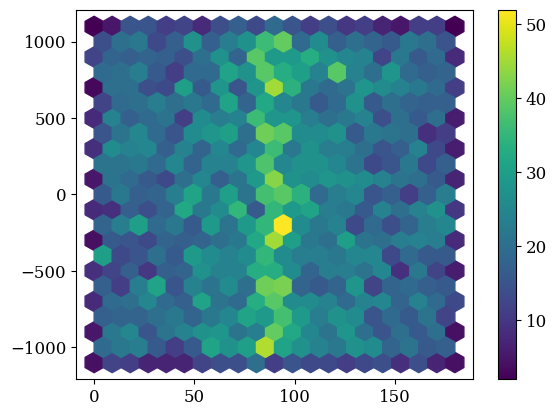

In [63]:
plt.hexbin(RFG_RFG_10000_comb_df.psi0_deg, RFG_RFG_10000_comb_df.RM_radm2, reduce_C_function=np.sum, gridsize=20)
plt.colorbar()
plt.show()

In [64]:
b1_RFG_condensed_sim7_model_num_10000_sims

NameError: name 'b1_RFG_condensed_sim7_model_num_10000_sims' is not defined

In [ ]:
RFG_MS_10000_b1_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/b1_RFG_condensed_sim7_model_num_10000_sims.csv')
RFG_RFG_10000_b1_df = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/b1_RFG_condensed_sim2_model_num_10000_sims.csv')
RFG_b1_true = pd.read_csv('/Users/loberhel/Desktop/Simulated_sources_code/RFGscreen/unif_screen_lin_fg_number_10000_freq_800_1089_SNR_band1.csv')

RFG_b1_true.rename(columns={'Unnamed: 0':'src'}, inplace=True)


RFG_MS_10000_b1_df['src'] = RFG_MS_10000_b1_df['src'] - 1               
RFG_RFG_10000_b1_df['src'] = RFG_RFG_10000_b1_df['src'] - 1        

RFG_MS_b1_merge = pd.merge(RFG_MS_10000_b1_df, RFG_b1_true, on='src', how='inner')
RFG_RFG_b1_merge = pd.merge(RFG_RFG_10000_b1_df, RFG_b1_true, on='src', how='inner')

RFG_RFG_b1_merge.keys()
print(len(RFG_RFG_10000_b1_df))







In [65]:
RFG_RFG_b1_merge['delta_evd_2_7'] = RFG_RFG_b1_merge['ln(EVIDENCE) '] - RFG_MS_b1_merge['ln(EVIDENCE) ']

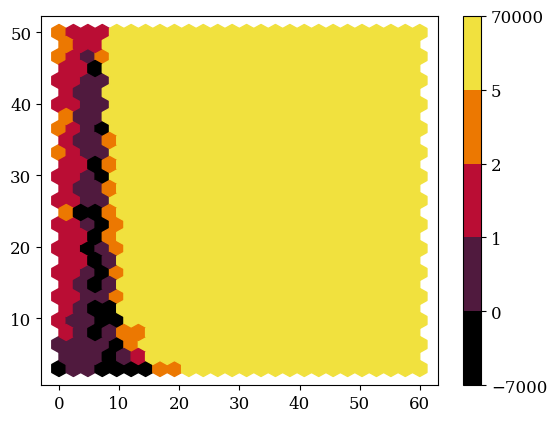

In [66]:
bounds = [-7000, 0.0, 1.0, 2.0, 5, 70000] 
cmap_rb = plt.get_cmap('cmr.ember')
colors = cmap_rb(np.linspace(0, 1, len(bounds) - 1))
cmap, norm = mcolors.from_levels_and_colors(bounds, colors)

plt.hexbin(RFG_RFG_b1_merge.sigma_RM_2, RFG_RFG_b1_merge.SNR, RFG_RFG_b1_merge['delta_evd_2_7'], reduce_C_function=np.nanmedian, gridsize=25, cmap=cmap, norm=norm)
plt.colorbar()
plt.show()




# PAPER PLOT

<>:19: SyntaxWarning:

invalid escape sequence '\s'

<>:29: SyntaxWarning:

invalid escape sequence '\s'

<>:32: SyntaxWarning:

invalid escape sequence '\p'

<>:34: SyntaxWarning:

invalid escape sequence '\s'

<>:19: SyntaxWarning:

invalid escape sequence '\s'

<>:29: SyntaxWarning:

invalid escape sequence '\s'

<>:32: SyntaxWarning:

invalid escape sequence '\p'

<>:34: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2970197105.py:19: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2970197105.py:29: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2970197105.py:32: SyntaxWarning:

invalid escape sequence '\p'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/2970197105.py:34: SyntaxWarning:

invalid escape sequence '\s'



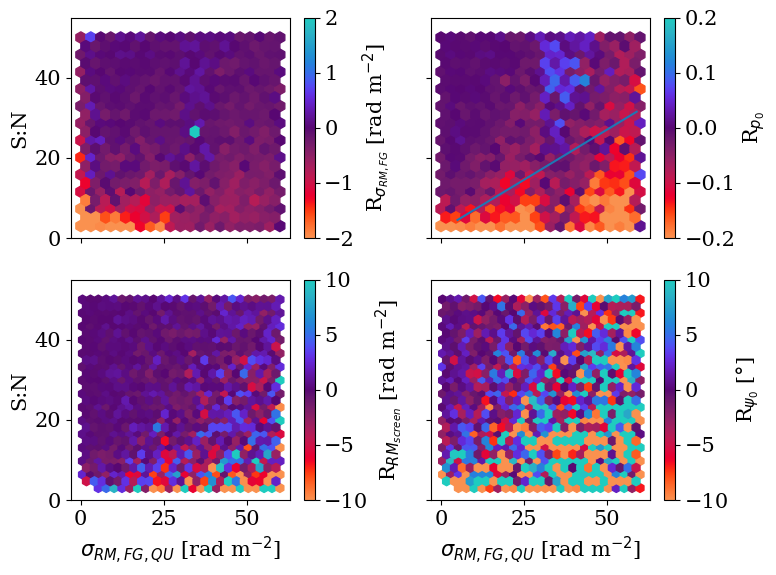

In [88]:
#True - fitted
def formula(x):
    return 0.5*(x)+2

x = np.arange(5,60,1)  
y = formula(x) 


plt.rcParams.update({'font.size': 15})
sigma_redi_b1 = (RFG_RFG_b1_merge.sigma_RM_2 - RFG_RFG_b1_merge.sigmaRM_radm2) 
p_redi_b1 = RFG_RFG_b1_merge.frac_pol - RFG_RFG_b1_merge.fracPol
psi_redi_b1 = (RFG_RFG_b1_merge.psi0_deg_y - RFG_RFG_b1_merge.psi0_deg_x) 
RM_redi_b1 = (RFG_RFG_b1_merge.RM_screen_radm2 - RFG_RFG_b1_merge.RM_radm2)

fig, ax = plt.subplots(nrows=2, ncols=2, sharey=True, sharex=True, figsize=(8, 6))


hex_sigma = ax[0][0].hexbin( RFG_RFG_b1_merge.sigma_RM_2, RFG_RFG_b1_merge.SNR, sigma_redi_b1, reduce_C_function=np.nanmedian, gridsize=20, vmin=-2, vmax=2, cmap='cmr.guppy')
color_sigma = plt.colorbar(hex_sigma, label='R$_{\sigma_{RM,FG}}$ [rad m$^{-2}$]')
ax[0][0].set_ylim(0,55)

hex_p = ax[0][1].hexbin(RFG_RFG_b1_merge.sigma_RM_2, RFG_RFG_b1_merge.SNR, p_redi_b1, reduce_C_function=np.nanmean, gridsize=20, vmin=-0.2, vmax=0.2, cmap='cmr.guppy')
plt.colorbar(hex_p, label='R$_{p_{0}}$')
ax[0][1].plot(x,y)

hex_RM = ax[1][0].hexbin(RFG_RFG_b1_merge.sigmaRM_radm2, RFG_RFG_b1_merge.SNR, RM_redi_b1, vmin=-10, vmax=10, reduce_C_function=np.nanmedian, gridsize=25, cmap='cmr.guppy')
plt.colorbar(hex_RM, label='R$_{RM_{screen}}$ [rad m$^{-2}$]')
ax[1][0].set_ylabel('S:N')
ax[1][0].set_xlabel('$\sigma_{RM,FG, QU}$ [rad m$^{-2}$]')

hex_psi = ax[1][1].hexbin(RFG_RFG_b1_merge.sigmaRM_radm2, RFG_RFG_b1_merge.SNR, psi_redi_b1, vmin=-10, vmax=10, reduce_C_function=np.nanmedian, gridsize=25, cmap='cmr.guppy')
plt.colorbar(hex_psi, label='R$_{\psi_{0}}$ [$\degree$]')
ax[0][0].set_ylabel('S:N')
ax[1][1].set_xlabel('$\sigma_{RM,FG, QU}$ [rad m$^{-2}$]')
plt.tight_layout()

plt.savefig('RFG_accuracy_b1.pdf', format='pdf')

<>:45: SyntaxWarning:

invalid escape sequence '\s'

<>:45: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/686148448.py:45: SyntaxWarning:

invalid escape sequence '\s'



6661    6661
8429    8429
1938    1938
7840    7840
6770    6770
696      696
1530    1530
8472    8472
308      308
4275    4275
4344    4344
3682    3682
8062    8062
7829    7829
899      899
592      592
7626    7626
515      515
8090    8090
5127    5127
298      298
1376    1376
5106    5106
1428    1428
1150    1150
650      650
155      155
2246    2246
5114    5114
7118    7118
8328    8328
5307    5307
484      484
Name: src, dtype: int64


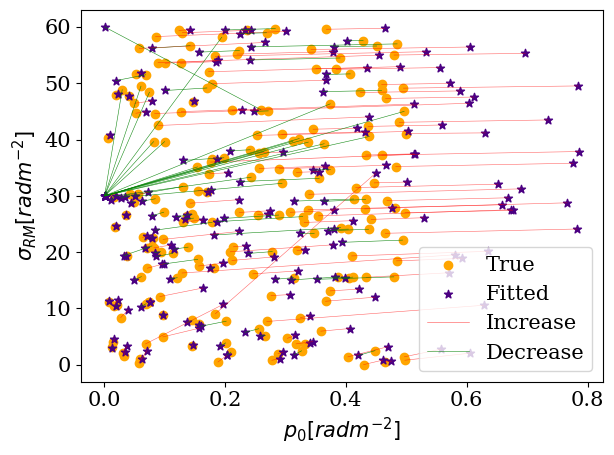

In [68]:
#### plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 15})
N = 200
indices = np.random.randint(0,9000,size=N)

plt.scatter(y=RFG_RFG_b1_merge.sigma_RM_2[indices], x=RFG_RFG_b1_merge.frac_pol[indices], c='orange', label='True')
plt.scatter(y=RFG_RFG_b1_merge.sigmaRM_radm2[indices], x=RFG_RFG_b1_merge.fracPol[indices], c='indigo', marker="*", label='Fitted')

xs = RFG_RFG_b1_merge.sigma_RM_2[indices]
ys = RFG_RFG_b1_merge.frac_pol[indices]

x1s = RFG_RFG_b1_merge.sigmaRM_radm2[indices]
y1s = RFG_RFG_b1_merge.fracPol[indices]

xs = np.asarray(xs)
ys = np.asarray(ys)

x1s = np.asarray(x1s)
y1s = np.asarray(y1s)
j=0
k=0

for i in range(0,N):

        
    if (ys[i] < y1s[i]):
        #If the fitted parameter is too large
        if j == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', label='Increase', linewidth=0.4, alpha=0.7)
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', linewidth=0.4, alpha=0.6)
        j += 1
        
    else:
        #If the fitted parameter is too small
        if k == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g',linewidth=0.4, alpha=0.9, label='Decrease')
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g', linewidth=0.4, alpha=0.9)

        k += 1

print(RFG_RFG_b1_merge.src[indices][(RFG_RFG_b1_merge.fracPol[indices] < 0.05) & (RFG_RFG_b1_merge.sigmaRM_radm2[indices] < 33)])
plt.xlabel('$p_{0} [rad  m^{-2}]$')
plt.ylabel('$\sigma_{RM} [rad m^{-2}]$')
plt.legend()
plt.tight_layout()
plt.savefig('RFG_motion_sigma_b1.pdf', format='pdf')

In [69]:
print('sigma Mean {} Median {} Std {}'.format(np.nanmean(sigma_redi_b1), np.median(sigma_redi_b1), np.std(sigma_redi_b1)))
print('RM Mean {} Median {} Std {}'.format(np.nanmean(RM_redi_b1), np.nanmedian(RM_redi_b1), np.std(RM_redi_b1)))
print('fracpol Mean {} Median {} Std {}'.format(np.nanmean(p_redi_b1), np.median(p_redi_b1), np.std(p_redi_b1)))


sigma Mean 0.05030023584015622 Median nan Std 3.2747237890786516
RM Mean 0.5414025608555056 Median -0.037600591121304205 Std 56.89391333235555
fracpol Mean -0.04342456608778156 Median nan Std 0.14866230563521488


<>:23: SyntaxWarning:

invalid escape sequence '\s'

<>:33: SyntaxWarning:

invalid escape sequence '\s'

<>:36: SyntaxWarning:

invalid escape sequence '\p'

<>:37: SyntaxWarning:

invalid escape sequence '\s'

<>:23: SyntaxWarning:

invalid escape sequence '\s'

<>:33: SyntaxWarning:

invalid escape sequence '\s'

<>:36: SyntaxWarning:

invalid escape sequence '\p'

<>:37: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3070143455.py:23: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3070143455.py:33: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3070143455.py:36: SyntaxWarning:

invalid escape sequence '\p'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/3070143455.py:37: SyntaxWarning:

invalid escape sequence '\s'



9858


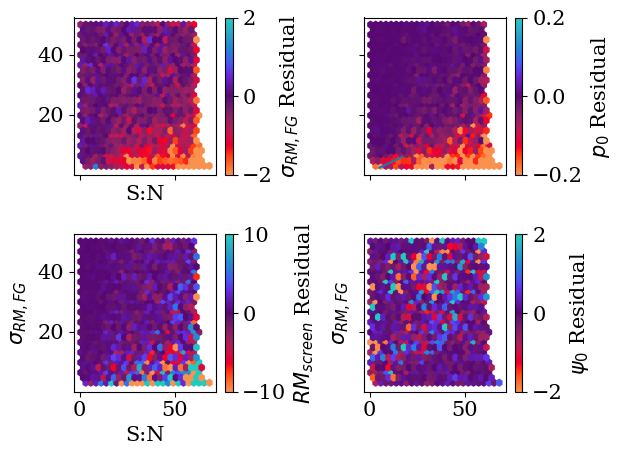

In [79]:
#True - fitted
def formula(x):
    return 0.3*(x+3) 

x = np.arange(5,18,1)  
y = formula(x) 


#Combined Band
print(len(RFG_RFG_comb_merge))
plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 15})

#True - fitted
sigma_redi_comb = (RFG_RFG_comb_merge.sigma_RM_2 - RFG_RFG_comb_merge.sigmaRM_radm2) / RFG_RFG_comb_merge.sigmaRM_radm2_plus_err
p_redi_comb = RFG_RFG_comb_merge.frac_pol - RFG_RFG_comb_merge.fracPol
psi_redi_comb = (RFG_RFG_comb_merge.psi0_deg_y - RFG_RFG_comb_merge.psi0_deg_x) / RFG_RFG_comb_merge.psi0_deg_plus_err
RM_redi_comb = RFG_RFG_comb_merge.RM_screen_radm2 - RFG_RFG_comb_merge.RM_radm2

fig, ax = plt.subplots(nrows=2, ncols=2, sharey=True, sharex=True)

hex_sigma = ax[0][0].hexbin(RFG_RFG_comb_merge.sigmaRM_radm2, RFG_RFG_comb_merge.SNR, sigma_redi_comb, reduce_C_function=np.nanmean, gridsize=25, vmin=-2, vmax=2, cmap='cmr.guppy')
color_sigma = plt.colorbar(hex_sigma, label='$\sigma_{RM,FG}$ Residual')
ax[0][0].set_xlabel('S:N')

hex_p = ax[0][1].hexbin(RFG_RFG_comb_merge.sigmaRM_radm2, RFG_RFG_comb_merge.SNR, p_redi_comb, reduce_C_function=np.nanmedian, gridsize=25, vmin=-0.2, vmax=0.2, cmap='cmr.guppy')
plt.colorbar(hex_p, label='$p_{0}$ Residual')
ax[0][1].plot(x,y)

hex_RM = ax[1][0].hexbin(RFG_RFG_comb_merge.sigmaRM_radm2, RFG_RFG_comb_merge.SNR, RM_redi_comb, vmin=-10, vmax=10,  reduce_C_function=np.nanmedian, gridsize=25, cmap='cmr.guppy')
plt.colorbar(hex_RM, label='$RM_{screen}$ Residual')
ax[1][0].set_xlabel('S:N')
ax[1][0].set_ylabel('$\sigma_{RM,FG}$')

hex_psi = ax[1][1].hexbin(RFG_RFG_comb_merge.sigmaRM_radm2, RFG_RFG_comb_merge.SNR, psi_redi_comb, vmin=-2, vmax=2, reduce_C_function=np.nanmean, gridsize=25, cmap='cmr.guppy')
plt.colorbar(hex_psi, label='$\psi_{0}$ Residual')
ax[1][1].set_ylabel('$\sigma_{RM,FG}$')

plt.tight_layout()
plt.savefig('RFG_comb_accuracy.pdf', format='pdf')


<>:45: SyntaxWarning:

invalid escape sequence '\s'

<>:45: SyntaxWarning:

invalid escape sequence '\s'

/var/folders/89/zgv9nv5563n89pzs55bv6mzm0000gq/T/ipykernel_5195/4178870634.py:45: SyntaxWarning:

invalid escape sequence '\s'



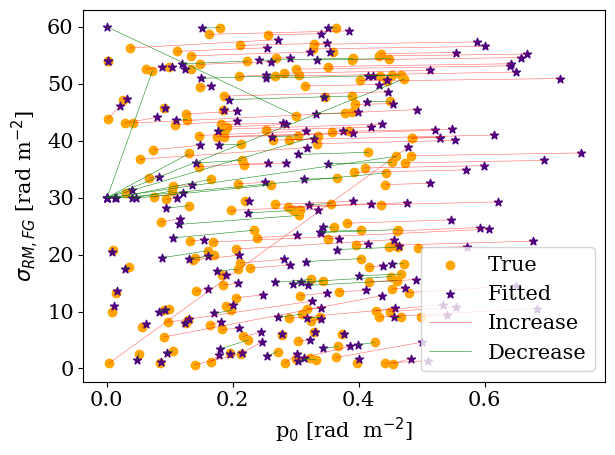

In [80]:
plt.rc('font', family='serif')
plt.rcParams.update({'font.size': 15})
N = 200
indices = np.random.randint(0,9000,size=N)

plt.scatter(y=RFG_RFG_b1_merge.sigma_RM_2[indices], x=RFG_RFG_b1_merge.frac_pol[indices], c='orange', label='True')
plt.scatter(y=RFG_RFG_b1_merge.sigmaRM_radm2[indices], x=RFG_RFG_b1_merge.fracPol[indices], c='indigo', marker="*", label='Fitted')

xs = RFG_RFG_b1_merge.sigma_RM_2[indices]
ys = RFG_RFG_b1_merge.frac_pol[indices]

x1s = RFG_RFG_b1_merge.sigmaRM_radm2[indices]
y1s = RFG_RFG_b1_merge.fracPol[indices]

xs = np.asarray(xs)
ys = np.asarray(ys)

x1s = np.asarray(x1s)
y1s = np.asarray(y1s)
j=0
k=0

for i in range(0,N):

        
    if (ys[i] < y1s[i]):
        #If the fitted parameter is too large
        if j == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', label='Increase', linewidth=0.4, alpha=0.7)
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='r', linewidth=0.4, alpha=0.6)
        j += 1
        
    else:
        #If the fitted parameter is too small
        if k == 0:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g',linewidth=0.4, alpha=0.9, label='Decrease')
        else:
            plt.plot([ys[i],y1s[i]], [xs[i],x1s[i]], c='g', linewidth=0.4, alpha=0.9)

        k += 1

      
plt.xlabel('p$_{0}$ [rad  m$^{-2}$]')
plt.ylabel('$\sigma_{RM, FG}$ [rad m$^{-2}$]')
plt.legend()
plt.tight_layout()
plt.savefig('RFG_b1_motion.pdf', format='pdf')

# Errorbars

9603
9353
9990
9992


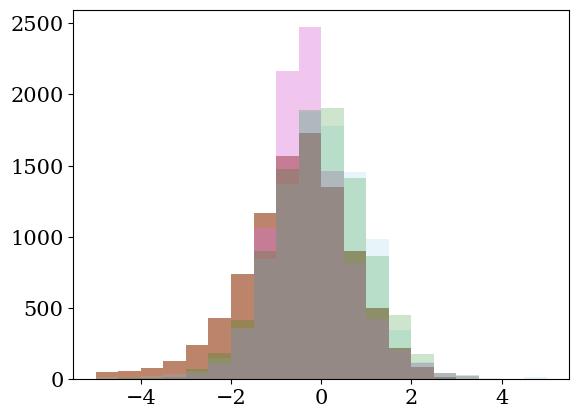

sigma Mean 4.88581037023941 Median -0.41306953059131024 Std 51.27168193406995
RM Mean -0.00798744799002404 Median -0.011632105542932878 Std 1.9448684313827012
p Mean -0.22562589902269936 Median -0.32608463485558653 Std 0.976481204210185
psi Mean -0.017387392371529024 Median 0.0009267466554979035 Std 3.8595890028827546


In [72]:
sigma_redi_b1_err = sigma_redi_b1 /  RFG_RFG_b1_merge.sigmaRM_radm2_plus_err
p_redi_b1_err = p_redi_b1 / RFG_RFG_b1_merge.fracPol_plus_err
psi_redi_b1_err = psi_redi_b1 / RFG_RFG_b1_merge.psi0_deg_plus_err
RM_redi_b1_err = RM_redi_b1 / RFG_RFG_b1_merge.RM_radm2_plus_err


sigma_redi_b1_err = sigma_redi_b1_err[np.isfinite(sigma_redi_b1_err) & (abs(sigma_redi_b1_err)<1000)]
p_redi_b1_err = p_redi_b1_err[np.isfinite(p_redi_b1_err) & (abs(p_redi_b1_err)<10)]
psi_redi_b1_err = psi_redi_b1_err[np.isfinite(psi_redi_b1_err) & (abs(psi_redi_b1_err)<1000)]
RM_redi_b1_err = RM_redi_b1_err[(np.isfinite(RM_redi_b1_err)) & (abs(RM_redi_b1_err)<1000)]

print(len(sigma_redi_b1_err))
print(len(p_redi_b1_err))
print(len(psi_redi_b1_err))
print(len(RM_redi_b1_err))

plt.hist(sigma_redi_b1_err, range = [-5,5], bins=20, alpha = 0.7, color='sienna')
plt.hist(p_redi_b1_err,range = [-5,5], bins=20, alpha = 0.4, color='orchid')
plt.hist(psi_redi_b1_err, range = [-5,5], bins=20, alpha = 0.2, color='skyblue')
plt.hist(RM_redi_b1_err,range = [-5,5], bins=20, alpha = 0.2, color='green')
plt.show()


print('sigma Mean {} Median {} Std {}'.format(np.mean(sigma_redi_b1_err), np.nanmedian(sigma_redi_b1_err), np.nanstd(sigma_redi_b1_err)))
print('RM Mean {} Median {} Std {}'.format(np.mean(RM_redi_b1_err), np.nanmedian(RM_redi_b1_err), np.nanstd(RM_redi_b1_err)))
print('p Mean {} Median {} Std {}'.format(np.mean(p_redi_b1_err), np.median(p_redi_b1_err), np.std(p_redi_b1_err)))
print('psi Mean {} Median {} Std {}'.format(np.mean(psi_redi_b1_err), np.median(psi_redi_b1_err), np.nanstd(psi_redi_b1_err)))


sigma Mean -0.4453397016660298 Median -0.3285518205540131 Std 2.0632746110996667
RM Mean -0.0027028712701213883 Median 0.0030756423179447313 Std 1.0266783547434295
p Mean -0.17974145084841542 Median -0.2711083686333988 Std 0.9276574695408728
psi Mean 0.0030154749445291387 Median 0.00010760078064553187 Std 0.9497504979917749


(array([1.000e+00, 0.000e+00, 4.000e+00, 1.300e+01, 7.200e+01, 1.590e+02,
        4.130e+02, 8.950e+02, 1.486e+03, 1.875e+03, 1.904e+03, 1.474e+03,
        9.290e+02, 3.920e+02, 1.620e+02, 5.200e+01, 1.900e+01, 6.000e+00,
        0.000e+00, 0.000e+00]),
 array([-5. , -4.5, -4. , -3.5, -3. , -2.5, -2. , -1.5, -1. , -0.5,  0. ,
         0.5,  1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ]),
 <BarContainer object of 20 artists>)

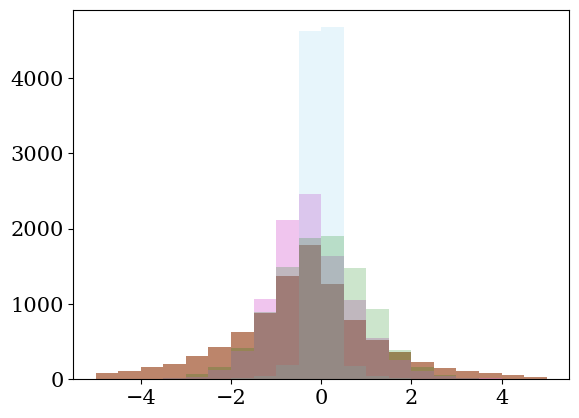

In [73]:
sigma_redi_comb_err = sigma_redi_comb /  RFG_RFG_comb_merge.sigmaRM_radm2_plus_err
p_redi_comb_err = p_redi_comb / RFG_RFG_comb_merge.fracPol_plus_err
psi_redi_comb_err = psi_redi_comb / RFG_RFG_comb_merge.psi0_deg_plus_err
RM_redi_comb_err = RM_redi_comb / RFG_RFG_comb_merge.RM_radm2_plus_err


sigma_redi_comb_err = sigma_redi_comb_err[np.isfinite(sigma_redi_comb_err) & (abs(sigma_redi_comb_err)<1000)]
p_redi_comb_err = p_redi_comb_err[np.isfinite(p_redi_comb_err) & (abs(p_redi_comb_err)<10)]
psi_redi_comb_err = psi_redi_comb_err[np.isfinite(psi_redi_comb_err) & (abs(psi_redi_comb_err)<1000)]
RM_redi_comb_err = RM_redi_comb_err[(np.isfinite(RM_redi_comb_err)) & (abs(RM_redi_comb_err)<1000)]

print('sigma Mean {} Median {} Std {}'.format(np.mean(sigma_redi_comb_err), np.nanmedian(sigma_redi_comb_err), np.nanstd(sigma_redi_comb_err)))
print('RM Mean {} Median {} Std {}'.format(np.mean(RM_redi_comb_err), np.nanmedian(RM_redi_comb_err), np.nanstd(RM_redi_comb_err)))
print('p Mean {} Median {} Std {}'.format(np.mean(p_redi_comb_err), np.median(p_redi_comb_err), np.std(p_redi_comb_err)))
print('psi Mean {} Median {} Std {}'.format(np.mean(psi_redi_comb_err), np.median(psi_redi_comb_err), np.nanstd(psi_redi_comb_err)))


plt.hist(sigma_redi_comb_err, range = [-5,5], bins=20, alpha = 0.7, color='sienna')
plt.hist(p_redi_comb_err,range = [-5,5], bins=20, alpha = 0.4, color='orchid')
plt.hist(psi_redi_comb_err, range = [-5,5], bins=20, alpha = 0.2, color='skyblue')
plt.hist(RM_redi_comb_err,range = [-5,5], bins=20, alpha = 0.2, color='green')


In [74]:
RM_screen_residuals = RFG_RFG_comb_merge.RM_screen_radm2 - RFG_RFG_comb_merge.RM_radm2
psi_residuals = RFG_RFG_comb_merge.psi0_deg_y - RFG_RFG_comb_merge.psi0_deg_x
frac_residuals = RFG_RFG_comb_merge.frac_pol - RFG_RFG_comb_merge.fracPol
sigma_residuals = RFG_RFG_comb_merge.sigma_RM_2 - RFG_RFG_comb_merge.sigmaRM_radm2)

print(RFG_RFG_comb_merge.keys())




SyntaxError: unmatched ')' (2535979336.py, line 4)

In [ ]:
hex2 = plt.hexbin(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.SNR, frac_residuals, reduce_C_function=np.nanmedian, vmax=0.5, vmin=-0.5, gridsize=25, cmap='cmr.guppy')
cb = plt.colorbar(hex2, label='Residuals$_{p_{0}}$')
plt.xlabel('$\sigma_{RM, FG} True$')
plt.ylabel('S:N')
plt.show()

hex2 = plt.hexbin(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.SNR, RM_screen_residuals, reduce_C_function=np.nanmedian, vmax=5, vmin=-5, gridsize=25, cmap='cmr.guppy')
cb = plt.colorbar(hex2, label='Residuals$_{\sigma_{RM}}$')
plt.xlabel('$\sigma_{RM, FG} True$')
plt.ylabel('S:N')
plt.show()

hex2 = plt.hexbin(RFG_RFG_comb_merge.sigma_RM_2, RFG_RFG_comb_merge.SNR, psi_residuals, reduce_C_function=np.nanmedian, vmax=5, vmin=-5, gridsize=25, cmap='cmr.guppy')
cb = plt.colorbar(hex2, label='Residuals$_{\sigma_{RM}}$')
plt.xlabel('$\sigma_{RM, FG} True$')
plt.ylabel('S:N')
plt.show()

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, sharey=True, figsize=(8, 8))
bin_num = 25

ax1.hist(frac_residuals, range=[-10,10], bins= bin_num)
ax1.set_xlabel('$p_{0}$')
ax2.hist(RM_screen_residuals, range=[-50,50], bins= bin_num)
ax2.set_xlabel('$RM_{screen}$')

ax3.hist(psi_residuals, range=[-50,50], bins= bin_num)
ax3.set_xlabel('$\psi_{0}$')
ax4.hist(sigma_residuals, range=[-5,5], bins= bin_num)
ax4.set_xlabel('$\sigma_{RM}$')

plt.tight_layout()
plt.show()